### pip!!!

In [1]:
!pip install gensim==4.3 -i https://pypi.doubanio.com/simple

Looking in indexes: https://pypi.doubanio.com/simple
ERROR: Operation cancelled by user


In [2]:
!pip install tensorflow==2.12

ERROR: Operation cancelled by user


# Wolof LLM (Test - dont use now)

In [ ]:
# Use a pipeline as a high-level helper
from transformers import pipeline

pipe = pipeline("text2text-generation", model="soynade-research/Oolel-v0.1")

In [ ]:
# Load model directly
from transformers import AutoTokenizer, AutoModelForCausalLM

tokenizer = AutoTokenizer.from_pretrained("soynade-research/Oolel-v0.1")
model = AutoModelForCausalLM.from_pretrained("soynade-research/Oolel-v0.1")

In [ ]:
from transformers import AutoModelForCausalLM, AutoTokenizer
import torch

device = "cuda"

model = AutoModelForCausalLM.from_pretrained(
    "soynade-research/Oolel-v0.1",
    torch_dtype = torch.bfloat16,
    device_map="auto")

tokenizer = AutoTokenizer.from_pretrained("soynade-research/Oolel-v0.1")

def generate_response(messages, max_new_tokens=1024, temperature=0.1):
    text = tokenizer.apply_chat_template(
          messages,
          tokenize=False,
          add_generation_prompt=True
)
    model_inputs = tokenizer([text], return_tensors="pt").to(device)
    generated_ids = model.generate(model_inputs.input_ids, max_new_tokens=max_new_tokens, temperature=temperature)

    generated_ids = [
    output_ids[len(input_ids):] for input_ids, output_ids in zip(model_inputs.input_ids, generated_ids)]
    response = tokenizer.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return response


In [ ]:
system_prompt = "You're a Wolof AI assistant. Please always provide detailed and useful answers to the user queries."
messages = [
    {"role": "system", "content": system_prompt},
    {"role": "user", "content": "tell me one story in Wolof"}
]
print(generate_response(messages))

# **import**

In [ ]:
import re
import unicodedata
import nltk
import random
import numpy as np
import pandas as pd
from collections import Counter
from nltk.corpus import stopwords

In [ ]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))
print(stop_words)

{'ve', 'ourselves', "mustn't", 'she', 'until', 'when', 'more', 't', 'y', "mightn't", 'now', 'again', 'was', 'our', 'i', 'under', 'other', 'with', 'same', "it's", 'is', 'shan', 'both', 'd', 'has', "i'm", 'only', 'then', 'hers', 'm', "we'd", "they'd", 'who', 'own', 'against', "aren't", 'those', "you'd", 'ain', 'be', 'had', 'than', 'me', 're', 'they', "shan't", 'her', 'there', 'hadn', "isn't", 'hasn', 'that', 'weren', "she'd", "you're", 'mustn', 'll', 'can', 'he', 'before', "she's", 'or', 'the', 'am', 'yourself', 'don', 'it', 'below', 'won', 'being', "i've", 'to', 'mightn', "i'll", 'why', 'yourselves', 'him', 'where', "we've", "don't", 'doesn', "should've", 'because', 'about', 'few', "didn't", 'do', 'been', "he's", "haven't", 'ours', 'further', 'a', 'above', 'have', 'herself', 'their', 'into', 'did', 'if', 'through', 'here', "hadn't", "i'd", 'itself', 'your', 'for', 'whom', 'themselves', "you'll", "you've", 'most', 'all', "hasn't", 'too', "weren't", 'in', 'having', 'are', 'them', 'haven',

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


# **Data Analyze**

In [ ]:
with open('human_wolof.txt', 'r', encoding='utf-8') as file:
    human_wolof = file.read()

with open('human_aguaruna.txt', 'r', encoding='utf-8') as file:
    human_aguaruna = file.read()

with open('bot_wolof.txt', 'r', encoding='utf-8') as file:
    bot_wolof = file.read()

with open('bot_aguaruna.txt', 'r', encoding='utf-8') as file:
    bot_aguaruna = file.read()

In [ ]:
def summarize_text(text):

  num_words = len(text.split())
  num_chars = len(text)

  print(f"Number of words: {num_words}")
  print(f"Number of characters: {num_chars}")
  print(f"First 20 words: {text.split()[:20]}")

In [ ]:
summarize_text(human_wolof)
summarize_text(human_aguaruna)

Number of words: 76227
Number of characters: 367831
First 20 words: ['Noonu', 'ma', 'xool', 'ko', 'lu', 'yàgg,', 'daldi', 'yëngal', 'ndànk', 'sama', 'bopp,', 'ni', 'ko', ':', 'Àddina', ':', 'dund,', 'dee.', 'Leneen', 'newu']
Number of words: 93974
Number of characters: 733507
First 20 words: ['Eme', 'anentsan', 'agatajime.', 'Yabai', 'tikish', 'chícham', 'aidaun', 'jui', 'ukuajai,', 'shig', 'unuimagtajum', 'iina', 'chichamen', 'chichaku', 'jutiishkam', 'eme', 'wajamí.', 'Juke', 'yabaikik,', 'inia']


In [ ]:
summarize_text(bot_wolof)
summarize_text(bot_aguaruna)

Number of words: 1772
Number of characters: 8673
First 20 words: ['Waa', 'seeni', 'doom', 'bi', 'seeni,', 'seeni', 'mu', 'ñu', 'seen', 'nga', 'yennu', 'seeni', 'jëf', 'biir', 'seeni', 'ci', 'seeni', 'gëna', 'biir', 'seeni,']
Number of words: 871
Number of characters: 6242
First 20 words: ['Yamajam', 'anen', 'Bibilia', 'Bibilia', 'nim', 'awijaim', 'anen', 'pujujish', 'kautun', 'inka.', 'Yamajam', 'anen', 'Salmos,', 'himnos', 'timashpi', 'aents', 'apu', 'orapitkai', 'pujuwai', 'wakpa']


# **Data Processing&Cleaning**

### Clean

In [ ]:
def clean_text(text):

    text = ''.join(c for c in unicodedata.normalize('NFD', text)
                  if unicodedata.category(c) != 'Mn')

    cleaned_text = re.sub(r'[^a-zA-Z\s]', '', text).lower()
    return cleaned_text.strip()


In [ ]:
human_wolof = clean_text(human_wolof)
human_aguaruna = clean_text(human_aguaruna)

In [ ]:
bot_wolof = clean_text(bot_wolof)
bot_aguaruna = clean_text(bot_aguaruna)

### find stop words

#### wolof

Dictionary

In [ ]:
df = pd.read_csv('wolof-en.csv', names=['english', 'wolof'])

stopwords_wolof = []
dict_wolof = []

for index, row in df.iterrows():
    if isinstance(row['english'], str):
        words = row['english'].split()
        for word in words:
            if word.lower() in stop_words:
                stopwords_wolof.append(row['wolof'])
                # print(row)
            else:
                dict_wolof.append(row['wolof'])

###
stopwords_wolof_text = " ".join(stopwords_wolof)
print(stopwords_wolof_text)
stopwords_wolof = clean_text(stopwords_wolof_text)
stopwords_wolof = list(set(stopwords_wolof.split()))
print(stopwords_wolof)

Ak Ak Am Ba ci Ban Bari Barki demb Bat tay Bawoo Begge Beneen Benn Benn waxtu Benn yoon Bii Bosam Boyet Bu ci nekk Ci Ci Ci Ci kanamu Ci kanamu Ci kaw Ci kaw Deet Deet Deet Deet Def Diggante Fan Fay Fii Fii Ganaaw suba Genn Genn Itam Jege Kan Kan Kese Ki Kooku Laata Lan Leegi Lepp Li ci topp lii Lool Lu neel Lu neew Lu tax Man Men Men Moom Moom Naaryepp Naata Naka Ndax Nekk Noom Noppi Nun Pollu mbaliit Sa Sama Seen Seet Sudee Sunu Suuf Suuf Sój Sój takk Toppatoor Waaye Wala Yakkamti Yakkamti Yaw Yaw Yeewu Yeneen Yenn
['seet', 'lii', 'mbaliit', 'waaye', 'yeneen', 'naka', 'bii', 'ba', 'seen', 'yaw', 'kan', 'ak', 'lu', 'toppatoor', 'men', 'sama', 'takk', 'ci', 'lan', 'fii', 'ban', 'begge', 'lepp', 'naata', 'am', 'beneen', 'sunu', 'boyet', 'bosam', 'moom', 'neel', 'leegi', 'ki', 'fan', 'yeewu', 'sa', 'li', 'demb', 'deet', 'fay', 'lool', 'man', 'jege', 'naaryepp', 'soj', 'suba', 'waxtu', 'itam', 'barki', 'sudee', 'kooku', 'genn', 'tay', 'bat', 'noppi', 'ndax', 'kanamu', 'bu', 'def', 'topp',

In [ ]:
###
print(dict_wolof)
dict_wolof_text = " ".join(dict_wolof)
print(dict_wolof_text)
dict_wolof = clean_text(dict_wolof_text)
dict_wolof = list(set(dict_wolof.split()))
print(dict_wolof)

['Aar', 'Aartu', 'Abb', 'Adaptater', 'Agg', 'Agg yi', 'Akit', 'Aksidan', 'Alamaan', 'Alersi', 'Alkaati', 'Alkaati', 'Alkol', 'All', 'Almet', 'Am alal', 'Am alal', 'Am doole', 'Am ite', 'Am maana', 'Am njarin', 'Am poson', 'Am solo', 'Am werseg', 'Am-njarin', 'Amoor', 'Ampul', 'Ampul', 'Amul fay', 'Amul tox', 'An', 'Anam', 'Angale', 'Aniyeer', 'Aniyeer', 'Apartamaa', 'Aq', 'arafukaay', 'Are', 'Are kaar', 'Are kaar', 'Asamaan', 'Asandaa', 'Asanser', 'Aspiriin', 'Asãnser', 'At', 'At', 'At yi', 'Ataaya', 'Awoka', 'Awra', 'Ay dambi koton', 'Ay dambi koton', 'Ay kilot', 'Ay lineti kontakt', 'Ay lineti kontakt', 'Aydapoor', 'Ayu-bis', 'Ba faww', 'Ba noppi', 'Baal', 'Baaraam', 'Baat', 'Baat', 'Baat', 'Baat', 'Baax', 'Baax', 'Baax', 'Baax', 'Baax', 'Baax lool', 'Baaxaay', 'Baay', 'Bagaas', 'Bagaas', 'Bakkan', 'Bal', 'Ban', 'Ban', 'Banana', 'Band', 'Bandaas', 'Bank', 'Banlie', 'bant', 'Barab', 'Barab', 'Barab', 'Barabu kan', 'Bari', 'Bari biriwi', 'Barki demb', 'Barki demb', 'Bat tay', 'Bataaxal

#### aguaruna

In [ ]:
def find_stopwords(text):
    words = text.split()
    word_counts = Counter(words)
    frequent_short_words = [word for word, count in word_counts.items()
                            if len(word) < 3]
    return frequent_short_words

In [ ]:
stopwords_aguaruna = find_stopwords(human_aguaruna)
print(stopwords_aguaruna)

['ii', 'ya', 'de', 'nu', 'sa', 'a', 'la', 'un', 'y', 'kn', 'au', 'wa', 'tu', 'ti', 'en', 'el', 'es', 'o', 'no', 'g', 'b', 'an', 'si', 'lo', 'ju', 'dr', 'ai', 'n', 'ej', 'we', 'e', 'i', 'wi', 'us', 'ur', 'er', 'su', 'on', 'og']


### remove stop words

In [ ]:
def remove_stop_words(text, stopwords):
    tokens = text.split()
    return [token for token in tokens if token not in stopwords]

In [ ]:
human_wolof_tokens = remove_stop_words(human_wolof, stopwords_wolof)
print(human_wolof_tokens)
human_aguaruna_tokens = remove_stop_words(human_aguaruna, stopwords_aguaruna)
print(human_aguaruna_tokens)

['noonu', 'ma', 'xool', 'ko', 'yagg', 'daldi', 'yengal', 'ndank', 'bopp', 'ni', 'ko', 'addina', 'dund', 'dee', 'leneen', 'newu', 'fi', 'badu', 'rekk', 'demal', 'maa', 'ngi', 'new', 'laa', 'wax', 'loolu', 'daldi', 'deggaat', 'woykat', 'addina', 'amul', 'solo', 'ndeysaan', 'ku', 'dee', 'yaa', 'nakk', 'bakkan', 'ndeysaan', 'booba', 'gone', 'laa', 'woon', 'diggu', 'doole', 'yaakaar', 'ne', 'dara', 'tewu', 'ma', 'maa', 'daqoon', 'a', 'fecc', 'bare', 'bayre', 'nga', 'ne', 'mu', 'doon', 'fu', 'ma', 'jaaraan', 'janq', 'di', 'ma', 'toon', 'naan', 'ngiraan', 'jappal', 'ngiraan', 'bayyil', 'faa', 'mbaa', 'nga', 'degg', 'jeeg', 'ju', 'ndaw', 'ji', 'ku', 'ni', 'moo', 'ngiraan', 'looy', 'jaay', 'maanaa', 'nii', 'billaay', 'yow', 'yal', 'na', 'nga', 'koote', 'mag', 'dikk', 'na', 'maa', 'ngi', 'nii', 'toog', 'buntu', 'ker', 'gox', 'bi', 'nu', 'naan', 'narelaa', 'di', 'xaar', 'boroom', 'bi', 'gen', 'teewul', 'nag', 'xel', 'yepp', 'yow', 'badu', 'xeyna', 'yaa', 'nga', 'ca', 'dekku', 'naar', 'ya', 'moo',

In [ ]:
# bot
bot_wolof_tokens = remove_stop_words(bot_wolof, stopwords_wolof)
print(bot_wolof_tokens)
bot_aguaruna_tokens = remove_stop_words(bot_aguaruna, stopwords_aguaruna)
print(bot_aguaruna_tokens)

['waa', 'seeni', 'doom', 'bi', 'seeni', 'seeni', 'mu', 'nu', 'nga', 'yennu', 'seeni', 'jef', 'biir', 'seeni', 'seeni', 'gena', 'biir', 'seeni', 'seeni', 'mu', 'nu', 'nga', 'lekkale', 'seeni', 'naar', 'biir', 'seeni', 'seeni', 'gena', 'biir', 'seeni', 'nguirane', 'faye', 'seeni', 'naar', 'bi', 'seeni', 'seeni', 'mu', 'nu', 'nga', 'sellu', 'seeni', 'doom', 'bi', 'seeni', 'gena', 'biir', 'seeni', 'seeni', 'mu', 'nu', 'nga', 'xel', 'seeni', 'jef', 'biir', 'seeni', 'nu', 'nga', 'wekk', 'waa', 'seeni', 'naar', 'bi', 'seeni', 'seeni', 'mu', 'nu', 'nga', 'jef', 'seeni', 'gena', 'bi', 'seeni', 'bi', 'seeni', 'mu', 'nu', 'nga', 'dekkale', 'seeni', 'ndoom', 'bi', 'seeni', 'jefandikoo', 'biir', 'seeni', 'nguirane', 'faye', 'seeni', 'mu', 'nu', 'nga', 'xeetu', 'seeni', 'ndoom', 'bi', 'seeni', 'jef', 'biir', 'seeni', 'seeni', 'mu', 'nu', 'nga', 'xel', 'seeni', 'nu', 'nga', 'wekk', 'bi', 'seeni', 'mu', 'nu', 'nga', 'yaxa', 'seeni', 'doom', 'bi', 'seeni', 'gena', 'bi', 'ngir', 'seeni', 'jef', 'bi', 'n

In [ ]:
human_wolof = " ".join(human_wolof_tokens)
human_aguaruna = " ".join(human_aguaruna_tokens)

In [ ]:
# bot
bot_wolof = " ".join(bot_wolof_tokens)
bot_aguaruna = " ".join(bot_aguaruna_tokens)

### Build Lemmatization

#### wolof

In [ ]:
def ngram_similarity(word1, word2, n):
    # N-gram
    ngrams1 = [word1[i:i+n] for i in range(len(word1)-n+1)]
    ngrams2 = [word2[i:i+n] for i in range(len(word2)-n+1)]
    intersection = set(ngrams1) & set(ngrams2)
    union = set(ngrams1) | set(ngrams2)
    return len(intersection) / len(union)

def prefix_suffix_match(word, dict_wolof):
    # 先去除后缀进行匹配
    for j in range(len(word)):
        suffix_word = word[:len(word)-j]
        if suffix_word in dict_wolof:
            #
            if len(suffix_word) > 2:
                return suffix_word

    # 再去除前缀开始匹配
    for i in range(len(word)):
        prefix_word = word[i:]
        if prefix_word in dict_wolof:
            #
            if len(prefix_word) > 2:
                return prefix_word

    # 最后同时去除前缀和后缀开始匹配
    for i in range(len(word)):
        for j in range(len(word)):
            if i + j < len(word):
                prefix_suffix_word = word[i:len(word)-j]
                if prefix_suffix_word in dict_wolof:
                    #
                    if len(prefix_suffix_word)>2:
                        return prefix_suffix_word

    return None

def ngram_match(word, dict_wolof):
    # N-gram
    best_match = None
    best_similarity = 0
    for w in dict_wolof:
        similarity = 0
        n_range = range(2, min(len(word), len(w)) + 1)
        if n_range:
            similarity = sum(ngram_similarity(word, w, n) for n in n_range) / len(n_range)
        if similarity > best_similarity:
            best_similarity = similarity
            best_match = w
    #
    if best_similarity > 0.5:
            return best_match
    else:
        return None

def text_match(text, dict_wolof):

    words = text.split()
    matched_text = []
    for word in words:
      #
      if len(word) > 2:
        if word in dict_wolof:
            matched_text.append(word)
        else:
            prefix_suffix_word = prefix_suffix_match(word, dict_wolof)
            if prefix_suffix_word:
                matched_text.append(prefix_suffix_word)
            else:
                ngram_word = ngram_match(word, dict_wolof)
                if ngram_word:
                    matched_text.append(ngram_word)
                else:
                    matched_text.append(word)
    return ' '.join(matched_text)

#
text = "damdam damdamer erdamdam almetoik aittu ma"
print(text_match(text, dict_wolof))

damdam damdam damdam almet aittu


In [ ]:
print(dict_wolof)

['modem', 'misse', 'xet', 'biteel', 'dnopalu', 'gis', 'pist', 'supome', 'yaaram', 'jaajefel', 'saagu', 'estek', 'foon', 'coro', 'ndankndank', 'sangukaay', 'gerees', 'jub', 'mboolo', 'portaabal', 'montaan', 'mbubu', 'xoox', 'biir', 'del', 'wecci', 'dencukatu', 'fajar', 'welo', 'nattukaay', 'foronceer', 'bindukaay', 'labbe', 'bal', 'dawal', 'japplu', 'reetaanlu', 'goom', 'faral', 'kawe', 'foot', 'kenn', 'sinaatiir', 'ampul', 'neeg', 'bun', 'masiinu', 'pot', 'palaat', 'kaaranga', 'yoonu', 'jagadi', 'ubbi', 'penku', 'kontaan', 'saak', 'tele', 'lekkukaay', 'tubey', 'bind', 'loxo', 'taxaw', 'siwo', 'soxna', 'jumtukaay', 'liggeeyal', 'aar', 'sew', 'sab', 'naaj', 'werguyaram', 'pomp', 'fen', 'mbeteel', 'sareet', 'siiw', 'wanagu', 'gen', 'feete', 'dogal', 'siider', 'dekk', 'militeer', 'leer', 'ndamaar', 'laal', 'ndool', 'yeetekaay', 'kaar', 'xoot', 'banlie', 'sentiiru', 'noor', 'nak', 'kol', 'nob', 'rey', 'bksi', 'boloku', 'jayaate', 'melokaan', 'gej', 'namanama', 'sii', 'metoro', 'am', 'der', 

In [ ]:
human_wolof_text = text_match(human_wolof, dict_wolof)
human_wolof_tokens = list(human_wolof_text.split())
print(human_wolof_tokens)

['noonu', 'xool', 'yagg', 'dal', 'yengal', 'ndank', 'bopp', 'addina', 'dund', 'deet', 'neen', 'new', 'badu', 'rekk', 'dem', 'maam', 'ngi', 'new', 'laal', 'wax', 'lool', 'dal', 'degg', 'woykat', 'addina', 'amul', 'solo', 'ndey', 'deet', 'yaa', 'nakk', 'bakkan', 'ndey', 'booba', 'gone', 'laal', 'woon', 'digg', 'doole', 'kaar', 'dara', 'tewu', 'maam', 'daqoon', 'fecc', 'are', 'bayre', 'nga', 'doon', 'aar', 'janq', 'toon', 'naan', 'ngiraan', 'japp', 'ngiraan', 'bayyil', 'faam', 'mbaam', 'nga', 'degg', 'jeego', 'ndaw', 'moom', 'ngiraan', 'looy', 'jaay', 'maana', 'niir', 'billaay', 'yow', 'yal', 'nga', 'koote', 'mag', 'dikk', 'maam', 'ngi', 'niir', 'toog', 'buntu', 'ker', 'gox', 'naan', 'nar', 'xaar', 'bor', 'gen', 'teew', 'nag', 'xel', 'yepp', 'yow', 'badu', 'xeyna', 'yaa', 'nga', 'dekk', 'naar', 'moom', 'xam', 'seer', 'all', 'mar', 'mbaam', 'liba', 'foofa', 'lanu', 'kaar', 'nga', 'kenn', 'amul', 'nag', 'woor', 'sax', 'naan', 'kewel', 'katu', 'teb', 'doom', 'bett', 'badu', 'taal', 'kay', 'x

In [ ]:
bot_wolof_text = text_match(bot_wolof, dict_wolof)
bot_wolof_tokens = list(bot_wolof_text.split())
print(bot_wolof_tokens)

['waan', 'seeni', 'doom', 'seeni', 'seeni', 'nga', 'yennu', 'seeni', 'jef', 'biir', 'seeni', 'seeni', 'gen', 'biir', 'seeni', 'seeni', 'nga', 'lekk', 'seeni', 'naar', 'biir', 'seeni', 'seeni', 'gen', 'biir', 'seeni', 'nguirane', 'fay', 'seeni', 'naar', 'seeni', 'seeni', 'nga', 'sellu', 'seeni', 'doom', 'seeni', 'gen', 'biir', 'seeni', 'seeni', 'nga', 'xel', 'seeni', 'jef', 'biir', 'seeni', 'nga', 'wekk', 'waan', 'seeni', 'naar', 'seeni', 'seeni', 'nga', 'jef', 'seeni', 'gen', 'seeni', 'seeni', 'nga', 'dekk', 'seeni', 'doom', 'seeni', 'jef', 'biir', 'seeni', 'nguirane', 'fay', 'seeni', 'nga', 'xeet', 'seeni', 'doom', 'seeni', 'jef', 'biir', 'seeni', 'seeni', 'nga', 'xel', 'seeni', 'nga', 'wekk', 'seeni', 'nga', 'yax', 'seeni', 'doom', 'seeni', 'gen', 'ngir', 'seeni', 'jef', 'nga', 'ndepp', 'waan', 'seeni', 'jef', 'seeni', 'nga', 'wekkal', 'seeni', 'doom', 'seeni', 'nga', 'sepp', 'seeni', 'nga', 'xamxam', 'nguirane', 'fay', 'seeni', 'naar', 'seeni', 'seeni', 'nga', 'xeet', 'seeni', 'doom

#### aguaruna

In [ ]:
# https://en.wikipedia.org/wiki/Aguaruna_language#Morphology
from collections import Counter
from collections import defaultdict

VOWELS = {'a', 'e', 'i', 'u'}

def count_suffixes(texts):
    count_dict = defaultdict(int)
    for text in texts:
        n = len(text)
        if n < 4:
            continue
        #
        found = False
        for i in range(n-2, 1, -1):
            prev_char = text[i-1]
            curr_char = text[i]

            if (prev_char in VOWELS) & (curr_char not in VOWELS):
                back_word = text[i:]
                count_dict[back_word] += 1
                found = True
                break
    return dict(count_dict)

def sort_dict_by_reverse_letters(input_dict):

    sorted_items = sorted(input_dict.items(), key=lambda item: item[0][::-1])
    return sorted_items

hw2= count_suffixes(human_aguaruna_tokens)
sorted_result = sort_dict_by_reverse_letters(hw2)

keys_list=[]

for key, value in sorted_result:

    if value > 45:
        keys_list.append(key)


In [ ]:
keys_list.extend(['a', 'e', 'i', 'u'])

In [ ]:
print(keys_list)

['kaa', 'ca', 'ga', 'cha', 'sha', 'mia', 'nia', 'ja', 'nja', 'ka', 'gka', 'mka', 'nka', 'la', 'lla', 'ma', 'kma', 'na', 'pa', 'ra', 'sa', 'msa', 'ta', 'gta', 'kta', 'nta', 'sta', 'tta', 'jua', 'kua', 'mua', 'tua', 'va', 'wa', 'ya', 'cob', 'dad', 'je', 'ke', 'gke', 'mke', 'me', 'gme', 'nme', 'tme', 'se', 'te', 'nte', 'we', 'kiag', 'jag', 'kag', 'mag', 'shmag', 'nag', 'sag', 'ksag', 'ntsag', 'tag', 'ntag', 'wag', 'gkeg', 'jaig', 'jig', 'nig', 'wig', 'kug', 'ch', 'sh', 'jai', 'mjai', 'tjai', 'kai', 'mai', 'nai', 'tai', 'gtai', 'mtai', 'ntai', 'wai', 'yai', 'chi', 'nchi', 'shi', 'pii', 'ji', 'nji', 'tji', 'ki', 'gki', 'mi', 'gmi', 'ni', 'pi', 'ti', 'kti', 'sti', 'dui', 'chui', 'jui', 'kui', 'mui', 'nui', 'sui', 'tsui', 'tui', 'wi', 'yi', 'chaak', 'niak', 'jak', 'kak', 'mak', 'nmak', 'nak', 'tak', 'mek', 'gmek', 'tek', 'baik', 'maik', 'chik', 'jik', 'nik', 'kuik', 'dauk', 'nchuk', 'juk', 'muk', 'nuk', 'tsuk', 'tuk', 'onal', 'ham', 'cham', 'jam', 'kam', 'shkam', 'sam', 'jum', 'kjum', 'sjum',

In [ ]:
class AguarunaMorphology:

    def __init__(self):
        self.suffixes = keys_list

    def tokenize(self, text):
        tokens = []
        words = text.split()

        for word in words:

            processed_word = word

            if len(word) > 3:

                for suffix in sorted(self.suffixes, key=len):

                    if word.endswith(suffix):
                        stem = word[:-len(suffix)]

                        if stem and stem[-1] in VOWELS:
                            processed_word = stem
                            break

            if len(processed_word) > 2:
                tokens.append(processed_word)

            else:
                tokens.append(word)

        return tokens

In [ ]:
AguarunaMorphology = AguarunaMorphology()
human_aguaruna_tokens = AguarunaMorphology.tokenize(human_aguaruna)
human_aguaruna_text = " ".join(human_aguaruna_tokens)

In [ ]:
print(human_aguaruna_tokens)

['eme', 'ane', 'agataji', 'yaba', 'tiki', 'chi', 'aidaun', 'jui', 'ukuaja', 'shig', 'unuimagta', 'iina', 'chicha', 'chicha', 'jutii', 'eme', 'waja', 'juke', 'yabaikik', 'ini', 'chi', 'shig', 'unuima', 'chi', 'puju', 'mina', 'daa', 'lisethta', 'wika', 'awa', 'shuarja', 'pachinjamuitja', 'eme', 'ane', 'kumpamji', 'yaba', 'awa', 'chicha', 'jintintuattaji', 'titu', 'ekemsam', 'jasa', 'antu', 'shig', 'unuima', 'juke', 'yabaikek', 'shig', 'unuima', 'awajunja', 'chichasmi', 'kuitama', 'wekaesa', 'wainia', 'yama', 'nagkamchamu', 'chijaja', 'timantim', 'suku', 'aents', 'aja', 'aina', 'tuwaja', 'maki', 'tsawanta', 'igkuni', 'chichasa', 'dekas', 'jega', 'atuni', 'jegamka', 'tusa', 'nagkamawa', 'chijaja', 'jeen', 'taka', 'takainaku', 'jegamka', 'nunik', 'nagkamawa', 'timanmi', 'jeen', 'taka', 'takainaku', 'jimai', 'wenak', 'yaweja', 'yawegji', 'nijamanch', 'uwa', 'nagkama', 'tusa', 'tia', 'nijamchi', 'senchi', 'umuina', 'chichai', 'dushi', 'umuina', 'kashin', 'tsa', 'datsa', 'takascha', 'nunita', 

In [ ]:
class AguarunaMorphology:

    def __init__(self):
        self.suffixes = keys_list

    def tokenize(self, text):
        tokens = []
        words = text.split()

        for word in words:

            processed_word = word

            if len(word) > 3:

                for suffix in sorted(self.suffixes, key=len):

                    if word.endswith(suffix):
                        stem = word[:-len(suffix)]

                        if stem and stem[-1] in VOWELS:
                            processed_word = stem
                            break

            if len(processed_word) > 2:
                tokens.append(processed_word)

            else:
                tokens.append(word)

        return tokens

In [ ]:
AguarunaMorphology = AguarunaMorphology()
bot_aguaruna_tokens = AguarunaMorphology.tokenize(bot_aguaruna)
bot_aguaruna_text = " ".join(bot_aguaruna_tokens)

In [ ]:
print(bot_aguaruna_tokens)

['yama', 'anen', 'bibili', 'bibili', 'nim', 'awijaim', 'anen', 'pujuji', 'kautun', 'inka', 'yama', 'anen', 'salmos', 'himnos', 'timashpi', 'aents', 'apu', 'orapitka', 'pujuwa', 'wakpa', 'yan', 'aiti', 'salmos', 'nim', 'yimanchin', 'anen', 'pujuwain', 'ima', 'tuke', 'puju', 'aents', 'apu', 'niki', 'wau', 'anen', 'inchiwas', 'lamentaciones', 'chim', 'anen', 'ataim', 'chu', 'puncha', 'anen', 'apu', 'jeremias', 'num', 'chirantsinchi', 'aisa', 'chi', 'lamentaciones', 'nim', 'aents', 'wakpai', 'inchi', 'chamwakpa', 'apaju', 'ichi', 'chi', 'injiatun', 'aents', 'amuski', 'nunam', 'inchi', 'apujachinmi', 'salmos', 'salmos', 'nim', 'anen', 'iini', 'bibili', 'chi', 'jamaj', 'wanatki', 'ashi', 'pegkegcha', 'yina', 'tuke', 'puju', 'kantsaja', 'nim', 'salmos', 'aents', 'incha', 'jupairin', 'anen', 'kau', 'salmos', 'nim', 'kaninka', 'anen', 'chi', 'jamaj', 'inki', 'wanari', 'awa', 'nika', 'apu', 'inchiwas', 'aents', 'awa', 'weinain', 'shu', 'salmos', 'nitin', 'runkun', 'tai', 'nimkan', 'batek', 'atun

# **SVD**

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import TruncatedSVD

!pip install wordcloud

### wolof_svd

In [ ]:
vectorizer = CountVectorizer()
X1 = vectorizer.fit_transform(human_aguaruna_tokens)

n_components = 100
svd = TruncatedSVD(n_components=n_components)

X_svd1 = svd.fit_transform(X1)
print("Explained Variance Ratio:", svd.explained_variance_ratio_.sum())

Explained Variance Ratio: 0.4298734576610312


In [ ]:
vectorizer = CountVectorizer()
X2 = vectorizer.fit_transform(bot_aguaruna_tokens)

n_components = 100
svd = TruncatedSVD(n_components=n_components)

X_svd2 = svd.fit_transform(X2)
print("Explained Variance Ratio:", svd.explained_variance_ratio_.sum())

### aguaruna_svd

In [ ]:
vectorizer = CountVectorizer()
X1 = vectorizer.fit_transform(human_aguaruna_tokens)

n_components = 100
svd = TruncatedSVD(n_components=n_components)

X_svd1 = svd.fit_transform(X1)
print("Explained Variance Ratio:", svd.explained_variance_ratio_.sum())

In [ ]:
vectorizer = CountVectorizer()
X2 = vectorizer.fit_transform(bot_aguaruna_tokens)

n_components = 100
svd = TruncatedSVD(n_components=n_components)

X_svd2 = svd.fit_transform(X2)
print("Explained Variance Ratio:", svd.explained_variance_ratio_.sum())

### lsa

Explained Variance Ratio: 0.8757163954235447


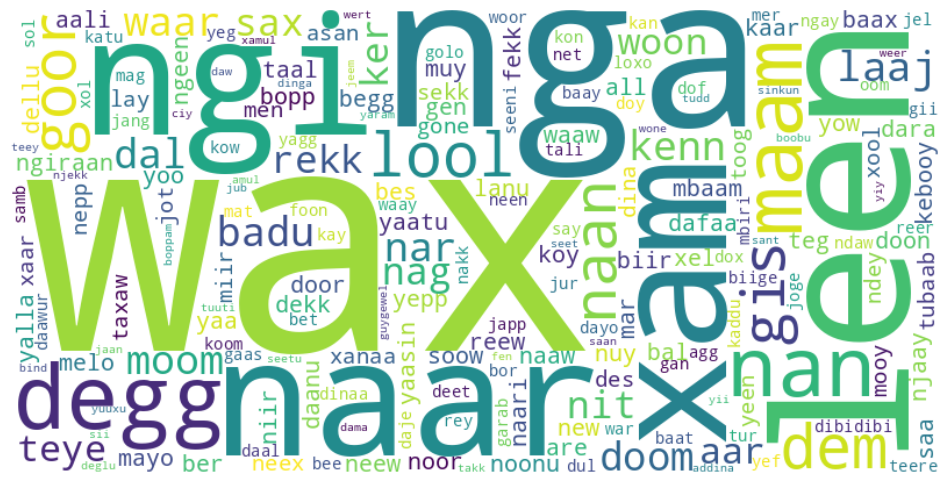

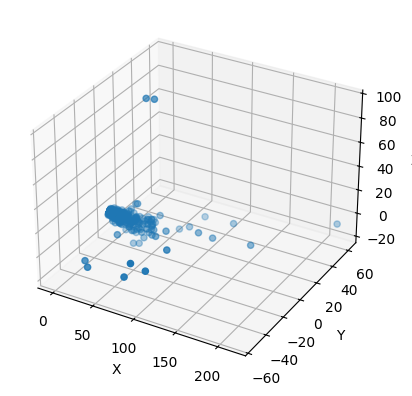

In [ ]:
vectorizer = CountVectorizer()
documents = [human_wolof_text]
X = vectorizer.fit_transform(documents)

vocab = vectorizer.get_feature_names_out()
word2idx = {word: idx for idx, word in enumerate(vocab)}

tokens = [word for word in human_wolof_text.split() if word in word2idx]

window_size = 2  # 滑动窗口半径（左右各2）
vocab_size = len(vocab)
co_occurrence = np.zeros((vocab_size, vocab_size))

for i in range(len(tokens)):
    current_word = tokens[i]
    current_idx = word2idx[current_word]

    start = max(0, i - window_size)
    end = min(len(tokens), i + window_size + 1)

    for j in range(start, end):
        if j == i:
            continue
        context_word = tokens[j]
        context_idx = word2idx[context_word]
        co_occurrence[current_idx, context_idx] += 1

n_components = 100
svd = TruncatedSVD(n_components=n_components)
X_svd = svd.fit_transform(co_occurrence)

print("Explained Variance Ratio:", svd.explained_variance_ratio_.sum())

import matplotlib.pyplot as plt
from wordcloud import WordCloud

word_counts = np.sum(co_occurrence, axis=1)
freq_dict = {word: count for word, count in zip(vocab, word_counts)}

wordcloud = WordCloud(width=800, height=400, background_color='white')
wordcloud.generate_from_frequencies(freq_dict)

plt.figure(figsize=(12, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

lsa_vectors = X_svd

pca = PCA(n_components=3)
lsa_vectors_3d = pca.fit_transform(lsa_vectors)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(lsa_vectors_3d[:, 0], lsa_vectors_3d[:, 1], lsa_vectors_3d[:, 2])
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.show()


Explained Variance Ratio: 0.9464483384359055


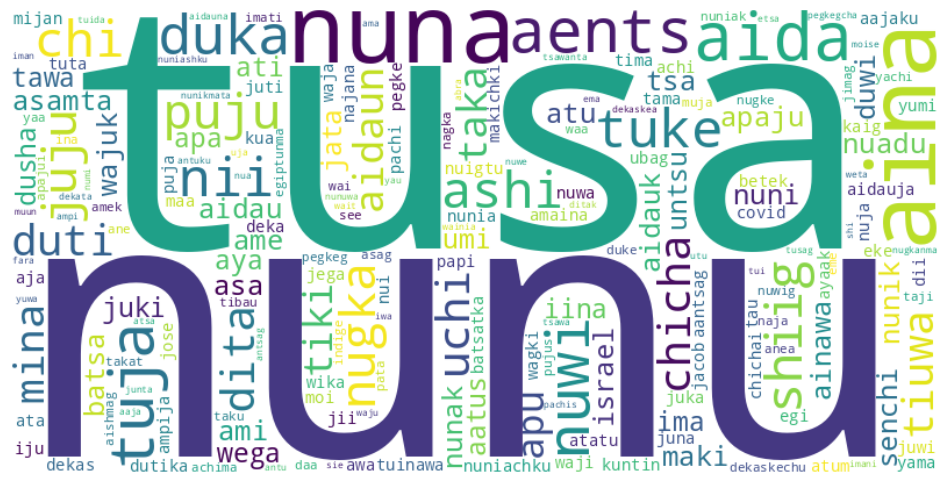

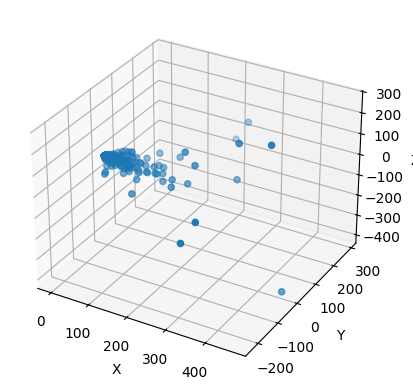

In [ ]:
vectorizer = CountVectorizer()
documents = [human_aguaruna_text]
X = vectorizer.fit_transform(documents)

vocab = vectorizer.get_feature_names_out()
word2idx = {word: idx for idx, word in enumerate(vocab)}

tokens = [word for word in human_aguaruna_text.split() if word in word2idx]

window_size = 2
vocab_size = len(vocab)
co_occurrence = np.zeros((vocab_size, vocab_size))

for i in range(len(tokens)):
    current_word = tokens[i]
    current_idx = word2idx[current_word]

    start = max(0, i - window_size)
    end = min(len(tokens), i + window_size + 1)

    for j in range(start, end):
        if j == i:
            continue
        context_word = tokens[j]
        context_idx = word2idx[context_word]
        co_occurrence[current_idx, context_idx] += 1

n_components = 100
svd = TruncatedSVD(n_components=n_components)
X_svd = svd.fit_transform(co_occurrence)

print("Explained Variance Ratio:", svd.explained_variance_ratio_.sum())

import matplotlib.pyplot as plt
from wordcloud import WordCloud

word_counts = np.sum(co_occurrence, axis=1)
freq_dict = {word: count for word, count in zip(vocab, word_counts)}

wordcloud = WordCloud(width=800, height=400, background_color='white')
wordcloud.generate_from_frequencies(freq_dict)

plt.figure(figsize=(12, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

lsa_vectors = X_svd

pca = PCA(n_components=3)
lsa_vectors_3d = pca.fit_transform(lsa_vectors)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(lsa_vectors_3d[:, 0], lsa_vectors_3d[:, 1], lsa_vectors_3d[:, 2])
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.show()

Explained Variance Ratio: 0.9958288101271465


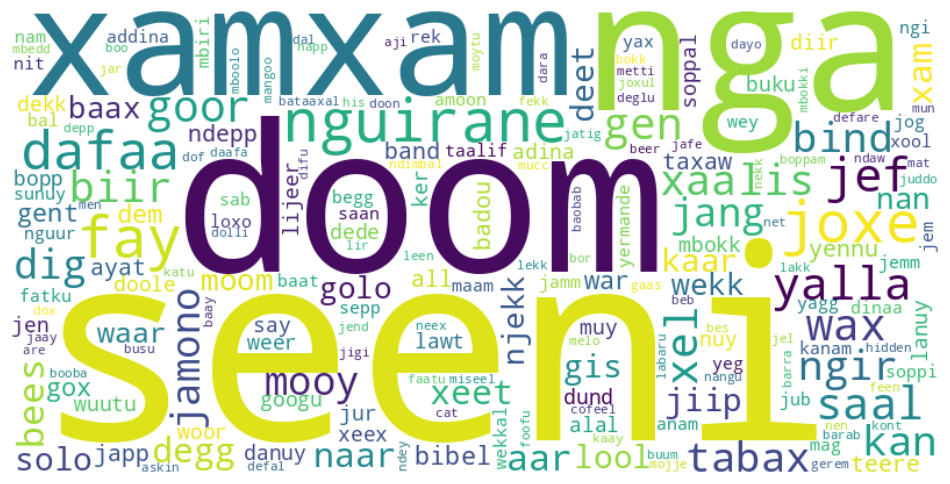

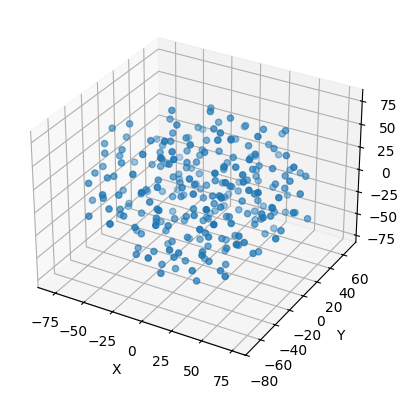

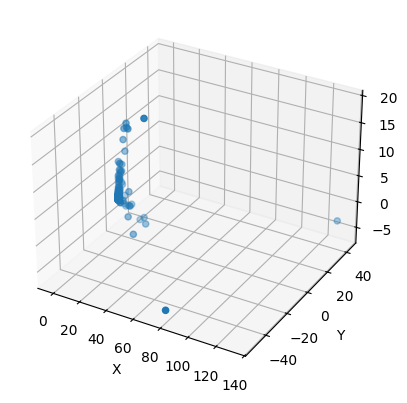

In [ ]:
vectorizer = CountVectorizer()
documents = [bot_wolof_text]
X = vectorizer.fit_transform(documents)

vocab = vectorizer.get_feature_names_out()
word2idx = {word: idx for idx, word in enumerate(vocab)}

tokens = [word for word in bot_wolof_text.split() if word in word2idx]

window_size = 2  # 滑动窗口半径（左右各2）
vocab_size = len(vocab)
co_occurrence = np.zeros((vocab_size, vocab_size))

for i in range(len(tokens)):
    current_word = tokens[i]
    current_idx = word2idx[current_word]

    start = max(0, i - window_size)
    end = min(len(tokens), i + window_size + 1)

    for j in range(start, end):
        if j == i:
            continue
        context_word = tokens[j]
        context_idx = word2idx[context_word]
        co_occurrence[current_idx, context_idx] += 1

n_components = 100
svd = TruncatedSVD(n_components=n_components)
X_svd = svd.fit_transform(co_occurrence)

print("Explained Variance Ratio:", svd.explained_variance_ratio_.sum())

import matplotlib.pyplot as plt
from wordcloud import WordCloud

word_counts = np.sum(co_occurrence, axis=1)
freq_dict = {word: count for word, count in zip(vocab, word_counts)}

wordcloud = WordCloud(width=800, height=400, background_color='white')
wordcloud.generate_from_frequencies(freq_dict)

plt.figure(figsize=(12, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

lsa_vectors = X_svd

tsne = TSNE(n_components=3)
lsa_vectors_3d = tsne.fit_transform(lsa_vectors)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(lsa_vectors_3d[:, 0], lsa_vectors_3d[:, 1], lsa_vectors_3d[:, 2])
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.show()

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

lsa_vectors = X_svd

pca = PCA(n_components=3)
lsa_vectors_3d = pca.fit_transform(lsa_vectors)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(lsa_vectors_3d[:, 0], lsa_vectors_3d[:, 1], lsa_vectors_3d[:, 2])
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.show()



Explained Variance Ratio: 0.9368874149951802


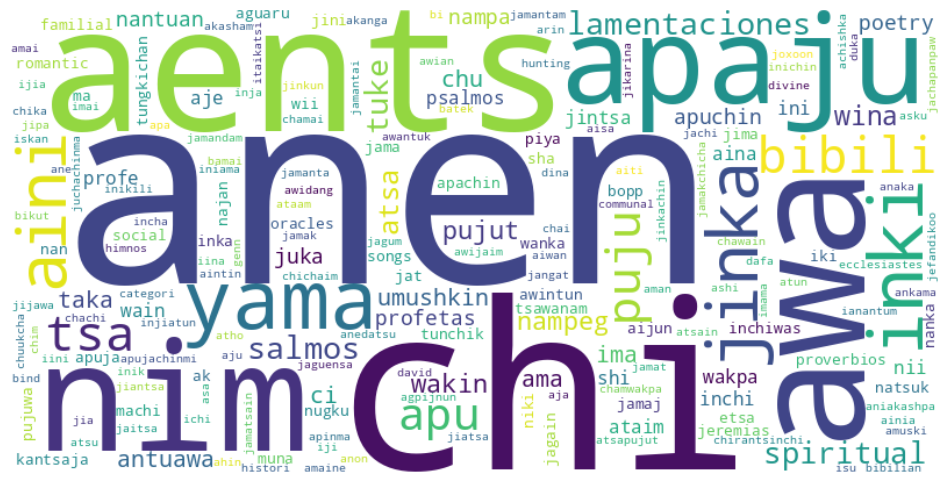

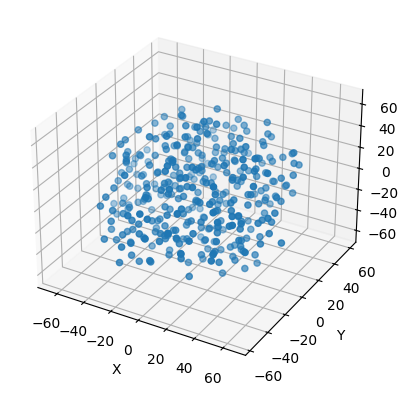

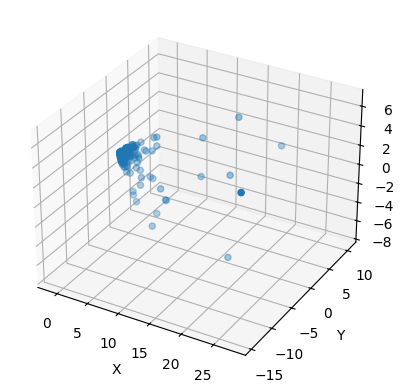

In [ ]:
vectorizer = CountVectorizer()
documents = [bot_aguaruna_text]
X = vectorizer.fit_transform(documents)

vocab = vectorizer.get_feature_names_out()
word2idx = {word: idx for idx, word in enumerate(vocab)}

tokens = [word for word in bot_aguaruna_text.split() if word in word2idx]

window_size = 2
vocab_size = len(vocab)
co_occurrence = np.zeros((vocab_size, vocab_size))

for i in range(len(tokens)):
    current_word = tokens[i]
    current_idx = word2idx[current_word]

    start = max(0, i - window_size)
    end = min(len(tokens), i + window_size + 1)

    for j in range(start, end):
        if j == i:
            continue
        context_word = tokens[j]
        context_idx = word2idx[context_word]
        co_occurrence[current_idx, context_idx] += 1

n_components = 100
svd = TruncatedSVD(n_components=n_components)
X_svd = svd.fit_transform(co_occurrence)

print("Explained Variance Ratio:", svd.explained_variance_ratio_.sum())

import matplotlib.pyplot as plt
from wordcloud import WordCloud

word_counts = np.sum(co_occurrence, axis=1)
freq_dict = {word: count for word, count in zip(vocab, word_counts)}

wordcloud = WordCloud(width=800, height=400, background_color='white')
wordcloud.generate_from_frequencies(freq_dict)

plt.figure(figsize=(12, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

lsa_vectors = X_svd

tsne = TSNE(n_components=3)
lsa_vectors_3d = tsne.fit_transform(lsa_vectors)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(lsa_vectors_3d[:, 0], lsa_vectors_3d[:, 1], lsa_vectors_3d[:, 2])
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.show()

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

lsa_vectors = X_svd

pca = PCA(n_components=3)
lsa_vectors_3d = pca.fit_transform(lsa_vectors)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(lsa_vectors_3d[:, 0], lsa_vectors_3d[:, 1], lsa_vectors_3d[:, 2])
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.show()

# re

##1

In [ ]:
import numpy as np
from itertools import permutations

#Shannon's entropy
def entropy(P):
  P = P[P != 0]
  return - np.sum(P * np.log(P))

#Normalized Shannon's entropy
def normalized_entropy(P):
  N = len(P)
  P_e = np.ones(N) / N

  S_max = entropy(P_e)
  S = entropy(P)
  return S / S_max


 #Jensen-Shannon divergence
def divergence(P_1, P_2, Q_0):
  return Q_0 * (
                entropy((P_1 + P_2) / 2) -
                entropy(P_1) / 2 -
                entropy(P_2) / 2
                )

#Normalizing constant
def Q_0(dist):
  #len(dist) = D!

  return 1 / (np.log(2 * len(dist)) +
              (len(dist) + 1) * np.log(1 / (len(dist) + 1)) /  len(dist) / 2  -
              np.log(len(dist)) / 2)

#Complexity
def complexity(P):
  H_S = normalized_entropy(P)

  N = len(P)
  P_e = np.ones(N) / N


  Q_J = divergence(P, P_e, Q_0(P))

  return Q_J * H_S




## This is the function to get the distribution from time series ##
def get_distribution(time_series, D=3):
  M = len(time_series)

  #Get the permutation variants and get the indices for them
  perms = list(permutations(range(D)))
  perms_to_idx = dict(zip(perms, range(len(perms))))

  #Preare the array for distribution
  distribution = np.zeros(len(perms_to_idx))

  #For every z-vector add 1 to the permutation count
  for i in range(M - D + 1):
    z_vector = time_series[i:i+D]
    permut = tuple(np.argsort(z_vector))
    distribution[perms_to_idx[permut]] += 1

  #Normalize
  distribution /= (M - D + 1)
  return distribution

## Compute entropy-complexity for a given t.s. ##
def entropy_complexity_time_series(time_series, D):
  P = get_distribution(time_series, D=D)
  return normalized_entropy(P), complexity(P)

In [ ]:
%run entropy_complexity.py

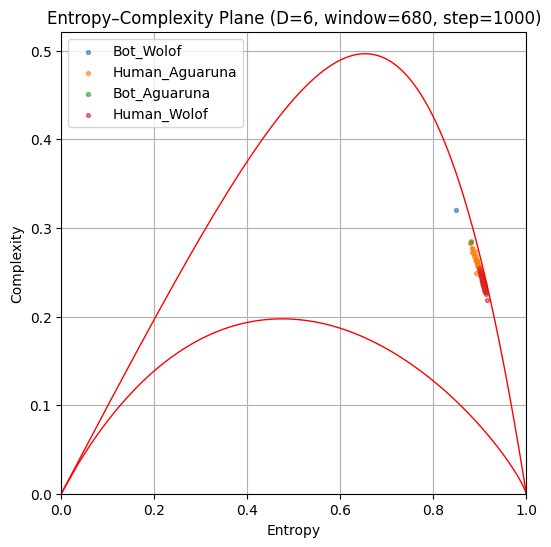

Entropy & Complexity values:
  • Bot_Wolof            → H = 0.911,  C = 0.210
  • Human_Aguaruna       → H = 0.997,  C = 0.006
  • Bot_Aguaruna         → H = 0.903,  C = 0.238
  • Human_Wolof          → H = 0.998,  C = 0.004


In [ ]:
# ─────────────────────────────────────────────────────────────────────────────
# 1. Imports and helper
# ─────────────────────────────────────────────────────────────────────────────
import numpy as np
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition       import TruncatedSVD
import entropy_complexity         # your module from entropy_complexity.py

# 2) Make sure you include all four lists in your “context”:
datasets = {
    'Bot_Wolof':     bot_wolof_tokens,
    'Human_Aguaruna':   human_aguaruna_tokens,
    'Bot_Aguaruna':     bot_aguaruna_tokens,
    'Human_Wolof':   human_wolof_tokens,
}

# ——— 构造 series ———
series = {}
for name, tokens in datasets.items():
    ts = []
    for token in tokens:
        if token in vectorizer.vocabulary_:
            idx = vectorizer.vocabulary_[token]
            ts.append(Wemb[idx])  # shape = (4,)
    ts = np.array(ts)
    series[name] = ts[:, 0]  # 用第一维主成分作为时间序列

# ——— 计算整体文本的 H-C ———
ec = {}
for name, ts in series.items():
    H, C = entropy_complexity.entropy_complexity_time_series(ts, D_ord)
    ec[name] = (H, C)

# 3) Build TF–IDF on those four “documents”:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition       import TruncatedSVD

vectorizer = TfidfVectorizer(token_pattern=r"(?u)\b\w+\b")
docs       = [" ".join(tokens) for tokens in datasets.values()]
X_tfidf    = vectorizer.fit_transform(docs)    # shape = (4 × V)

# 4) Now you have 4 features (one per “doc”), so you can do an SVD up to 4dims:
d_semantic = 4    # ≤ number of docs
svd        = TruncatedSVD(n_components=d_semantic, random_state=42)
Wemb       = svd.fit_transform(X_tfidf.T)      # now shape = (V, 4)

# ——— 5. Sliding-window parameters ———
min_len = min(len(ts) for ts in series.values())
window_size = int(min_len * 0.8)   # 例如使用最短序列的 80%
# window_size = 2000   # or whatever makes sense (≥ factorial limits!)
step_size   = 1000


# ——— 6. Compute H,C on each window ———
all_HC = {}
for name, ts in series.items():
    if len(ts) < window_size:
        print(f"Skipping {name}: too short for window (len={len(ts)} < {window_size})")
        continue
    HC = []
    for start in range(0, len(ts) - window_size + 1, step_size):
        seg = ts[start:start+window_size]
        H, C = entropy_complexity.entropy_complexity_time_series(seg, D_ord)
        HC.append((H, C))
    all_HC[name] = np.array(HC)

# ——— 8. Plot the “cloud” ———
plt.figure(figsize=(6,6))
plt.plot(lower[:,0], lower[:,1], 'r-', lw=1)
plt.plot(upper[:,0], upper[:,1], 'r-', lw=1)

for name, hc in all_HC.items():
    if hc.ndim != 2 or hc.shape[1] != 2:
        print(f"Skipping {name} in plot: invalid shape {hc.shape}")
        continue
    Hs, Cs = hc[:,0], hc[:,1]
    plt.scatter(Hs, Cs, s=8, alpha=0.6, label=name)

plt.xlabel('Entropy')
plt.ylabel('Complexity')
plt.title(f'Entropy–Complexity Plane (D={D_ord}, window={window_size}, step={step_size})')
plt.legend()
plt.grid(True)
plt.xlim(0,1)
plt.ylim(0, upper[:,1].max()*1.05)
plt.show()

# ─────────────────────────────────────────────────────────────────────────────
# 9. Print the numeric results
# ─────────────────────────────────────────────────────────────────────────────
print("Entropy & Complexity values:")
for name,(H,C) in ec.items():
    print(f"  • {name:20s} → H = {H:.3f},  C = {C:.3f}")

## 2 (no)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_extraction.text import TfidfVectorizer

texts = [human_aguaruna_text, bot_aguaruna_text, human_wolof_text, bot_wolof_text]
labels = ["Human Aguaruna", "Bot Aguaruna", "Human Wolof", "Bot Wolof"]

def text_to_sequence(text):
    tokens = text.strip().split()
    vectorizer = TfidfVectorizer()
    vectorizer.fit([text])
    vocab = vectorizer.vocabulary_

    # 获取每个 token 的 TF-IDF 值（否则用0）
    tfidf_vector = vectorizer.transform([text]).toarray()[0]
    word2tfidf = {word: tfidf_vector[idx] for word, idx in vocab.items()}

    return np.array([word2tfidf.get(token, 0.0) for token in tokens])



# 最大 Lyapunov 指数计算
def lyapunov_exponent(x, m=10, tau=1, max_t=50):
    N = len(x) - (m - 1) * tau
    if N <= 0:
        return None

    # 相空间嵌入
    Y = np.array([x[i:i + m * tau:tau] for i in range(N)])

    # 寻找最近邻（避免自邻）
    tree = NearestNeighbors(n_neighbors=2).fit(Y)
    distances, indices = tree.kneighbors(Y)
    neighbors = [(i, indices[i, 1]) for i in range(N) if abs(i - indices[i, 1]) > m * tau]

    if not neighbors:
        return None

    # 发散轨迹计算
    divergence = []
    for t in range(1, max_t):
        dists = []
        for i, j in neighbors:
            if i + t < len(Y) and j + t < len(Y):
                dist = np.linalg.norm(Y[i + t] - Y[j + t])
                if dist > 0:
                    dists.append(np.log(dist))
        divergence.append(np.mean(dists) if dists else np.nan)

    divergence = np.array(divergence)
    valid = ~np.isnan(divergence)
    if np.sum(valid) < 5:
        return None

    t_vals = np.arange(1, max_t)[valid]
    d_vals = divergence[valid]
    slope, _ = np.polyfit(t_vals, d_vals, 1)

    return slope, t_vals, d_vals

# 多文本对比函数
def compare_texts_with_lyapunov(texts, labels=None):
    if labels is None:
        labels = [f'Text {i+1}' for i in range(len(texts))]

    plt.figure(figsize=(10, 6))
    for text, label in zip(texts, labels):

        seq = text_to_sequence(text)
        result = lyapunov_exponent(seq, m=20, tau=1, max_t=50)

        slope, t_vals, d_vals = result
        plt.plot(t_vals, d_vals, label=f"{label} ")

    plt.xlabel("Time steps")
    plt.ylabel("log(Distance)")
    plt.title("Maximum Lyapunov Exponent Comparison")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


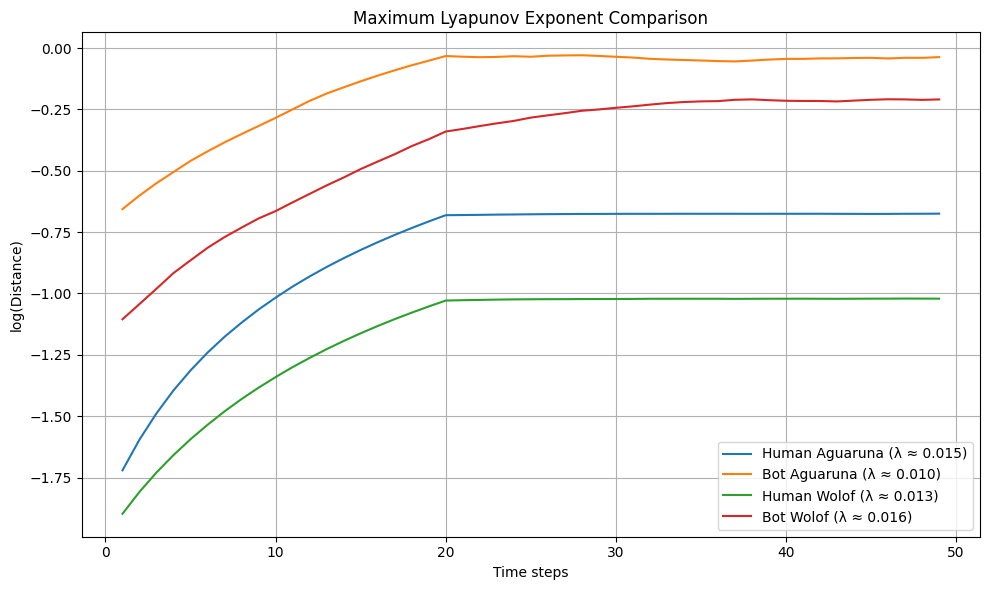

In [ ]:
compare_texts_with_lyapunov(texts, labels)

## 3 (no)

In [ ]:
print(human_aguaruna_text)

eme ane agataji yaba tiki chi aidaun jui ukuaja shig unuimagta iina chicha chicha jutii eme waja juke yabaikik ini chi shig unuima chi puju mina daa lisethta wika awa shuarja pachinjamuitja eme ane kumpamji yaba awa chicha jintintuattaji titu ekemsam jasa antu shig unuima juke yabaikek shig unuima awajunja chichasmi kuitama wekaesa wainia yama nagkamchamu chijaja timantim suku aents aja aina tuwaja maki tsawanta igkuni chichasa dekas jega atuni jegamka tusa nagkamawa chijaja jeen taka takainaku jegamka nunik nagkamawa timanmi jeen taka takainaku jimai wenak yaweja yawegji nijamanch uwa nagkama tusa tia nijamchi senchi umuina chichai dushi umuina kashin tsa datsa takascha nunita etsa wantintuk yumija iju takaya manik shiwagmaeka asa antsag juwa aba yumija nuniamuik pishak najanea etsa yumija asa chijaja jeeg apamkauwa timanmi jeeg apamkachu tuja suku jegamjukcha asa aya nugka tepena yau muun maniawaju nuniamu jinauwa kua aents nunikmata pata yajuak ijumjauwa jega muunnum makchik aents i

In [ ]:
print(text_to_sequence(human_wolof_text))

[1904 3007 3058 ...  216 1507  280]


In [ ]:
import numpy as np
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt

texts = [human_aguaruna_text, bot_aguaruna_text, human_wolof_text, bot_wolof_text]
labels = ["Human Aguaruna", "Bot Aguaruna", "Human Wolof", "Bot Wolof"]

# 文本 → 整数序列（词级）
def text_to_sequence(text):
    tokens = text.strip().split()
    le = LabelEncoder()
    return le.fit_transform(tokens)

# 相空间嵌入
def embed_sequence(seq, m=2, tau=1):
    N = len(seq) - (m - 1) * tau
    return np.array([seq[i:i + m * tau:tau] for i in range(N)])

# Box-counting 方法估算分形维数
def fractal_dimension(data, min_box_size=0.1, max_box_size=10, n_scales=10):
    # 盒子大小从大到小，连续浮点数
    sizes = np.logspace(np.log10(max_box_size), np.log10(min_box_size), num=n_scales)
    counts = []

    for size in sizes:
        mins = np.floor(np.min(data, axis=0) / size) * size
        maxs = np.ceil(np.max(data, axis=0) / size) * size
        grid = np.floor((data - mins) / size).astype(int)
        unique_boxes = set(map(tuple, grid))
        counts.append(len(unique_boxes))

    log_inv_sizes = np.log(1.0 / sizes)
    log_counts = np.log(counts)

    coeffs = np.polyfit(log_inv_sizes, log_counts, 1)
    D = coeffs[0]
    return D, sizes, counts


# 对多个文本进行分形维数对比
def compare_texts_fractal_dimension(texts, labels=None, m=2, tau=1):
    if labels is None:
        labels = [f'Text {i+1}' for i in range(len(texts))]

    plt.figure(figsize=(8, 6))
    for text, label in zip(texts, labels):
        seq = text_to_sequence(text)
        embedded = embed_sequence(seq, m=m, tau=tau)
        d, sizes, counts = fractal_dimension(embedded)
        plt.plot(np.log(1/sizes), np.log(counts), label=f"{label} (D ≈ {d:.3f})")

    plt.xlabel("log(1 / Box size)")
    plt.ylabel("log(Box count)")
    plt.title("Fractal Dimension via Box Counting")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


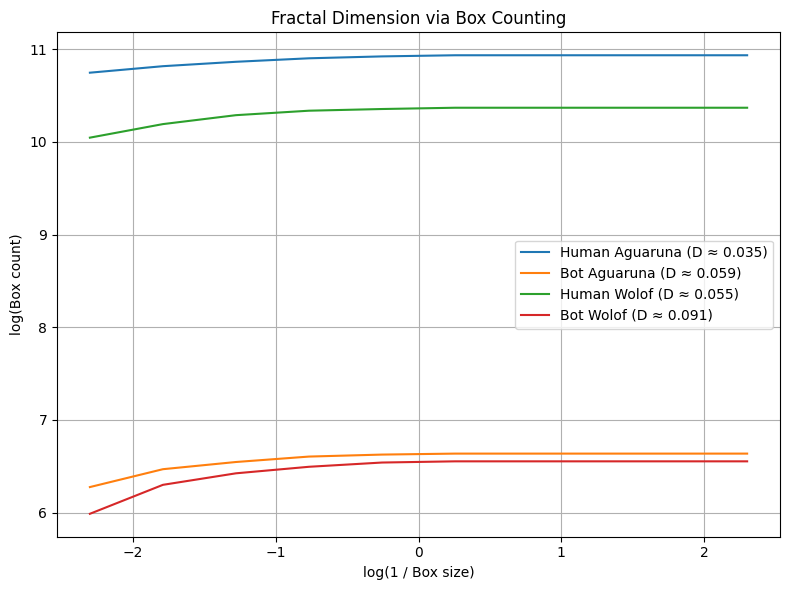

In [ ]:
compare_texts_fractal_dimension(texts, labels, m=2, tau=1)

# **GLOVE**

Loading embeddings...
Loaded 400000 word vectors.


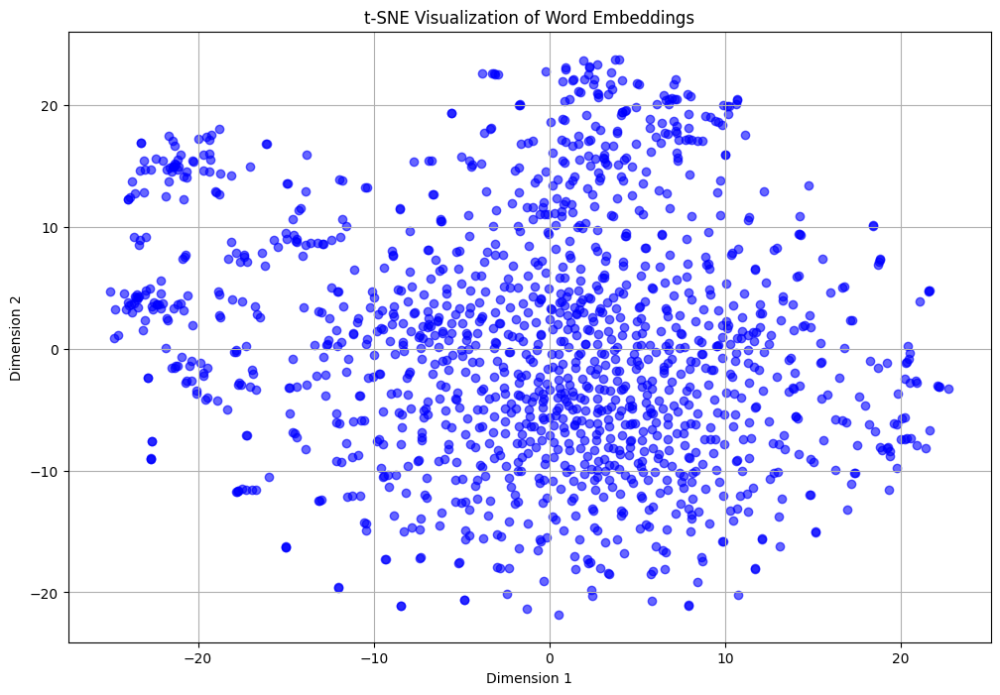

Loading embeddings...
Loaded 400000 word vectors.


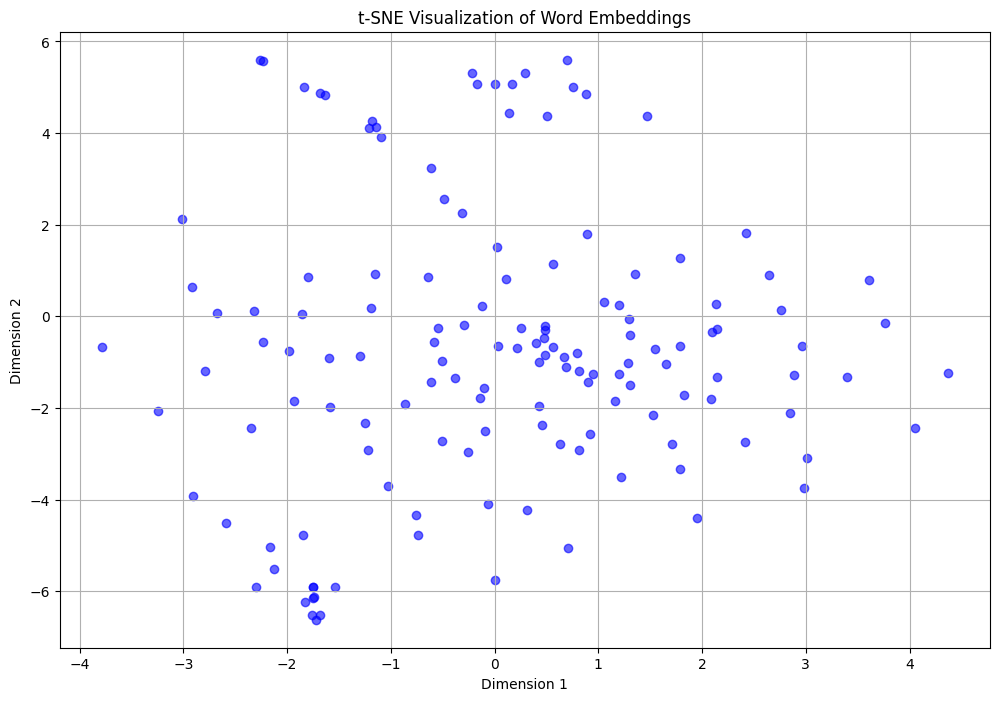

Loading embeddings...
Loaded 400000 word vectors.


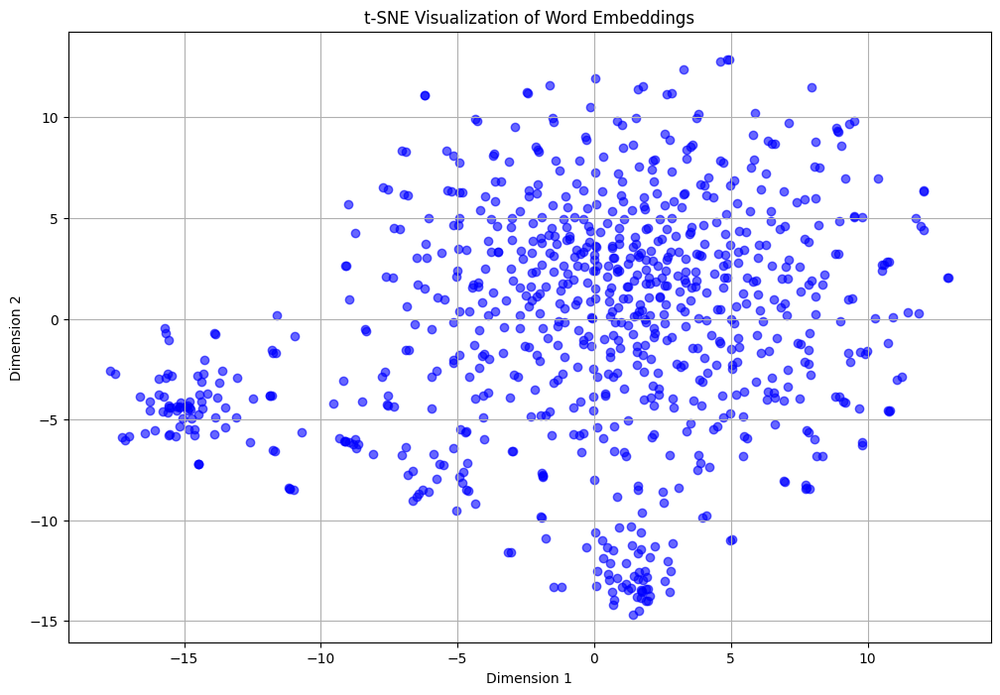

Loading embeddings...
Loaded 400000 word vectors.


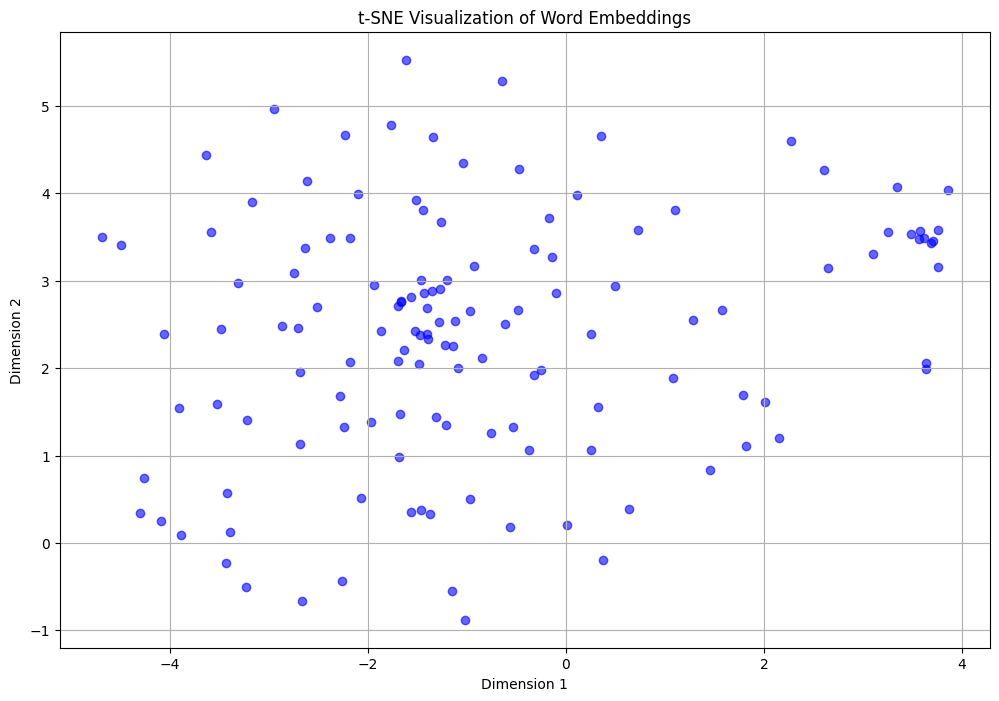

In [ ]:
import os
import zipfile
import requests
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

def download_glove(dest_path="glove.6B"):
    if not os.path.exists(dest_path):
        os.makedirs(dest_path)
    zip_path = os.path.join(dest_path, "glove.6B.zip")
    txt_path = os.path.join(dest_path, "glove.6B.100d.txt")

    if not os.path.exists(txt_path):
        print("Downloading GloVe...")
        url = "http://nlp.stanford.edu/data/glove.6B.zip"
        with requests.get(url, stream=True) as r:
            r.raise_for_status()
            with open(zip_path, 'wb') as f:
                for chunk in r.iter_content(chunk_size=8192):
                    f.write(chunk)
        print("Extracting GloVe...")
        with zipfile.ZipFile(zip_path, 'r') as zip_ref:
            zip_ref.extractall(dest_path)
        print("Done!")

    return txt_path

def load_glove_embeddings(filepath):
    print("Loading embeddings...")
    embeddings = {}
    with open(filepath, 'r', encoding='utf8') as f:
        for line in f:
            parts = line.strip().split()
            word = parts[0]
            vector = np.array(parts[1:], dtype=np.float32)
            embeddings[word] = vector
    print(f"Loaded {len(embeddings)} word vectors.")
    return embeddings

def get_text_vectors(text, embeddings):
    words = text.lower().split()
    unique_words = list(set(words))
    vectors = []
    valid_words = []
    for word in unique_words:
        if word in embeddings:
            vectors.append(embeddings[word])
            valid_words.append(word)
    return valid_words, np.array(vectors)

def visualize_text(text):
    glove_path = download_glove()
    glove_embeddings = load_glove_embeddings(glove_path)

    words, vectors = get_text_vectors(text, glove_embeddings)
    if len(vectors) < 2:
        print("Not enough words with embeddings to visualize.")
        return

    perplexity = min(30, len(vectors) - 1)
    tsne = TSNE(n_components=2, random_state=42, perplexity=perplexity)
    vectors_2d = tsne.fit_transform(vectors)

    plt.figure(figsize=(12, 8))
    plt.scatter(vectors_2d[:, 0], vectors_2d[:, 1], c='blue', alpha=0.6)
    # 删除或注释掉这一段以不显示词的标签
    # for i, word in enumerate(words):
    #     plt.annotate(word, (vectors_2d[i, 0], vectors_2d[i, 1]), fontsize=9)
    plt.title("t-SNE Visualization of Word Embeddings")
    plt.xlabel("Dimension 1")
    plt.ylabel("Dimension 2")
    plt.grid(True)
    plt.show()

visualize_text(human_aguaruna_text)
visualize_text(bot_aguaruna_text)
visualize_text(human_wolof_text)
visualize_text(bot_wolof_text)



# **BERT**

In [ ]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
!pip install plotly

In [ ]:
import numpy as np
import torch
import plotly.express as px
from transformers import BertTokenizer, BertModel
from sklearn.manifold import TSNE

model_name = 'bert-base-uncased'
tokenizer = BertTokenizer.from_pretrained(model_name)
model = BertModel.from_pretrained(model_name)
model.eval()


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

In [ ]:
import numpy as np
import torch
import matplotlib.pyplot as plt
from transformers import BertTokenizer, BertModel
from sklearn.manifold import TSNE

model_name = 'bert-base-uncased'
tokenizer = BertTokenizer.from_pretrained(model_name)
model = BertModel.from_pretrained(model_name)
model.eval()

def visualize_bert(text, title="t-SNE Visualization of Word Embeddings", max_tokens=512):
    inputs = tokenizer(text, return_tensors="pt", truncation=True, max_length=max_tokens)
    with torch.no_grad():
        outputs = model(**inputs)

    last_hidden_states = outputs.last_hidden_state.squeeze(0)  # (seq_len, hidden_dim)
    tokens = tokenizer.convert_ids_to_tokens(inputs['input_ids'][0])

    vectors = []
    for token, vector in zip(tokens, last_hidden_states):
        if token not in ['[CLS]', '[SEP]', '[PAD]']:
            vectors.append(vector.numpy())

    vectors = np.array(vectors)
    if len(vectors) < 2:
        print("Not enough valid tokens to visualize.")
        return

    perplexity = min(30, len(vectors) - 1)
    tsne = TSNE(n_components=2, random_state=42, perplexity=perplexity)
    vectors_2d = tsne.fit_transform(vectors)

    plt.figure(figsize=(12, 8))
    plt.scatter(vectors_2d[:, 0], vectors_2d[:, 1], c='blue', alpha=0.6)
    # 不显示 token 名称
    plt.title(title)
    plt.xlabel("Dimension 1")
    plt.ylabel("Dimension 2")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


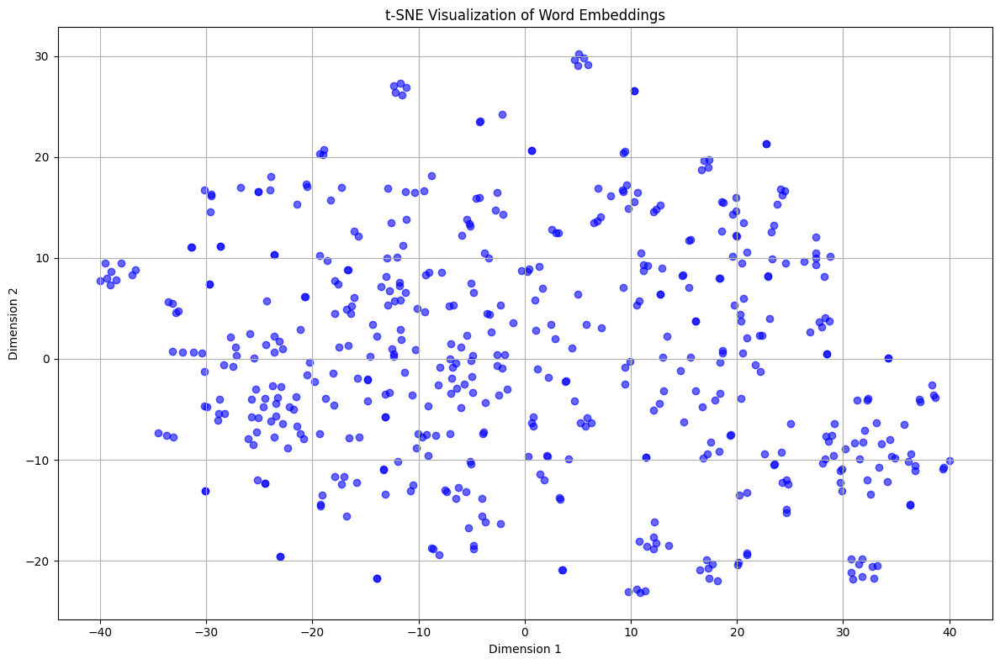

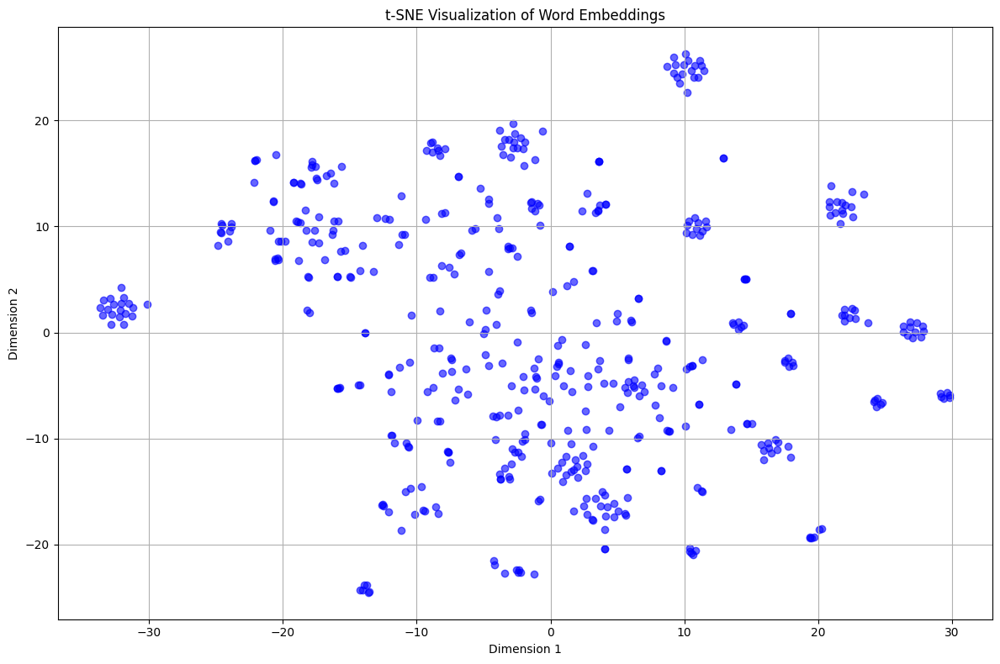

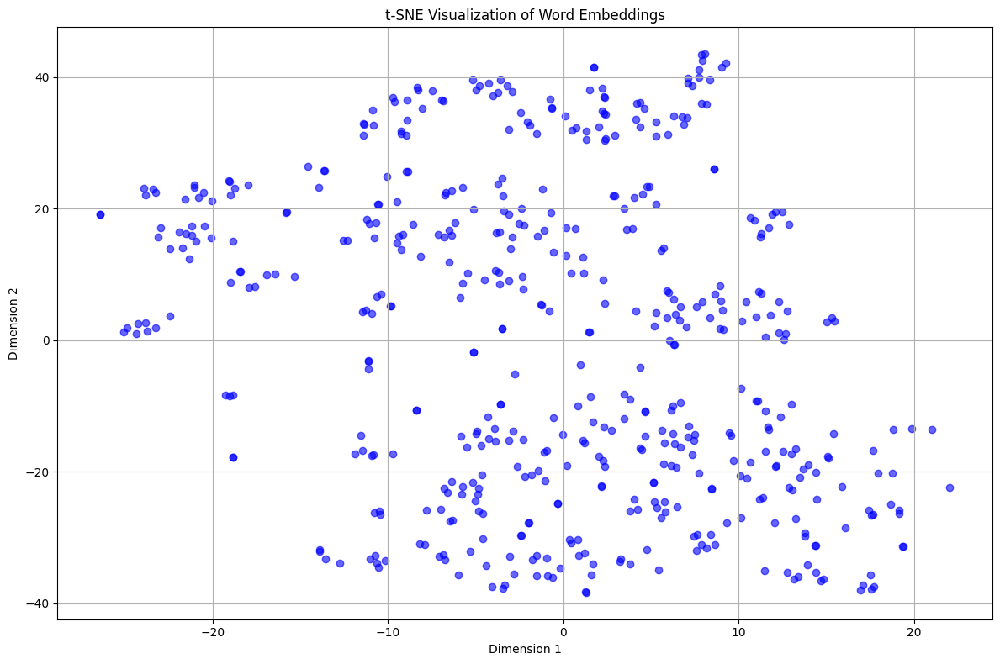

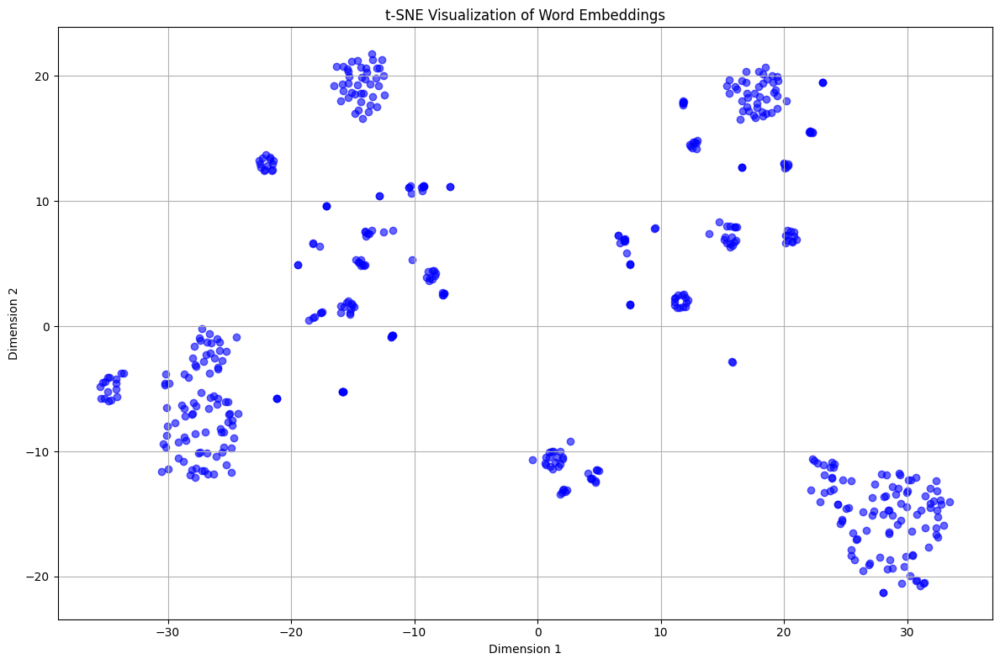

In [ ]:
visualize_bert(human_aguaruna_text, title="t-SNE Visualization of Word Embeddings")
visualize_bert(bot_aguaruna_text, title="t-SNE Visualization of Word Embeddings")
visualize_bert(human_wolof_text, title="t-SNE Visualization of Word Embeddings")
visualize_bert(bot_wolof_text, title="t-SNE Visualization of Word Embeddings")


# **Word Embedding**

In [ ]:
from gensim.models import FastText
import logging

from gensim.models import Word2Vec
import logging

## **FastText model**

In [ ]:
processed_human_wolof_tokens = [human_wolof_tokens]

fasttext_model_wolof_human = FastText(processed_human_wolof_tokens, vector_size=10, window=3, min_count=1, workers=4, sg=1)
fasttext_model_wolof_human.save("fasttext_corpus_wolof.model")
print("FastText model trained and saved.")

FastText model trained and saved.


In [ ]:
processed_human_aguaruna_tokens = [human_aguaruna_tokens]

fasttext_model_aguaruna_human = FastText(processed_human_aguaruna_tokens, vector_size=10, window=3, min_count=1, workers=4, sg=1)
fasttext_model_aguaruna_human.save("fasttext_corpus_aguaruna.model")
print("FastText model trained and saved.")

FastText model trained and saved.


In [ ]:
processed_bot_wolof_tokens = [bot_wolof_tokens]

fasttext_model_wolof_bot = FastText(processed_bot_wolof_tokens, vector_size=10, window=3, min_count=1, workers=4, sg=1)
fasttext_model_wolof_bot.save("fasttext_gpt_wolof.model")
print("FastText model trained and saved.")

FastText model trained and saved.


In [ ]:
processed_bot_aguaruna_tokens = [bot_aguaruna_tokens]

fasttext_model_aguaruna_bot = FastText(processed_bot_aguaruna_tokens, vector_size=10, window=3, min_count=1, workers=4, sg=1)
fasttext_model_wolof_bot.save("fasttext_gpt_aguaruna.model")
print("FastText model trained and saved.")

FastText model trained and saved.


## **Word2Vec model**

In [ ]:
word2vec_model_wolof_human = Word2Vec(processed_human_wolof_tokens, vector_size=10, window=3, min_count=2, workers=4)
word2vec_model_wolof_human.save("word2vec_corpus_wolof.model")
print("Word2Vec model trained and saved.")

Word2Vec model trained and saved.


In [ ]:
word2vec_model_aguaruna_human = Word2Vec(processed_human_aguaruna_tokens, vector_size=10, window=3, min_count=2, workers=4)
word2vec_model_aguaruna_human.save("word2vec_corpus_aguaruna.model")
print("Word2Vec model trained and saved.")

Word2Vec model trained and saved.


In [ ]:
word2vec_model_wolof_bot = Word2Vec(processed_bot_wolof_tokens, vector_size=10, window=3, min_count=2, workers=4)
word2vec_model_wolof_bot.save("word2vec_gpt_wolof.model")
print("Word2Vec model trained and saved.")

Word2Vec model trained and saved.


In [ ]:
word2vec_model_aguaruna_bot = Word2Vec(processed_bot_aguaruna_tokens, vector_size=10, window=3, min_count=2, workers=4)
word2vec_model_aguaruna_bot.save("word2vec_gpt_aguaruna.model")
print("Word2Vec model trained and saved.")

Word2Vec model trained and saved.


## USE embeddings

In [ ]:
import tensorflow as tf

# Function to segment text into chunks of 200 words
def segment_text(text, chunk_size=40):
    words = text.split()
    segments = [' '.join(words[i:i + chunk_size]) for i in range(0, len(words), chunk_size)]
    return segments

# Prepare the segmented corpus
corpus_aguaruna_human = segment_text(human_aguaruna_text)
corpus_aguaruna_bot = segment_text(bot_aguaruna_text)
corpus_wolof_human = segment_text(human_wolof_text)
corpus_wolof_bot = segment_text(bot_wolof_text)

In [ ]:
!pip install tensorflow_hub

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.9/60.9 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 615.5/615.5 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.5/19.5 MB 24.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 17.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 33.3 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.23.5
    Uninstalling numpy-1.23.5:
      Successfully uninstalled numpy-1.23.5
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.12.3
    Uninstalling tensorboard-2.12.3:
      Successfully uninstalled tensorboard-2.12.3
  Attempting uninstall: keras
    Found existing installation: keras 2.12.0
    Uninstalling keras-2.12.0:
      Successfully uninstalled keras-2.12.0
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.12.0
    Uninstalling tensorflow-2.12.0:
      Su

In [ ]:
import tensorflow_hub as hub
# Load the Universal Sentence Encoder model
use_model = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

# Compute USE embeddings
def compute_use_embeddings(corpus):
    return use_model(corpus).numpy()

vectors_aguaruna_human_use = compute_use_embeddings(corpus_aguaruna_human)
vectors_aguaruna_bot_use = compute_use_embeddings(corpus_aguaruna_bot)
vectors_wolof_human_use = compute_use_embeddings(corpus_wolof_human)
vectors_wolof_bot_use = compute_use_embeddings(corpus_wolof_bot)

print(f"Wolof Human USE Embedding Shape: {vectors_wolof_human_use.shape}")
print(f"Wolof Bot USE Embedding Shape: {vectors_wolof_bot_use.shape}")
print(f"Aguaruna Human USE Embedding Shape: {vectors_aguaruna_human_use.shape}")
print(f"Aguaruna Bot USE Embedding Shape: {vectors_aguaruna_bot_use.shape}")

# Optionally, save the embeddings
np.save("wolof_human_use.npy", vectors_wolof_human_use)
np.save("wolof_bot_use.npy", vectors_wolof_bot_use)
np.save("aguaruna_human_use.npy", vectors_aguaruna_human_use)
np.save("aguaruna_bot_use.npy", vectors_aguaruna_bot_use)

Wolof Human USE Embedding Shape: (1106, 512)
Wolof Bot USE Embedding Shape: (27, 512)
Aguaruna Human USE Embedding Shape: (2318, 512)
Aguaruna Bot USE Embedding Shape: (22, 512)


In [ ]:
# Get the number of unique segments
unique_segments_sizes = {
    "Wolof Human USE": len(np.unique(human_wolof_tokens)),
    "Wolof Bot USE": len(np.unique(bot_wolof_tokens)),
    "Aguaruna Human USE": len(np.unique(human_aguaruna_tokens)),
    "Aguaruna Bot USE": len(np.unique(bot_aguaruna_tokens))
}

vals = []
print("Unique Segments Sizes for USE:")
for dataset, size in unique_segments_sizes.items():
    print(f"{dataset}: {size}")
    vals.append(size)

Unique Segments Sizes for USE:
Wolof Human USE: 3204
Wolof Bot USE: 252
Aguaruna Human USE: 12991
Aguaruna Bot USE: 376


In [ ]:
from gensim.models import Word2Vec, FastText

# Corpus models
word2vec_corpus_wolof = Word2Vec.load("word2vec_corpus_wolof.model")
word2vec_corpus_aguaruna = Word2Vec.load("word2vec_corpus_aguaruna.model")
fasttext_corpus_wolof = FastText.load("fasttext_corpus_wolof.model")
fasttext_corpus_aguaruna = FastText.load("fasttext_corpus_aguaruna.model")

# GPT models
word2vec_gpt_wolof = Word2Vec.load("word2vec_gpt_wolof.model")
word2vec_gpt_aguaruna = Word2Vec.load("word2vec_gpt_aguaruna.model")
fasttext_gpt_wolof = FastText.load("fasttext_gpt_wolof.model")
fasttext_gpt_aguaruna = FastText.load("fasttext_gpt_aguaruna.model")

# Extract vocabulary sizes
vocab_sizes = {
    "Corpus Wolof": {
        "Word2Vec": len(word2vec_corpus_wolof.wv),
        "FastText": len(fasttext_corpus_wolof.wv),
        "USE":vals[3]
    },
    "Corpus Aguaruna": {
        "Word2Vec": len(word2vec_corpus_aguaruna.wv),
        "FastText": len(fasttext_corpus_aguaruna.wv),
        "USE":vals[1]
    },
    "GPT Wolof": {
        "Word2Vec": len(word2vec_gpt_wolof.wv),
        "FastText": len(fasttext_gpt_wolof.wv),
        "USE":vals[2]
    },
    "GPT Aguaruna": {
        "Word2Vec": len(word2vec_gpt_aguaruna.wv),
        "FastText": len(fasttext_gpt_aguaruna.wv),
        "USE":vals[0]
    }
}


In [ ]:
import pandas as pd

# Flatten the dictionary into a list of dictionaries for DataFrame creation
data_for_df = []
for dataset, models in vocab_sizes.items():
    for model, size in models.items():
        data_for_df.append({"Dataset": dataset, "Model": model, "Vocabulary Size": size})

# Create DataFrame
df_vocab_sizes = pd.DataFrame(data_for_df)

# Display DataFrame
print(df_vocab_sizes)

            Dataset     Model  Vocabulary Size
0      Corpus Wolof  Word2Vec             1929
1      Corpus Wolof  FastText             3204
2      Corpus Wolof       USE              376
3   Corpus Aguaruna  Word2Vec             5708
4   Corpus Aguaruna  FastText            12991
5   Corpus Aguaruna       USE              252
6         GPT Wolof  Word2Vec              120
7         GPT Wolof  FastText              252
8         GPT Wolof       USE            12991
9      GPT Aguaruna  Word2Vec               90
10     GPT Aguaruna  FastText              252
11     GPT Aguaruna       USE             3204


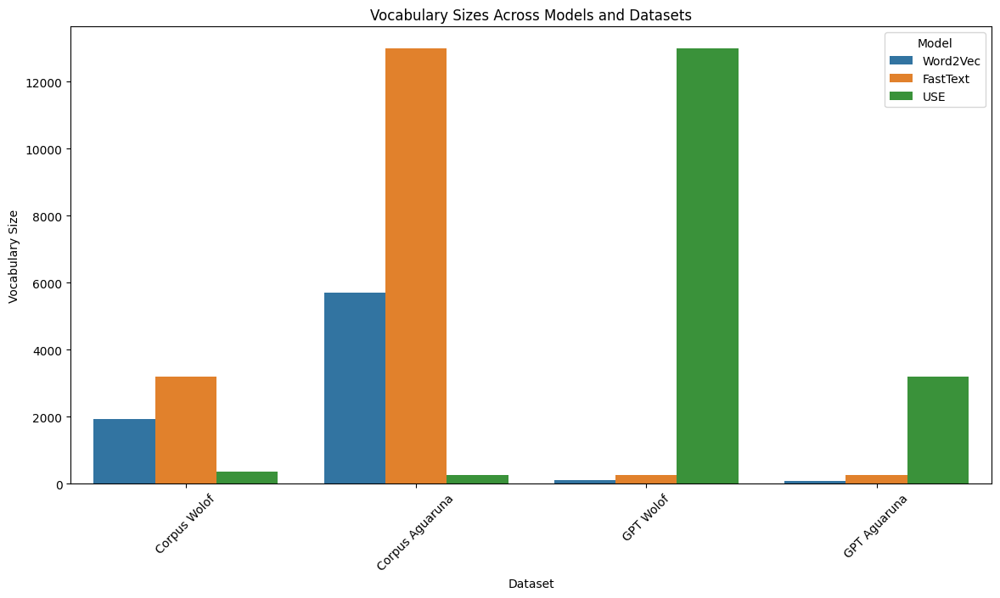

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plotting
plt.figure(figsize=(14, 7))
sns.barplot(x="Dataset", y="Vocabulary Size", hue="Model", data=df_vocab_sizes)
plt.title('Vocabulary Sizes Across Models and Datasets')
plt.xticks(rotation=45)
plt.show()


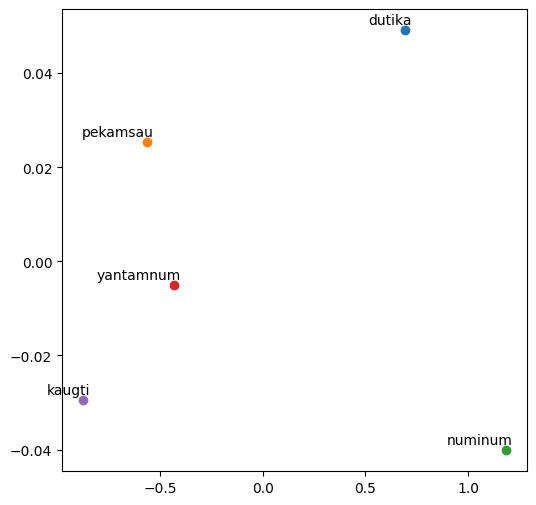

In [ ]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from gensim.models import FastText
import numpy as np
from sklearn.decomposition import PCA

words =  ['dutika','pekamsau', 'numinum', 'yantamnum', 'kaugti']
word_vectors = [fasttext_model_aguaruna_human.wv[word] for word in words]

word_vectors_array = np.array(word_vectors)
pca = PCA(n_components=2)

vectors_2d = pca.fit_transform(word_vectors_array)

# Plotting
plt.figure(figsize=(6, 6))
for i, label in enumerate(words):
    x, y = vectors_2d[i]
    plt.scatter(x, y)
    plt.annotate(label, xy=(x, y), xytext=(5, 2), textcoords='offset points', ha='right', va='bottom')
plt.show()


# Test

In [ ]:
import numpy as np

def compute_lyapunov_exponent(time_series, delay=1, embedding_dimension=2):
    N = len(time_series)

    if N < embedding_dimension * delay:
        raise ValueError("Time series too short relative to the chosen parameters.")

    # Phase space reconstruction via time-delay method.
    phase_space = []
    valid_indices = range(N - (embedding_dimension - 1) * delay)
    for i in valid_indices:
        reconstructed_point = [time_series[i + j * delay] for j in range(embedding_dimension)]
        phase_space.append(reconstructed_point)

    phase_space = np.array(phase_space)
    num_points = len(phase_space)

    if num_points < 2:
        raise ValueError("Not enough points after phase space reconstruction.")

    distances = np.linalg.norm(phase_space[:, None, :] - phase_space[None, :, :], axis=-1)

    mask = np.ones((num_points, num_points), dtype=bool)
    np.fill_diagonal(mask, False)
    nearest_neighbors_idx = np.argmin(np.where(mask, distances, np.inf), axis=1)

    separation_distances = []
    for idx, nn_idx in zip(valid_indices[:-1], nearest_neighbors_idx[:-1]):
        next_step_diff = abs(time_series[idx + delay] - time_series[nn_idx + delay])
        if not np.isnan(next_step_diff) and next_step_diff != 0:
            separation_distances.append(np.log(next_step_diff))

    if len(separation_distances) == 0:
        return float('nan')

    avg_separation_rate = sum(separation_distances) / len(separation_distances)
    max_lyap_exp = avg_separation_rate / delay
    return max_lyap_exp

# Example usage
example_seq = [np.sin(2*np.pi*0.1*t)+np.random.normal(scale=0.1) for t in range(100)]
try:
    lyap_exp = compute_lyapunov_exponent(example_seq, delay=5, embedding_dimension=3)
    print(f"Estimated Maximal Lyapunov Exponent: {lyap_exp}")
except Exception as e:
    print(f"An error occurred: {str(e)}")

Estimated Maximal Lyapunov Exponent: -0.7116167612346896


In [ ]:
import numpy as np
from sklearn.neighbors import NearestNeighbors
from sklearn.linear_model import LinearRegression
from sklearn.decomposition import PCA
from gensim.models import Word2Vec

# 示例 token 数据
tokens_data = {
    "human_wolof": [["xam", "na", "Yàlla", "moo", "fal", "ko"], ["ba", "mu", "dee"]],
    "bot_wolof": [["xam", "na", "bot", "la"], ["bu", "nu", "wax"]],
    "human_aguaruna": [["Tuna", "ini", "Jempe", "wáimatai"], ["Iña", "nanká"]],
    "bot_aguaruna": [["Ini", "bot", "takum", "jiía"], ["nanká", "ni"]]
}

# 所有语料合并训练 Word2Vec 模型
all_sentences = sum(tokens_data.values(), [])
model = Word2Vec(sentences=all_sentences, vector_size=50, window=2, min_count=1, workers=1, seed=42)

def compute_lle_from_tokens(token_sequences, m=2, tau=1, min_sep=2, max_k=10):
    series = np.array([model.wv[token] for sentence in token_sequences for token in sentence])
    P = len(series) - (m - 1) * tau
    if P <= 0:
        return np.nan
    X = np.array([np.concatenate(series[i:i + m * tau:tau]) for i in range(P)])

    n_components = min(10, X.shape[0], X.shape[1])
    X = PCA(n_components=n_components).fit_transform(X)

    nbrs = NearestNeighbors(n_neighbors=2).fit(X)
    distances, indices = nbrs.kneighbors(X)
    neighbor_idx = indices[:, 1]
    pairs = [(i, j) for i, j in enumerate(neighbor_idx) if abs(i - j) >= min_sep]

    L_vals = []
    for k in range(1, max_k + 1):
        logs = []
        for i, j in pairs:
            if i + k < P and j + k < P:
                d = np.linalg.norm(X[i + k] - X[j + k])
                if d > 0:
                    logs.append(np.log(d))
        L_vals.append(np.mean(logs) if logs else np.nan)

    k_arr = np.arange(1, max_k + 1).reshape(-1, 1)
    mask = ~np.isnan(L_vals)
    k_fit = k_arr[mask]
    L_fit = np.array(L_vals)[mask]
    if len(L_fit) < 2:
        return np.nan

    sel = k_fit.flatten() <= 5
    lr = LinearRegression().fit(k_fit[sel], L_fit[sel])
    return lr.coef_[0]


# 计算每组的最大Lyapunov指数
lle_results = {
    name: compute_lle_from_tokens(tokens)
    for name, tokens in tokens_data.items()
}

print("Lyapunov Exponents:")
for k, v in lle_results.items():
    print(f"{k}: {v:.4f}")


Lyapunov Exponents:
human_wolof: 0.0064
bot_wolof: nan
human_aguaruna: nan
bot_aguaruna: nan


# **Wishart Algorithm**

In [ ]:
!pip install hdbscan
!pip install dbscan1d

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 46.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 158.0 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.1.3
    Uninstalling numpy-2.1.3:
      Successfully uninstalled numpy-2.1.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pyfume 0.3.4 requires numpy==1.24.4, but you have numpy 1.26.4 which is incompatible.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 1.5.3 which is incompatible.
flax 0.10.6 requires jax>=0.5.1, but you have jax 0.4.30 which is incompatible.
orbax-checkpoint 0.11.13 requires jax>=0.5.0, but you have jax 0.4.30 which is incompatible.
scikit-image 0.25.2 requires scipy>=1.11.4, but you have scipy 1.10.1 which is incompatib

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial import distance
from sklearn.cluster import DBSCAN
import warnings
from dbscan1d.core import DBSCAN1D

In [ ]:
from nltk import ngrams
import numpy as np

def generate_ngrams(text_tokens, n=3):
    """ Generate n-grams from the list of tokens. """
    return [ngram for ngram in ngrams(text_tokens, n)]

def ngram_to_vector(ngram, model):
    """ Concatenate word vectors for each word in the n-gram. """
    vector_dim = model.vector_size
    ngram_vector = np.concatenate([model.wv[word] if word in model.wv else np.zeros(vector_dim) for word in ngram])
    return ngram_vector

def create_ngram_dataset(texts, model, n=3):
    """ Create a dataset of n-gram vectors, store only unique n-grams. """
    all_ngrams = []
    all_ngrams_vectors = []
    seen_ngrams = set()  # To track unique n-grams

    for text_tokens in texts:
        ngrams = generate_ngrams(text_tokens, n)
        for ngram in ngrams:
            ngram_tuple = tuple(ngram)  # Convert list to tuple for hashability
            if ngram_tuple not in seen_ngrams:
                seen_ngrams.add(ngram_tuple)
                vector = ngram_to_vector(ngram, model)
                all_ngrams.append(ngram_tuple)
                all_ngrams_vectors.append(vector)

    return all_ngrams, np.array(all_ngrams_vectors)

In [ ]:
# Processed texts need to be a list of tokens
processed_texts_aguaruna_human = human_aguaruna_text.split()
processed_texts_aguaruna_bot = bot_aguaruna_text.split()
processed_texts_wolof_human = human_wolof_text.split()
processed_texts_wolof_bot = bot_wolof_text.split()

ngrams_aguaruna_human, vectors_aguaruna_human = create_ngram_dataset([processed_texts_aguaruna_human], word2vec_corpus_aguaruna)
ngrams_aguaruna_human_ft, vectors_aguaruna_human_ft = create_ngram_dataset([processed_texts_aguaruna_human], fasttext_corpus_aguaruna)
ngrams_aguaruna_bot, vectors_aguaruna_bot = create_ngram_dataset([processed_texts_aguaruna_bot], word2vec_corpus_aguaruna)
ngrams_aguaruna_bot_ft, vectors_aguaruna_bot_ft = create_ngram_dataset([processed_texts_aguaruna_bot], fasttext_corpus_aguaruna)

ngrams_wolof_human, vectors_wolof_human = create_ngram_dataset([processed_texts_wolof_human], word2vec_corpus_wolof)
ngrams_wolof_human_ft, vectors_wolof_human_ft = create_ngram_dataset([processed_texts_wolof_human], fasttext_corpus_wolof)
ngrams_wolof_bot, vectors_wolof_bot = create_ngram_dataset([processed_texts_wolof_bot], word2vec_corpus_wolof)
ngrams_wolof_bot_ft, vectors_wolof_bot_ft = create_ngram_dataset([processed_texts_wolof_bot], fasttext_corpus_wolof)

print(f"Generated {len(ngrams_wolof_human)} Wolof human n-grams.")
print(f"Generated {len(ngrams_aguaruna_human)} Aguaruna human n-grams.")
print(f"Generated {len(ngrams_wolof_bot)} Wolof bot n-grams.")
print(f"Generated {len(ngrams_aguaruna_bot)} Aguaruna bot n-grams.")
print("*"*60)
print(f"Generated {len(ngrams_wolof_human_ft)} Wolof human n-grams.")
print(f"Generated {len(ngrams_aguaruna_human_ft)} Aguaruna human n-grams.")
print(f"Generated {len(ngrams_wolof_bot_ft)} Wolof bot n-grams.")
print(f"Generated {len(ngrams_aguaruna_bot_ft)} Aguaruna bot n-grams.")
print("*"*60)


Generated 42253 Wolof human n-grams.
Generated 77681 Aguaruna human n-grams.
Generated 850 Wolof bot n-grams.
Generated 842 Aguaruna bot n-grams.
************************************************************
Generated 42253 Wolof human n-grams.
Generated 77681 Aguaruna human n-grams.
Generated 850 Wolof bot n-grams.
Generated 842 Aguaruna bot n-grams.
************************************************************


In [ ]:
# Function to create n-grams from USE embeddings
def create_ngram_dataset_use(embeddings, n=3):
    all_ngrams = []
    all_ngrams_vectors = []
    seen_ngrams = set()  # To track unique n-grams

    for i in range(len(embeddings) - n + 1):
        ngram_vector = np.concatenate(embeddings[i:i+n])
        ngram_tuple = tuple(ngram_vector)
        if ngram_tuple not in seen_ngrams:
            seen_ngrams.add(ngram_tuple)
            all_ngrams.append(ngram_tuple)
            all_ngrams_vectors.append(ngram_vector)

    return all_ngrams, np.array(all_ngrams_vectors)


In [ ]:
# Generate n-grams and their vectors for USE embeddings
ngrams_wolof_human_use, vectors_wolof_human_use_ngrams = create_ngram_dataset_use(vectors_wolof_human_use)
ngrams_aguaruna_human_use, vectors_aguaruna_human_use_ngrams = create_ngram_dataset_use(vectors_aguaruna_human_use)
ngrams_wolof_bot_use, vectors_wolof_bot_use_ngrams = create_ngram_dataset_use(vectors_wolof_bot_use)
ngrams_aguaruna_bot_use, vectors_aguaruna_bot_use_ngrams = create_ngram_dataset_use(vectors_aguaruna_bot_use)

print(f"Generated {len(ngrams_wolof_human_use)} Wolof human n-grams with USE.")
print(f"Generated {len(ngrams_wolof_bot_use)} Wolof bot n-grams with USE.")
print(f"Generated {len(ngrams_aguaruna_human_use)} Aguaruna human n-grams with USE.")
print(f"Generated {len(ngrams_aguaruna_bot_use)} Aguaruna bot n-grams with USE.")
print("*"*60)

Generated 1104 Wolof human n-grams with USE.
Generated 25 Wolof bot n-grams with USE.
Generated 2315 Aguaruna human n-grams with USE.
Generated 20 Aguaruna bot n-grams with USE.
************************************************************


In [ ]:
import numpy as np
from scipy.special import gamma
from sklearn.neighbors import KDTree
from collections import defaultdict
from tqdm import tqdm

class Wishart:
    def __init__(self, wishart_neighbors, significance_level):
        self.wishart_neighbors = wishart_neighbors  # Number of neighbors
        self.significance_level = significance_level  # Significance level

    def fit(self, X):
        kdt = KDTree(X, metric='euclidean')

        # Query the k-nearest neighbors for each point
        distances, neighbors = kdt.query(X, k=self.wishart_neighbors + 1, return_distance=True)
        neighbors = neighbors[:, 1:]  # Exclude self-neighbor

        # Use the distance to the k-th nearest neighbor
        distances = distances[:, -1]
        indexes = np.argsort(distances)

        size, dim = X.shape
        self.object_labels = np.zeros(size, dtype=int) - 1

        # Initialize clusters and mapping of clusters to objects
        self.clusters = np.array([(1., 1., 0)])
        self.clusters_to_objects = defaultdict(list)
        print('Start clustering')

        for index in indexes:
            neighbors_clusters = np.concatenate([self.object_labels[neighbors[index]], self.object_labels[neighbors[index]]])
            unique_clusters = np.unique(neighbors_clusters).astype(int)
            unique_clusters = unique_clusters[unique_clusters != -1]

            if len(unique_clusters) == 0:
                self._create_new_cluster(index, distances[index])
            else:
                max_cluster = unique_clusters[-1]
                min_cluster = unique_clusters[0]
                if max_cluster == min_cluster:
                    if self.clusters[max_cluster][-1] < 0.5:
                        self._add_elem_to_exist_cluster(index, distances[index], max_cluster)
                    else:
                        self._add_elem_to_noise(index)
                else:
                    my_clusters = self.clusters[unique_clusters]
                    flags = my_clusters[:, -1]
                    if np.min(flags) > 0.5:
                        self._add_elem_to_noise(index)
                    else:
                        significan = np.power(np.maximum(my_clusters[:, 0], 1e-10), -dim) - np.power(np.maximum(my_clusters[:, 1], 1e-10), -dim)
                        significan *= self.wishart_neighbors
                        significan /= size
                        significan /= np.power(np.pi, dim / 2)
                        significan *= gamma(dim / 2 + 1)
                        significan_index = significan >= self.significance_level

                        significan_clusters = unique_clusters[significan_index]
                        not_significan_clusters = unique_clusters[~significan_index]
                        significan_clusters_count = len(significan_clusters)
                        if significan_clusters_count > 1 or min_cluster == 0:
                            self._add_elem_to_noise(index)
                            self.clusters[significan_clusters, -1] = 1
                            for not_sig_cluster in not_significan_clusters:
                                if not_sig_cluster == 0:
                                    continue

                                for bad_index in self.clusters_to_objects[not_sig_cluster]:
                                    self._add_elem_to_noise(bad_index)
                                self.clusters_to_objects[not_sig_cluster].clear()
                        else:
                            for cur_cluster in unique_clusters:
                                if cur_cluster == min_cluster:
                                    continue

                                for bad_index in self.clusters_to_objects[cur_cluster]:
                                    self._add_elem_to_exist_cluster(bad_index, distances[bad_index], min_cluster)
                                self.clusters_to_objects[cur_cluster].clear()

                            self._add_elem_to_exist_cluster(index, distances[index], min_cluster)

        return self.clean_data()

    def clean_data(self):
        unique = np.unique(self.object_labels)
        index = np.argsort(unique)
        if unique[0] != 0:
            index += 1
        true_cluster = {unq: idx for unq, idx in zip(unique, index)}
        result = np.zeros(len(self.object_labels), dtype=int)
        for idx, unq in enumerate(self.object_labels):
            result[idx] = true_cluster[unq]
        return result

    def _add_elem_to_noise(self, index):
        self.object_labels[index] = 0
        self.clusters_to_objects[0].append(index)

    def _create_new_cluster(self, index, dist):
        self.object_labels[index] = len(self.clusters)
        self.clusters_to_objects[len(self.clusters)].append(index)
        self.clusters = np.append(self.clusters, [(dist, dist, 0)], axis=0)

    def _add_elem_to_exist_cluster(self, index, dist, cluster_label):
        self.object_labels[index] = cluster_label
        self.clusters_to_objects[cluster_label].append(index)
        self.clusters[cluster_label][0] = min(self.clusters[cluster_label][0], dist)
        self.clusters[cluster_label][1] = max(self.clusters[cluster_label][1], dist)


class PreTrainWishart:
    def __init__(self, wishart_neighbors, significance_level, distances, neighbors):
        self.wishart_neighbors = wishart_neighbors  # Number of neighbors
        self.significance_level = significance_level  # Significance level
        self.distances = distances
        self.neighbors = neighbors

    def fit(self, X):
        kdt = KDTree(X, metric='euclidean')

        # Use precomputed distances and neighbors
        neighbors = self.neighbors[:, 1:self.wishart_neighbors + 1]
        distances = self.distances[:, self.wishart_neighbors]
        indexes = np.argsort(distances)

        size, dim = X.shape
        self.object_labels = np.zeros(size, dtype=int) - 1

        # Initialize clusters and mapping of clusters to objects
        self.clusters = np.array([(1., 1., 0)])
        self.clusters_to_objects = defaultdict(list)

        for index in indexes:
            neighbors_clusters = np.concatenate([self.object_labels[neighbors[index]], self.object_labels[neighbors[index]]])
            unique_clusters = np.unique(neighbors_clusters).astype(int)
            unique_clusters = unique_clusters[unique_clusters != -1]

            if len(unique_clusters) == 0:
                self._create_new_cluster(index, distances[index])
            else:
                max_cluster = unique_clusters[-1]
                min_cluster = unique_clusters[0]
                if max_cluster == min_cluster:
                    if self.clusters[max_cluster][-1] < 0.5:
                        self._add_elem_to_exist_cluster(index, distances[index], max_cluster)
                    else:
                        self._add_elem_to_noise(index)
                else:
                    my_clusters = self.clusters[unique_clusters]
                    flags = my_clusters[:, -1]
                    if np.min(flags) > 0.5:
                        self._add_elem_to_noise(index)
                    else:
                        significan = np.power(np.maximum(my_clusters[:, 0], 1e-10), -dim) - np.power(np.maximum(my_clusters[:, 1], 1e-10), -dim)
                        significan *= self.wishart_neighbors
                        significan /= size
                        significan /= np.power(np.pi, dim / 2)
                        significan *= gamma(dim / 2 + 1)
                        significan_index = significan >= self.significance_level

                        significan_clusters = unique_clusters[significan_index]
                        not_significan_clusters = unique_clusters[~significan_index]
                        significan_clusters_count = len(significan_clusters)
                        if significan_clusters_count > 1 or min_cluster == 0:
                            self._add_elem_to_noise(index)
                            self.clusters[significan_clusters, -1] = 1
                            for not_sig_cluster in not_significan_clusters:
                                if not_sig_cluster == 0:
                                    continue

                                for bad_index in self.clusters_to_objects[not_sig_cluster]:
                                    self._add_elem_to_noise(bad_index)
                                self.clusters_to_objects[not_sig_cluster].clear()
                        else:
                            for cur_cluster in unique_clusters:
                                if cur_cluster == min_cluster:
                                    continue

                                for bad_index in self.clusters_to_objects[cur_cluster]:
                                    self._add_elem_to_exist_cluster(bad_index, distances[bad_index], min_cluster)
                                self.clusters_to_objects[cur_cluster].clear()

                            self._add_elem_to_exist_cluster(index, distances[index], min_cluster)

        return self.clean_data()

    def clean_data(self):
        unique = np.unique(self.object_labels)
        index = np.argsort(unique)
        if unique[0] != 0:
            index += 1
        true_cluster = {unq: idx for unq, idx in zip(unique, index)}
        result = np.zeros(len(self.object_labels), dtype=int)
        for idx, unq in enumerate(self.object_labels):
            result[idx] = true_cluster[unq]
        return result

    def _add_elem_to_noise(self, index):
        self.object_labels[index] = 0
        self.clusters_to_objects[0].append(index)

    def _create_new_cluster(self, index, dist):
        self.object_labels[index] = len(self.clusters)
        self.clusters_to_objects[len(self.clusters)].append(index)
        self.clusters = np.append(self.clusters, [(dist, dist, 0)], axis=0)

    def _add_elem_to_exist_cluster(self, index, dist, cluster_label):
        self.object_labels[index] = cluster_label
        self.clusters_to_objects[cluster_label].append(index)
        self.clusters[cluster_label][0] = min(self.clusters[cluster_label][0], dist)
        self.clusters[cluster_label][1] = max(self.clusters[cluster_label][1], dist)


In [ ]:
import numpy as np
from scipy.special import gamma
from sklearn.neighbors import KDTree
from collections import defaultdict
from tqdm import tqdm

class Wishart:
    def __init__(self, wishart_neighbors, significance_level):
        self.wishart_neighbors = wishart_neighbors  # Number of neighbors
        self.significance_level = significance_level  # Significance level

    def fit(self, X):
        kdt = KDTree(X, metric='euclidean')

        # Query the k-nearest neighbors for each point
        distances, neighbors = kdt.query(X, k=self.wishart_neighbors + 1, return_distance=True)
        neighbors = neighbors[:, 1:]  # Exclude self-neighbor

        # Use the distance to the k-th nearest neighbor
        distances = distances[:, -1]
        indexes = np.argsort(distances)

        size, dim = X.shape
        self.object_labels = np.zeros(size, dtype=int) - 1

        # Initialize clusters and mapping of clusters to objects
        self.clusters = np.array([(1., 1., 0)])
        self.clusters_to_objects = defaultdict(list)
        print('Start clustering')

        for index in indexes:
            neighbors_clusters = np.concatenate([self.object_labels[neighbors[index]], self.object_labels[neighbors[index]]])
            unique_clusters = np.unique(neighbors_clusters).astype(int)
            unique_clusters = unique_clusters[unique_clusters != -1]

            if len(unique_clusters) == 0:
                self._create_new_cluster(index, distances[index])
            else:
                max_cluster = unique_clusters[-1]
                min_cluster = unique_clusters[0]
                if max_cluster == min_cluster:
                    if self.clusters[max_cluster][-1] < 0.5:
                        self._add_elem_to_exist_cluster(index, distances[index], max_cluster)
                    else:
                        self._add_elem_to_noise(index)
                else:
                    my_clusters = self.clusters[unique_clusters]
                    flags = my_clusters[:, -1]
                    if np.min(flags) > 0.5:
                        self._add_elem_to_noise(index)
                    else:
                        significan = np.power(np.maximum(my_clusters[:, 0], 1e-10), -dim) - np.power(np.maximum(my_clusters[:, 1], 1e-10), -dim)
                        significan *= self.wishart_neighbors
                        significan /= size
                        significan /= np.power(np.pi, dim / 2)
                        significan *= gamma(dim / 2 + 1)
                        significan_index = significan >= self.significance_level

                        significan_clusters = unique_clusters[significan_index]
                        not_significan_clusters = unique_clusters[~significan_index]
                        significan_clusters_count = len(significan_clusters)
                        if significan_clusters_count > 1 or min_cluster == 0:
                            self._add_elem_to_noise(index)
                            self.clusters[significan_clusters, -1] = 1
                            for not_sig_cluster in not_significan_clusters:
                                if not_sig_cluster == 0:
                                    continue

                                for bad_index in self.clusters_to_objects[not_sig_cluster]:
                                    self._add_elem_to_noise(bad_index)
                                self.clusters_to_objects[not_sig_cluster].clear()
                        else:
                            for cur_cluster in unique_clusters:
                                if cur_cluster == min_cluster:
                                    continue

                                for bad_index in self.clusters_to_objects[cur_cluster]:
                                    self._add_elem_to_exist_cluster(bad_index, distances[bad_index], min_cluster)
                                self.clusters_to_objects[cur_cluster].clear()

                            self._add_elem_to_exist_cluster(index, distances[index], min_cluster)

        return self.clean_data()

    def clean_data(self):
        unique = np.unique(self.object_labels)
        index = np.argsort(unique)
        if unique[0] != 0:
            index += 1
        true_cluster = {unq: idx for unq, idx in zip(unique, index)}
        result = np.zeros(len(self.object_labels), dtype=int)
        for idx, unq in enumerate(self.object_labels):
            result[idx] = true_cluster[unq]
        return result

    def _add_elem_to_noise(self, index):
        self.object_labels[index] = 0
        self.clusters_to_objects[0].append(index)

    def _create_new_cluster(self, index, dist):
        self.object_labels[index] = len(self.clusters)
        self.clusters_to_objects[len(self.clusters)].append(index)
        self.clusters = np.append(self.clusters, [(dist, dist, 0)], axis=0)

    def _add_elem_to_exist_cluster(self, index, dist, cluster_label):
        self.object_labels[index] = cluster_label
        self.clusters_to_objects[cluster_label].append(index)
        self.clusters[cluster_label][0] = min(self.clusters[cluster_label][0], dist)
        self.clusters[cluster_label][1] = max(self.clusters[cluster_label][1], dist)


class PreTrainWishart:
    def __init__(self, wishart_neighbors, significance_level, distances, neighbors):
        self.wishart_neighbors = wishart_neighbors  # Number of neighbors
        self.significance_level = significance_level  # Significance level
        self.distances = distances
        self.neighbors = neighbors

    def fit(self, X):
        kdt = KDTree(X, metric='euclidean')

        # Use precomputed distances and neighbors
        neighbors = self.neighbors[:, 1:self.wishart_neighbors + 1]
        distances = self.distances[:, self.wishart_neighbors]
        indexes = np.argsort(distances)

        size, dim = X.shape
        self.object_labels = np.zeros(size, dtype=int) - 1

        # Initialize clusters and mapping of clusters to objects
        self.clusters = np.array([(1., 1., 0)])
        self.clusters_to_objects = defaultdict(list)

        for index in indexes:
            neighbors_clusters = np.concatenate([self.object_labels[neighbors[index]], self.object_labels[neighbors[index]]])
            unique_clusters = np.unique(neighbors_clusters).astype(int)
            unique_clusters = unique_clusters[unique_clusters != -1]

            if len(unique_clusters) == 0:
                self._create_new_cluster(index, distances[index])
            else:
                max_cluster = unique_clusters[-1]
                min_cluster = unique_clusters[0]
                if max_cluster == min_cluster:
                    if self.clusters[max_cluster][-1] < 0.5:
                        self._add_elem_to_exist_cluster(index, distances[index], max_cluster)
                    else:
                        self._add_elem_to_noise(index)
                else:
                    my_clusters = self.clusters[unique_clusters]
                    flags = my_clusters[:, -1]
                    if np.min(flags) > 0.5:
                        self._add_elem_to_noise(index)
                    else:
                        significan = np.power(np.maximum(my_clusters[:, 0], 1e-10), -dim) - np.power(np.maximum(my_clusters[:, 1], 1e-10), -dim)
                        significan *= self.wishart_neighbors
                        significan /= size
                        significan /= np.power(np.pi, dim / 2)
                        significan *= gamma(dim / 2 + 1)
                        significan_index = significan >= self.significance_level

                        significan_clusters = unique_clusters[significan_index]
                        not_significan_clusters = unique_clusters[~significan_index]
                        significan_clusters_count = len(significan_clusters)
                        if significan_clusters_count > 1 or min_cluster == 0:
                            self._add_elem_to_noise(index)
                            self.clusters[significan_clusters, -1] = 1
                            for not_sig_cluster in not_significan_clusters:
                                if not_sig_cluster == 0:
                                    continue

                                for bad_index in self.clusters_to_objects[not_sig_cluster]:
                                    self._add_elem_to_noise(bad_index)
                                self.clusters_to_objects[not_sig_cluster].clear()
                        else:
                            for cur_cluster in unique_clusters:
                                if cur_cluster == min_cluster:
                                    continue

                                for bad_index in self.clusters_to_objects[cur_cluster]:
                                    self._add_elem_to_exist_cluster(bad_index, distances[bad_index], min_cluster)
                                self.clusters_to_objects[cur_cluster].clear()

                            self._add_elem_to_exist_cluster(index, distances[index], min_cluster)

        return self.clean_data()

    def clean_data(self):
        unique = np.unique(self.object_labels)
        index = np.argsort(unique)
        if unique[0] != 0:
            index += 1
        true_cluster = {unq: idx for unq, idx in zip(unique, index)}
        result = np.zeros(len(self.object_labels), dtype=int)
        for idx, unq in enumerate(self.object_labels):
            result[idx] = true_cluster[unq]
        return result

    def _add_elem_to_noise(self, index):
        self.object_labels[index] = 0
        self.clusters_to_objects[0].append(index)

    def _create_new_cluster(self, index, dist):
        self.object_labels[index] = len(self.clusters)
        self.clusters_to_objects[len(self.clusters)].append(index)
        self.clusters = np.append(self.clusters, [(dist, dist, 0)], axis=0)

    def _add_elem_to_exist_cluster(self, index, dist, cluster_label):
        self.object_labels[index] = cluster_label
        self.clusters_to_objects[cluster_label].append(index)
        self.clusters[cluster_label][0] = min(self.clusters[cluster_label][0], dist)
        self.clusters[cluster_label][1] = max(self.clusters[cluster_label][1], dist)

In [ ]:
# Instantiate the Wishart clustering model
wishart_neighbors = 20  # Set appropriate number of neighbors
significance_level = 0.05  # Set appropriate significance level

wishart = Wishart(wishart_neighbors, significance_level)

# Fit the Wishart model on the vector datasets
labels_wolof_bot = wishart.fit(vectors_wolof_bot)
labels_wolof_human = wishart.fit(vectors_wolof_human)
labels_aguaruna_bot = wishart.fit(vectors_aguaruna_bot)
labels_aguaruna_human = wishart.fit(vectors_aguaruna_human)

labels_wolof_bot_ft = wishart.fit(vectors_wolof_bot_ft)
labels_wolof_human_ft = wishart.fit(vectors_wolof_human_ft)
labels_aguaruna_bot_ft = wishart.fit(vectors_aguaruna_bot_ft)
labels_aguaruna_human_ft = wishart.fit(vectors_aguaruna_human_ft)

# Print or analyze the clustering results
print('Wolof Bot Clusters:', np.unique(labels_wolof_bot))
print('Wolof Human Clusters:', np.unique(labels_wolof_human))
print('Aguaruna Bot Clusters:', np.unique(labels_aguaruna_bot))
print('Aguaruna Human Clusters:', np.unique(labels_aguaruna_human))

print('Wolof Bot FastText Clusters:', np.unique(labels_wolof_bot_ft))
print('Wolof Human FastText Clusters:', np.unique(labels_wolof_human_ft))
print('Aguaruna Bot FastText Clusters:', np.unique(labels_aguaruna_bot_ft))
print('Aguaruna Human FastText Clusters:', np.unique(labels_aguaruna_human_ft))

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Wolof Bot Clusters: [0 1 2 3 4 5 6 7 8]
Wolof Human Clusters: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125]
Aguaruna Bot Clusters: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71
 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87

In [ ]:
# Define different parameter sets to experiment with
param_sets = [
    {'wishart_neighbors': 30, 'significance_level': 0.05},
    {'wishart_neighbors': 40, 'significance_level': 0.05},
    {'wishart_neighbors': 10, 'significance_level': 0.15},
    {'wishart_neighbors': 20, 'significance_level': 0.15}
]

# Function to run clustering with different parameters
def run_wishart_clustering(vectors, param_set):
    wishart = Wishart(param_set['wishart_neighbors'], param_set['significance_level'])
    return wishart.fit(vectors)

# Adjust parameters and run clustering again for each dataset
for params in param_sets:

    print(f"Running Wishart Clustering with params: {params}")

    labels_aguaruna_human = run_wishart_clustering(vectors_aguaruna_human, params)
    labels_aguaruna_human_ft = run_wishart_clustering(vectors_aguaruna_human_ft, params)
    labels_aguaruna_bot = run_wishart_clustering(vectors_aguaruna_bot, params)
    labels_aguaruna_bot_ft = run_wishart_clustering(vectors_aguaruna_bot_ft, params)
    labels_wolof_human = run_wishart_clustering(vectors_wolof_human, params)
    labels_wolof_human_ft = run_wishart_clustering(vectors_wolof_human_ft, params)
    labels_wolof_bot = run_wishart_clustering(vectors_wolof_bot, params)
    labels_wolof_bot_ft = run_wishart_clustering(vectors_wolof_bot_ft, params)

    # Print or analyze the clustering results
    print('Wolof Human Clusters:', np.unique(labels_wolof_human))
    #
    print('Wolof Human FastText Clusters:', np.unique(labels_wolof_human_ft))
    #
    print('Wolof Bot Clusters:', np.unique(labels_wolof_bot))
    #
    print('Wolof Bot FastText Clusters:', np.unique(labels_wolof_bot_ft))
    #
    print('Aguaruna Human Clusters:', np.unique(labels_aguaruna_human))
    #
    print('Aguaruna Human FastText Clusters:', np.unique(labels_aguaruna_human_ft))
    #
    print('Aguaruna Bot Clusters:', np.unique(labels_aguaruna_bot))
    #
    print('Aguaruna Bot FastText Clusters:', np.unique(labels_aguaruna_bot_ft))
    #

Running Wishart Clustering with params: {'wishart_neighbors': 30, 'significance_level': 0.05}
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Wolof Human Clusters: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71
 72 73 74 75 76 77 78 79 80 81 82 83]
Wolof Human FastText Clusters: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 1

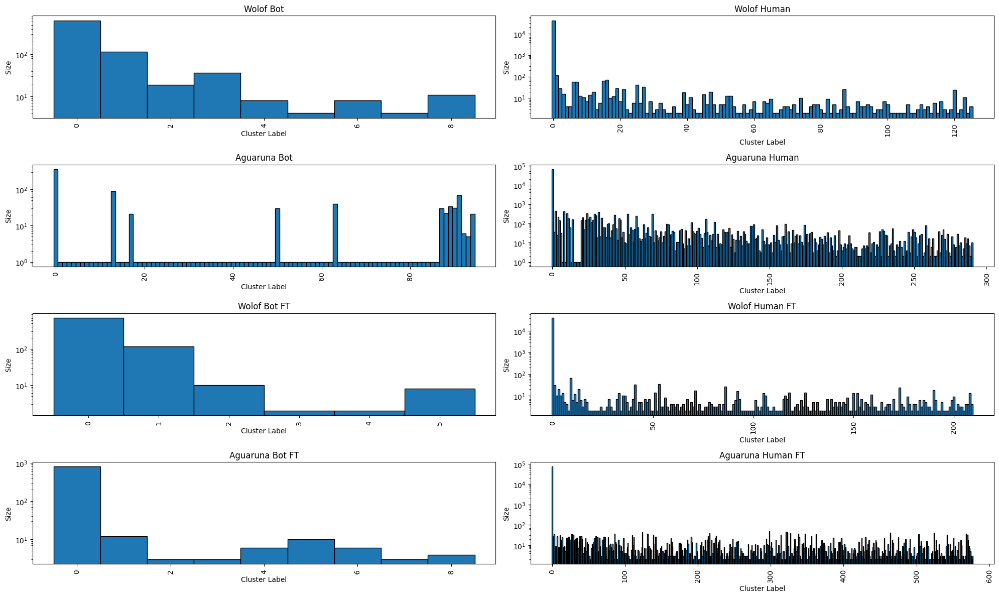

In [ ]:
import matplotlib.pyplot as plt
from collections import Counter

label_sets = [labels_wolof_bot, labels_wolof_human, labels_aguaruna_bot, labels_aguaruna_human,
              labels_wolof_bot_ft, labels_wolof_human_ft, labels_aguaruna_bot_ft, labels_aguaruna_human_ft]
titles = ["Wolof Bot", "Wolof Human", "Aguaruna Bot", "Aguaruna Human",
          "Wolof Bot FT", "Wolof Human FT", "Aguaruna Bot FT", "Aguaruna Human FT"]

# Plotting
plt.figure(figsize=(20, 12))
for i, labels in enumerate(label_sets, 1):
    plt.subplot(4, 2, i)
    cluster_sizes = Counter(labels)
    sorted_cluster_sizes = sorted(cluster_sizes.items())
    sorted_labels, sorted_sizes = zip(*sorted_cluster_sizes)

    plt.bar(sorted_labels, sorted_sizes, width=1.0, edgecolor="black")
    plt.title(titles[i-1])
    plt.xlabel('Cluster Label')
    plt.ylabel('Size')
    plt.yscale('log')
    plt.xticks(rotation=90)

plt.tight_layout()
plt.show()


Processing Wolof Bot USE:   0%|          | 0/199 [00:00<?, ?it/s]Exception ignored on calling ctypes callback function: <function ThreadpoolController._find_libraries_with_dl_iterate_phdr.<locals>.match_library_callback at 0x7b011bfe3920>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/threadpoolctl.py", line 1005, in match_library_callback
    self._make_controller_from_path(filepath)
  File "/usr/local/lib/python3.11/dist-packages/threadpoolctl.py", line 1187, in _make_controller_from_path
    lib_controller = controller_class(
                     ^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/threadpoolctl.py", line 114, in __init__
    self.dynlib = ctypes.CDLL(filepath, mode=_RTLD_NOLOAD)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/lib/python3.11/ctypes/__init__.py", line 376, in __init__
    self._handle = _dlopen(self._name, mode)
                   ^^^^^^^^^^^^^^^^^^^^^^^^^
OSError: /usr/local/li

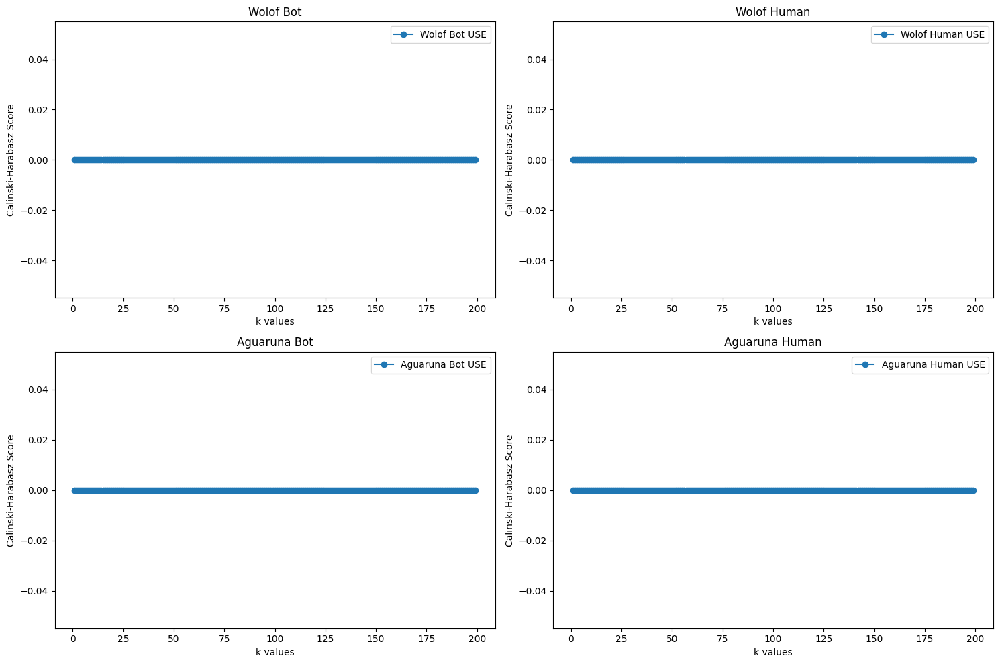

Best k values for each dataset:
Wolof Bot USE: 0
Wolof Human USE: 0
Aguaruna Bot USE: 0
Aguaruna Human USE: 0


In [ ]:
# Define the datasets and their labels for easier management

languages = ['Wolof', 'Aguaruna']
types = ['Bot', 'Human']

datasets = {
    'Wolof Bot USE': vectors_wolof_bot_use_ngrams,
    'Wolof Human USE': vectors_wolof_human_use_ngrams,
    'Aguaruna Bot USE': vectors_aguaruna_bot_use_ngrams,
    'Aguaruna Human USE': vectors_aguaruna_human_use_ngrams
}

# Define k and h values for each dataset
k_h_values = {
    'Wolof Bot USE': {'k': 10, 'h': 15},
    'Wolof Human USE': {'k': 58, 'h': 15},
    'Aguaruna Bot USE': {'k': 22, 'h': 15},
    'Aguaruna Human USE': {'k': 59, 'h': 15}
}

fig, axs = plt.subplots(2, 2, figsize=(15, 10))  # Adjust subplot grid as necessary
axs = axs.flatten()
best_k_values = []

for idx, (lang_type, vectors) in enumerate(datasets.items()):
    k_values = range(1, 200)
    ch_scores = []
    max_ch_score = 0
    best_k = 0

    for k in tqdm(k_values, desc=f"Processing {lang_type}"):
        wishart = DBSCAN(eps=k_h_values[lang_type]['h'], min_samples=k)  # Update to use DBSCAN for Wishart clustering
        labels = wishart.fit_predict(vectors)
        if np.unique(labels).size > 1:  # Ensure there's more than one cluster
            ch_score = calinski_harabasz_score(vectors, labels)
            ch_scores.append(ch_score)
            if ch_score > max_ch_score:
                max_ch_score = ch_score
                best_k = k
        else:
            ch_scores.append(0)  # Assign a zero score if only one cluster

    best_k_values.append(best_k)  # Append the best k for this dataset

    # Select the appropriate subplot based on language and type
    if 'Wolof' in lang_type:
        plot_index = 0 if 'Bot' in lang_type else 1
    else:  # Aguaruna
        plot_index = 2 if 'Bot' in lang_type else 3

    # Plotting
    axs[plot_index].plot(k_values, ch_scores, marker='o', linestyle='-', label=f'{lang_type}')
    axs[plot_index].set_title(f'{languages[plot_index // 2]} {types[plot_index % 2]}')
    axs[plot_index].set_xlabel('k values')
    axs[plot_index].set_ylabel('Calinski-Harabasz Score')
    axs[plot_index].legend()

plt.tight_layout()
plt.show()

print("Best k values for each dataset:")
for name, k in zip(datasets, best_k_values):
    print(f"{name}: {k}")


Processing Aguaruna Human USE: 100%|██████████| 58/58 [00:16<00:00,  3.45it/s]


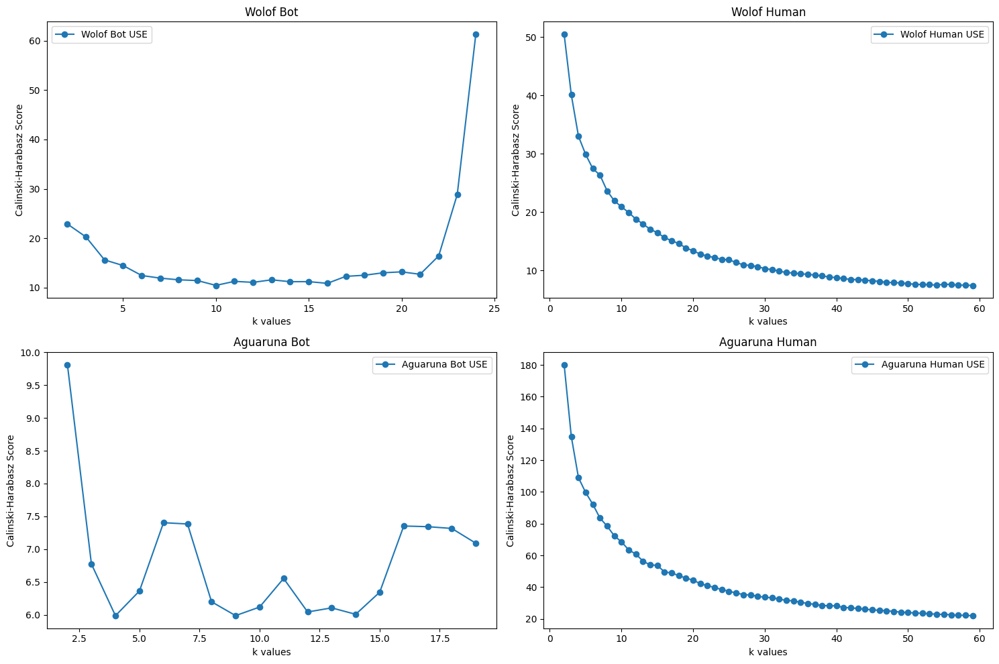

Best k values for each dataset:
Wolof Bot USE: 24
Wolof Human USE: 2
Aguaruna Bot USE: 2
Aguaruna Human USE: 2


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import calinski_harabasz_score
from sklearn.cluster import KMeans
from tqdm import tqdm
import tensorflow_hub as hub

# Load Universal Sentence Encoder
embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

# Function to create n-grams for USE embeddings
def create_ngram_dataset_use(vectors, n=3):
    all_ngrams = []
    all_ngrams_vectors = []
    for i in range(len(vectors) - n + 1):
        ngram = vectors[i:i + n]
        ngram_vector = np.mean(ngram, axis=0)  # Average the n-gram vectors
        all_ngrams.append(ngram)
        all_ngrams_vectors.append(ngram_vector)
    return all_ngrams, np.array(all_ngrams_vectors)

# Assuming vectors_wolof_bot_use, vectors_wolof_human_use, vectors_aguaruna_bot_use, vectors_aguaruna_human_use are defined
ngrams_wolof_bot_use, vectors_wolof_bot_use_ngrams = create_ngram_dataset_use(vectors_wolof_bot_use)
ngrams_wolof_human_use, vectors_wolof_human_use_ngrams = create_ngram_dataset_use(vectors_wolof_human_use)
ngrams_aguaruna_bot_use, vectors_aguaruna_bot_use_ngrams = create_ngram_dataset_use(vectors_aguaruna_bot_use)
ngrams_aguaruna_human_use, vectors_aguaruna_human_use_ngrams = create_ngram_dataset_use(vectors_aguaruna_human_use)

# Define the datasets and their labels for easier management
datasets = {
    'Wolof Bot USE': vectors_wolof_bot_use_ngrams,
    'Wolof Human USE': vectors_wolof_human_use_ngrams,
    'Aguaruna Bot USE': vectors_aguaruna_bot_use_ngrams,
    'Aguaruna Human USE': vectors_aguaruna_human_use_ngrams
}

languages = ['Wolof', 'Aguaruna']
types = ['Bot', 'Human']

fig, axs = plt.subplots(2, 2, figsize=(15, 10))  # Adjust subplot grid as necessary
axs = axs.flatten()
best_k_values = []

for idx, (lang_type, vectors) in enumerate(datasets.items()):

    #
    n_samples = len(vectors)
    max_k = min(59, n_samples - 1)

    k_values = range(2, max_k + 1)
    ch_scores = []
    max_ch_score = 0
    best_k = 0

    for k in tqdm(k_values, desc=f"Processing {lang_type}"):
        kmeans = KMeans(n_clusters=k, random_state=0)
        labels = kmeans.fit_predict(vectors)
        if np.unique(labels).size > 1:  # Ensure there's more than one cluster
            ch_score = calinski_harabasz_score(vectors, labels)
            ch_scores.append(ch_score)
            if ch_score > max_ch_score:
                max_ch_score = ch_score
                best_k = k
        else:
            ch_scores.append(0)  # Assign a zero score if only one cluster

    best_k_values.append(best_k)  # Append the best k for this dataset

    # Select the appropriate subplot based on language and type
    if 'Wolof' in lang_type:
        plot_index = 0 if 'Bot' in lang_type else 1
    else:  # Aguaruna
        plot_index = 2 if 'Bot' in lang_type else 3

    # Plotting
    axs[plot_index].plot(k_values, ch_scores, marker='o', linestyle='-', label=f'{lang_type}')
    axs[plot_index].set_title(f'{languages[plot_index // 2]} {types[plot_index % 2]}')
    axs[plot_index].set_xlabel('k values')
    axs[plot_index].set_ylabel('Calinski-Harabasz Score')
    axs[plot_index].legend()

plt.tight_layout()
plt.show()

print("Best k values for each dataset:")
for name, k in zip(datasets, best_k_values):
    print(f"{name}: {k}")


Processing Wolof Bot Word2Vec:   6%|▌         | 6/100 [00:00<00:01, 51.50it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Wolof Bot Word2Vec:  17%|█▋        | 17/100 [00:00<00:01, 46.95it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Wolof Bot Word2Vec:  22%|██▏       | 22/100 [00:00<00:01, 44.89it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Wolof Bot Word2Vec:  27%|██▋       | 27/100 [00:00<00:01, 43.42it/s]

Start clustering


Processing Wolof Bot Word2Vec:  32%|███▏      | 32/100 [00:00<00:01, 41.91it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Wolof Bot Word2Vec:  42%|████▏     | 42/100 [00:01<00:01, 38.24it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Wolof Bot Word2Vec:  46%|████▌     | 46/100 [00:01<00:01, 37.09it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Wolof Bot Word2Vec:  50%|█████     | 50/100 [00:01<00:01, 36.47it/s]

Start clustering


Processing Wolof Bot Word2Vec:  54%|█████▍    | 54/100 [00:01<00:01, 36.08it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Wolof Bot Word2Vec:  62%|██████▏   | 62/100 [00:01<00:01, 34.93it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Wolof Bot Word2Vec:  70%|███████   | 70/100 [00:01<00:00, 34.41it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Wolof Bot Word2Vec:  74%|███████▍  | 74/100 [00:01<00:00, 34.20it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Wolof Bot Word2Vec:  78%|███████▊  | 78/100 [00:02<00:00, 33.85it/s]

Start clustering


Processing Wolof Bot Word2Vec:  82%|████████▏ | 82/100 [00:02<00:00, 33.39it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Wolof Bot Word2Vec:  90%|█████████ | 90/100 [00:02<00:00, 32.35it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Wolof Bot Word2Vec:  94%|█████████▍| 94/100 [00:02<00:00, 31.66it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Wolof Bot Word2Vec:  98%|█████████▊| 98/100 [00:02<00:00, 31.08it/s]

Start clustering


Processing Wolof Bot Word2Vec: 100%|██████████| 100/100 [00:02<00:00, 36.01it/s]


Start clustering
Start clustering


Processing Wolof Human Word2Vec:   0%|          | 0/100 [00:00<?, ?it/s]

Start clustering


Processing Wolof Human Word2Vec:   1%|          | 1/100 [00:06<09:54,  6.01s/it]

Start clustering


Processing Wolof Human Word2Vec:   2%|▏         | 2/100 [00:12<09:56,  6.09s/it]

Start clustering


Processing Wolof Human Word2Vec:   3%|▎         | 3/100 [00:18<09:58,  6.17s/it]

Start clustering


Processing Wolof Human Word2Vec:   4%|▍         | 4/100 [00:24<09:59,  6.25s/it]

Start clustering


Processing Wolof Human Word2Vec:   5%|▌         | 5/100 [00:31<10:00,  6.33s/it]

Start clustering


Processing Wolof Human Word2Vec:   6%|▌         | 6/100 [00:37<10:02,  6.40s/it]

Start clustering


Processing Wolof Human Word2Vec:   7%|▋         | 7/100 [00:44<10:02,  6.48s/it]

Start clustering


Processing Wolof Human Word2Vec:   8%|▊         | 8/100 [00:51<10:05,  6.58s/it]

Start clustering


Processing Wolof Human Word2Vec:   9%|▉         | 9/100 [00:58<10:08,  6.69s/it]

Start clustering


Processing Wolof Human Word2Vec:  10%|█         | 10/100 [01:05<10:09,  6.78s/it]

Start clustering


Processing Wolof Human Word2Vec:  11%|█         | 11/100 [01:12<10:08,  6.84s/it]

Start clustering


Processing Wolof Human Word2Vec:  12%|█▏        | 12/100 [01:19<10:05,  6.88s/it]

Start clustering


Processing Wolof Human Word2Vec:  13%|█▎        | 13/100 [01:26<10:03,  6.94s/it]

Start clustering


Processing Wolof Human Word2Vec:  14%|█▍        | 14/100 [01:33<10:00,  6.99s/it]

Start clustering


Processing Wolof Human Word2Vec:  15%|█▌        | 15/100 [01:40<09:57,  7.03s/it]

Start clustering


Processing Wolof Human Word2Vec:  16%|█▌        | 16/100 [01:47<09:55,  7.09s/it]

Start clustering


Processing Wolof Human Word2Vec:  17%|█▋        | 17/100 [01:54<09:54,  7.16s/it]

Start clustering


Processing Wolof Human Word2Vec:  18%|█▊        | 18/100 [02:02<09:51,  7.21s/it]

Start clustering


Processing Wolof Human Word2Vec:  19%|█▉        | 19/100 [02:09<09:47,  7.25s/it]

Start clustering


Processing Wolof Human Word2Vec:  20%|██        | 20/100 [02:17<09:43,  7.29s/it]

Start clustering


Processing Wolof Human Word2Vec:  21%|██        | 21/100 [02:24<09:39,  7.34s/it]

Start clustering


Processing Wolof Human Word2Vec:  22%|██▏       | 22/100 [02:32<09:38,  7.42s/it]

Start clustering


Processing Wolof Human Word2Vec:  23%|██▎       | 23/100 [02:39<09:36,  7.49s/it]

Start clustering


Processing Wolof Human Word2Vec:  24%|██▍       | 24/100 [02:47<09:34,  7.56s/it]

Start clustering


Processing Wolof Human Word2Vec:  25%|██▌       | 25/100 [02:55<09:30,  7.61s/it]

Start clustering


Processing Wolof Human Word2Vec:  26%|██▌       | 26/100 [03:02<09:26,  7.66s/it]

Start clustering


Processing Wolof Human Word2Vec:  27%|██▋       | 27/100 [03:10<09:23,  7.72s/it]

Start clustering


Processing Wolof Human Word2Vec:  28%|██▊       | 28/100 [03:18<09:18,  7.76s/it]

Start clustering


Processing Wolof Human Word2Vec:  29%|██▉       | 29/100 [03:26<09:14,  7.81s/it]

Start clustering


Processing Wolof Human Word2Vec:  30%|███       | 30/100 [03:34<09:06,  7.81s/it]

Start clustering


Processing Wolof Human Word2Vec:  31%|███       | 31/100 [03:42<08:59,  7.82s/it]

Start clustering


Processing Wolof Human Word2Vec:  32%|███▏      | 32/100 [03:50<08:52,  7.83s/it]

Start clustering


Processing Wolof Human Word2Vec:  33%|███▎      | 33/100 [03:58<08:46,  7.86s/it]

Start clustering


Processing Wolof Human Word2Vec:  34%|███▍      | 34/100 [04:05<08:40,  7.88s/it]

Start clustering


Processing Wolof Human Word2Vec:  35%|███▌      | 35/100 [04:13<08:34,  7.91s/it]

Start clustering


Processing Wolof Human Word2Vec:  36%|███▌      | 36/100 [04:21<08:28,  7.94s/it]

Start clustering


Processing Wolof Human Word2Vec:  37%|███▋      | 37/100 [04:29<08:22,  7.97s/it]

Start clustering


Processing Wolof Human Word2Vec:  38%|███▊      | 38/100 [04:38<08:19,  8.06s/it]

Start clustering


Processing Wolof Human Word2Vec:  39%|███▉      | 39/100 [04:46<08:15,  8.12s/it]

Start clustering


Processing Wolof Human Word2Vec:  40%|████      | 40/100 [04:54<08:10,  8.17s/it]

Start clustering


Processing Wolof Human Word2Vec:  41%|████      | 41/100 [05:03<08:05,  8.23s/it]

Start clustering


Processing Wolof Human Word2Vec:  42%|████▏     | 42/100 [05:11<07:59,  8.26s/it]

Start clustering


Processing Wolof Human Word2Vec:  43%|████▎     | 43/100 [05:19<07:50,  8.25s/it]

Start clustering


Processing Wolof Human Word2Vec:  44%|████▍     | 44/100 [05:27<07:41,  8.25s/it]

Start clustering


Processing Wolof Human Word2Vec:  45%|████▌     | 45/100 [05:36<07:36,  8.30s/it]

Start clustering


Processing Wolof Human Word2Vec:  46%|████▌     | 46/100 [05:44<07:29,  8.32s/it]

Start clustering


Processing Wolof Human Word2Vec:  47%|████▋     | 47/100 [05:53<07:22,  8.34s/it]

Start clustering


Processing Wolof Human Word2Vec:  48%|████▊     | 48/100 [06:01<07:14,  8.35s/it]

Start clustering


Processing Wolof Human Word2Vec:  49%|████▉     | 49/100 [06:09<07:06,  8.37s/it]

Start clustering


Processing Wolof Human Word2Vec:  50%|█████     | 50/100 [06:18<06:59,  8.39s/it]

Start clustering


Processing Wolof Human Word2Vec:  51%|█████     | 51/100 [06:26<06:52,  8.41s/it]

Start clustering


Processing Wolof Human Word2Vec:  52%|█████▏    | 52/100 [06:35<06:44,  8.43s/it]

Start clustering


Processing Wolof Human Word2Vec:  53%|█████▎    | 53/100 [06:43<06:37,  8.46s/it]

Start clustering


Processing Wolof Human Word2Vec:  54%|█████▍    | 54/100 [06:52<06:30,  8.48s/it]

Start clustering


Processing Wolof Human Word2Vec:  55%|█████▌    | 55/100 [07:00<06:22,  8.51s/it]

Start clustering


Processing Wolof Human Word2Vec:  56%|█████▌    | 56/100 [07:09<06:15,  8.54s/it]

Start clustering


Processing Wolof Human Word2Vec:  57%|█████▋    | 57/100 [07:18<06:09,  8.59s/it]

Start clustering


Processing Wolof Human Word2Vec:  58%|█████▊    | 58/100 [07:26<06:01,  8.62s/it]

Start clustering


Processing Wolof Human Word2Vec:  59%|█████▉    | 59/100 [07:35<05:53,  8.63s/it]

Start clustering


Processing Wolof Human Word2Vec:  60%|██████    | 60/100 [07:44<05:46,  8.67s/it]

Start clustering


Processing Wolof Human Word2Vec:  61%|██████    | 61/100 [07:53<05:38,  8.69s/it]

Start clustering


Processing Wolof Human Word2Vec:  62%|██████▏   | 62/100 [08:01<05:31,  8.71s/it]

Start clustering


Processing Wolof Human Word2Vec:  63%|██████▎   | 63/100 [08:10<05:25,  8.79s/it]

Start clustering


Processing Wolof Human Word2Vec:  64%|██████▍   | 64/100 [08:19<05:18,  8.85s/it]

Start clustering


Processing Wolof Human Word2Vec:  65%|██████▌   | 65/100 [08:28<05:09,  8.85s/it]

Start clustering


Processing Wolof Human Word2Vec:  66%|██████▌   | 66/100 [08:37<05:01,  8.86s/it]

Start clustering


Processing Wolof Human Word2Vec:  67%|██████▋   | 67/100 [08:46<04:52,  8.87s/it]

Start clustering


Processing Wolof Human Word2Vec:  68%|██████▊   | 68/100 [08:55<04:44,  8.89s/it]

Start clustering


Processing Wolof Human Word2Vec:  69%|██████▉   | 69/100 [09:04<04:36,  8.91s/it]

Start clustering


Processing Wolof Human Word2Vec:  70%|███████   | 70/100 [09:13<04:28,  8.93s/it]

Start clustering


Processing Wolof Human Word2Vec:  71%|███████   | 71/100 [09:22<04:19,  8.96s/it]

Start clustering


Processing Wolof Human Word2Vec:  72%|███████▏  | 72/100 [09:31<04:11,  8.98s/it]

Start clustering


Processing Wolof Human Word2Vec:  73%|███████▎  | 73/100 [09:40<04:03,  9.03s/it]

Start clustering


Processing Wolof Human Word2Vec:  74%|███████▍  | 74/100 [09:49<03:55,  9.05s/it]

Start clustering


Processing Wolof Human Word2Vec:  75%|███████▌  | 75/100 [09:58<03:46,  9.06s/it]

Start clustering


Processing Wolof Human Word2Vec:  76%|███████▌  | 76/100 [10:07<03:38,  9.09s/it]

Start clustering


Processing Wolof Human Word2Vec:  77%|███████▋  | 77/100 [10:17<03:30,  9.16s/it]

Start clustering


Processing Wolof Human Word2Vec:  78%|███████▊  | 78/100 [10:26<03:22,  9.22s/it]

Start clustering


Processing Wolof Human Word2Vec:  79%|███████▉  | 79/100 [10:35<03:14,  9.27s/it]

Start clustering


Processing Wolof Human Word2Vec:  80%|████████  | 80/100 [10:45<03:06,  9.31s/it]

Start clustering


Processing Wolof Human Word2Vec:  81%|████████  | 81/100 [10:54<02:57,  9.33s/it]

Start clustering


Processing Wolof Human Word2Vec:  82%|████████▏ | 82/100 [11:04<02:47,  9.32s/it]

Start clustering


Processing Wolof Human Word2Vec:  83%|████████▎ | 83/100 [11:13<02:38,  9.31s/it]

Start clustering


Processing Wolof Human Word2Vec:  84%|████████▍ | 84/100 [11:22<02:28,  9.31s/it]

Start clustering


Processing Wolof Human Word2Vec:  85%|████████▌ | 85/100 [11:31<02:19,  9.32s/it]

Start clustering


Processing Wolof Human Word2Vec:  86%|████████▌ | 86/100 [11:41<02:11,  9.38s/it]

Start clustering


Processing Wolof Human Word2Vec:  87%|████████▋ | 87/100 [11:51<02:02,  9.44s/it]

Start clustering


Processing Wolof Human Word2Vec:  88%|████████▊ | 88/100 [12:00<01:53,  9.49s/it]

Start clustering


Processing Wolof Human Word2Vec:  89%|████████▉ | 89/100 [12:10<01:44,  9.53s/it]

Start clustering


Processing Wolof Human Word2Vec:  90%|█████████ | 90/100 [12:19<01:35,  9.53s/it]

Start clustering


Processing Wolof Human Word2Vec:  91%|█████████ | 91/100 [12:29<01:25,  9.52s/it]

Start clustering


Processing Wolof Human Word2Vec:  92%|█████████▏| 92/100 [12:38<01:16,  9.52s/it]

Start clustering


Processing Wolof Human Word2Vec:  93%|█████████▎| 93/100 [12:48<01:06,  9.53s/it]

Start clustering


Processing Wolof Human Word2Vec:  94%|█████████▍| 94/100 [12:57<00:57,  9.54s/it]

Start clustering


Processing Wolof Human Word2Vec:  95%|█████████▌| 95/100 [13:07<00:47,  9.59s/it]

Start clustering


Processing Wolof Human Word2Vec:  96%|█████████▌| 96/100 [13:17<00:38,  9.64s/it]

Start clustering


Processing Wolof Human Word2Vec:  97%|█████████▋| 97/100 [13:27<00:29,  9.69s/it]

Start clustering


Processing Wolof Human Word2Vec:  98%|█████████▊| 98/100 [13:36<00:19,  9.70s/it]

Start clustering


Processing Wolof Human Word2Vec:  99%|█████████▉| 99/100 [13:46<00:09,  9.68s/it]

Start clustering


Processing Aguaruna Bot Word2Vec:   5%|▌         | 5/100 [00:00<00:02, 44.56it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Aguaruna Bot Word2Vec:  15%|█▌        | 15/100 [00:00<00:01, 43.06it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Aguaruna Bot Word2Vec:  25%|██▌       | 25/100 [00:00<00:01, 41.42it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Aguaruna Bot Word2Vec:  35%|███▌      | 35/100 [00:00<00:01, 40.22it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Aguaruna Bot Word2Vec:  40%|████      | 40/100 [00:00<00:01, 39.63it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Aguaruna Bot Word2Vec:  48%|████▊     | 48/100 [00:01<00:01, 38.35it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Aguaruna Bot Word2Vec:  56%|█████▌    | 56/100 [00:01<00:01, 36.57it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Aguaruna Bot Word2Vec:  64%|██████▍   | 64/100 [00:01<00:01, 34.80it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Aguaruna Bot Word2Vec:  68%|██████▊   | 68/100 [00:01<00:00, 33.85it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Aguaruna Bot Word2Vec:  76%|███████▌  | 76/100 [00:02<00:00, 32.26it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Aguaruna Bot Word2Vec:  84%|████████▍ | 84/100 [00:02<00:00, 33.00it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Aguaruna Bot Word2Vec:  92%|█████████▏| 92/100 [00:02<00:00, 33.39it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Aguaruna Bot Word2Vec: 100%|██████████| 100/100 [00:02<00:00, 36.13it/s]


Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Aguaruna Human Word2Vec:   0%|          | 0/100 [00:00<?, ?it/s]

Start clustering


Processing Aguaruna Human Word2Vec:   1%|          | 1/100 [00:20<34:30, 20.91s/it]

Start clustering


Processing Aguaruna Human Word2Vec:   2%|▏         | 2/100 [00:42<34:36, 21.19s/it]

Start clustering


Processing Aguaruna Human Word2Vec:   3%|▎         | 3/100 [01:04<34:53, 21.58s/it]

Start clustering


Processing Aguaruna Human Word2Vec:   4%|▍         | 4/100 [01:27<35:17, 22.05s/it]

Start clustering


Processing Aguaruna Human Word2Vec:   5%|▌         | 5/100 [01:49<35:21, 22.33s/it]

Start clustering


Processing Aguaruna Human Word2Vec:   6%|▌         | 6/100 [02:12<35:10, 22.45s/it]

Start clustering


Processing Aguaruna Human Word2Vec:   7%|▋         | 7/100 [02:35<35:12, 22.71s/it]

Start clustering


Processing Aguaruna Human Word2Vec:   8%|▊         | 8/100 [02:59<35:05, 22.88s/it]

Start clustering


Processing Aguaruna Human Word2Vec:   9%|▉         | 9/100 [03:22<34:54, 23.01s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  10%|█         | 10/100 [03:45<34:41, 23.13s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  11%|█         | 11/100 [04:09<34:39, 23.36s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  12%|█▏        | 12/100 [04:33<34:36, 23.60s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  13%|█▎        | 13/100 [04:57<34:21, 23.69s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  14%|█▍        | 14/100 [05:21<34:08, 23.82s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  15%|█▌        | 15/100 [05:46<34:04, 24.05s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  16%|█▌        | 16/100 [06:10<33:49, 24.16s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  17%|█▋        | 17/100 [06:35<33:37, 24.30s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  18%|█▊        | 18/100 [07:00<33:22, 24.42s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  19%|█▉        | 19/100 [07:25<33:19, 24.68s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  20%|██        | 20/100 [07:50<33:01, 24.77s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  21%|██        | 21/100 [08:15<32:44, 24.87s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  22%|██▏       | 22/100 [08:40<32:27, 24.97s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  23%|██▎       | 23/100 [09:06<32:17, 25.17s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  24%|██▍       | 24/100 [09:32<32:10, 25.40s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  25%|██▌       | 25/100 [09:58<31:54, 25.53s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  26%|██▌       | 26/100 [10:23<31:30, 25.55s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  27%|██▋       | 27/100 [10:49<31:09, 25.61s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  28%|██▊       | 28/100 [11:15<30:47, 25.66s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  29%|██▉       | 29/100 [11:41<30:35, 25.86s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  30%|███       | 30/100 [12:07<30:20, 26.01s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  31%|███       | 31/100 [12:34<30:00, 26.10s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  32%|███▏      | 32/100 [13:00<29:41, 26.20s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  33%|███▎      | 33/100 [13:26<29:15, 26.21s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  34%|███▍      | 34/100 [13:53<28:54, 26.28s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  35%|███▌      | 35/100 [14:20<28:38, 26.44s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  36%|███▌      | 36/100 [14:46<28:13, 26.45s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  37%|███▋      | 37/100 [15:13<27:48, 26.48s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  38%|███▊      | 38/100 [15:39<27:24, 26.53s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  39%|███▉      | 39/100 [16:06<27:02, 26.60s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  40%|████      | 40/100 [16:34<26:51, 26.85s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  41%|████      | 41/100 [17:01<26:26, 26.90s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  42%|████▏     | 42/100 [17:28<26:06, 27.02s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  43%|████▎     | 43/100 [17:56<25:51, 27.21s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  44%|████▍     | 44/100 [18:23<25:26, 27.25s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  45%|████▌     | 45/100 [18:51<25:08, 27.43s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  46%|████▌     | 46/100 [19:18<24:38, 27.38s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  47%|████▋     | 47/100 [19:46<24:13, 27.42s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  48%|████▊     | 48/100 [20:14<23:57, 27.64s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  49%|████▉     | 49/100 [20:42<23:36, 27.78s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  50%|█████     | 50/100 [21:09<23:04, 27.69s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  51%|█████     | 51/100 [21:37<22:36, 27.69s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  52%|█████▏    | 52/100 [22:05<22:14, 27.79s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  53%|█████▎    | 53/100 [22:33<21:50, 27.88s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  54%|█████▍    | 54/100 [23:01<21:20, 27.85s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  55%|█████▌    | 55/100 [23:29<20:56, 27.93s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  56%|█████▌    | 56/100 [23:57<20:28, 27.92s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  57%|█████▋    | 57/100 [24:25<20:03, 27.99s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  58%|█████▊    | 58/100 [24:53<19:37, 28.03s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  59%|█████▉    | 59/100 [25:21<19:09, 28.04s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  60%|██████    | 60/100 [25:50<18:46, 28.15s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  61%|██████    | 61/100 [26:18<18:19, 28.19s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  62%|██████▏   | 62/100 [26:47<17:56, 28.34s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  63%|██████▎   | 63/100 [27:15<17:28, 28.34s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  64%|██████▍   | 64/100 [27:44<17:04, 28.47s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  65%|██████▌   | 65/100 [28:12<16:39, 28.57s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  66%|██████▌   | 66/100 [28:42<16:17, 28.76s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  67%|██████▋   | 67/100 [29:11<15:49, 28.77s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  68%|██████▊   | 68/100 [29:39<15:19, 28.73s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  69%|██████▉   | 69/100 [30:08<14:51, 28.77s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  70%|███████   | 70/100 [30:38<14:29, 28.99s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  71%|███████   | 71/100 [31:06<14:00, 28.97s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  72%|███████▏  | 72/100 [31:35<13:30, 28.93s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  73%|███████▎  | 73/100 [32:04<13:00, 28.91s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  74%|███████▍  | 74/100 [32:33<12:32, 28.95s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  75%|███████▌  | 75/100 [33:02<12:05, 29.02s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  76%|███████▌  | 76/100 [33:32<11:43, 29.32s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  77%|███████▋  | 77/100 [34:02<11:18, 29.51s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  78%|███████▊  | 78/100 [34:32<10:48, 29.50s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  79%|███████▉  | 79/100 [35:02<10:23, 29.70s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  80%|████████  | 80/100 [35:32<09:53, 29.66s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  81%|████████  | 81/100 [36:01<09:24, 29.69s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  82%|████████▏ | 82/100 [36:32<08:58, 29.89s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  83%|████████▎ | 83/100 [37:02<08:31, 30.10s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  84%|████████▍ | 84/100 [37:32<08:01, 30.09s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  85%|████████▌ | 85/100 [38:03<07:32, 30.19s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  86%|████████▌ | 86/100 [38:33<07:03, 30.24s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  87%|████████▋ | 87/100 [39:03<06:31, 30.12s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  88%|████████▊ | 88/100 [39:33<06:00, 30.00s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  89%|████████▉ | 89/100 [40:03<05:29, 29.96s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  90%|█████████ | 90/100 [40:33<04:59, 29.97s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  91%|█████████ | 91/100 [41:03<04:30, 30.00s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  92%|█████████▏| 92/100 [41:33<04:00, 30.06s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  93%|█████████▎| 93/100 [42:03<03:31, 30.16s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  94%|█████████▍| 94/100 [42:34<03:02, 30.37s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  95%|█████████▌| 95/100 [43:05<02:32, 30.42s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  96%|█████████▌| 96/100 [43:35<02:01, 30.34s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  97%|█████████▋| 97/100 [44:05<01:31, 30.40s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  98%|█████████▊| 98/100 [44:36<01:01, 30.52s/it]

Start clustering


Processing Aguaruna Human Word2Vec:  99%|█████████▉| 99/100 [45:07<00:30, 30.57s/it]

Start clustering


Processing Wolof Bot FastText:   6%|▌         | 6/100 [00:00<00:01, 51.64it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Wolof Bot FastText:  18%|█▊        | 18/100 [00:00<00:01, 46.54it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Wolof Bot FastText:  28%|██▊       | 28/100 [00:00<00:01, 44.66it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Wolof Bot FastText:  33%|███▎      | 33/100 [00:00<00:01, 43.72it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Wolof Bot FastText:  43%|████▎     | 43/100 [00:00<00:01, 42.04it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Wolof Bot FastText:  53%|█████▎    | 53/100 [00:01<00:01, 39.66it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Wolof Bot FastText:  61%|██████    | 61/100 [00:01<00:01, 37.73it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Wolof Bot FastText:  69%|██████▉   | 69/100 [00:01<00:00, 35.71it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Wolof Bot FastText:  73%|███████▎  | 73/100 [00:01<00:00, 34.78it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Wolof Bot FastText:  81%|████████  | 81/100 [00:02<00:00, 33.12it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Wolof Bot FastText:  89%|████████▉ | 89/100 [00:02<00:00, 31.65it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Wolof Bot FastText:  93%|█████████▎| 93/100 [00:02<00:00, 30.96it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Wolof Bot FastText: 100%|██████████| 100/100 [00:02<00:00, 36.81it/s]


Start clustering
Start clustering
Start clustering
Start clustering


Processing Wolof Human FastText:   0%|          | 0/100 [00:00<?, ?it/s]

Start clustering


Processing Wolof Human FastText:   1%|          | 1/100 [00:04<07:03,  4.28s/it]

Start clustering


Processing Wolof Human FastText:   2%|▏         | 2/100 [00:08<07:04,  4.33s/it]

Start clustering


Processing Wolof Human FastText:   3%|▎         | 3/100 [00:13<07:06,  4.39s/it]

Start clustering


Processing Wolof Human FastText:   4%|▍         | 4/100 [00:17<07:04,  4.42s/it]

Start clustering


Processing Wolof Human FastText:   5%|▌         | 5/100 [00:22<07:04,  4.47s/it]

Start clustering


Processing Wolof Human FastText:   6%|▌         | 6/100 [00:26<07:06,  4.54s/it]

Start clustering


Processing Wolof Human FastText:   7%|▋         | 7/100 [00:31<07:08,  4.61s/it]

Start clustering


Processing Wolof Human FastText:   8%|▊         | 8/100 [00:36<07:10,  4.68s/it]

Start clustering


Processing Wolof Human FastText:   9%|▉         | 9/100 [00:41<07:10,  4.74s/it]

Start clustering


Processing Wolof Human FastText:  10%|█         | 10/100 [00:46<07:11,  4.80s/it]

Start clustering


Processing Wolof Human FastText:  11%|█         | 11/100 [00:51<07:10,  4.83s/it]

Start clustering


Processing Wolof Human FastText:  12%|█▏        | 12/100 [00:56<07:09,  4.88s/it]

Start clustering


Processing Wolof Human FastText:  13%|█▎        | 13/100 [01:01<07:10,  4.94s/it]

Start clustering


Processing Wolof Human FastText:  14%|█▍        | 14/100 [01:06<07:10,  5.00s/it]

Start clustering


Processing Wolof Human FastText:  15%|█▌        | 15/100 [01:11<07:10,  5.06s/it]

Start clustering


Processing Wolof Human FastText:  16%|█▌        | 16/100 [01:16<07:07,  5.09s/it]

Start clustering


Processing Wolof Human FastText:  17%|█▋        | 17/100 [01:21<07:04,  5.12s/it]

Start clustering


Processing Wolof Human FastText:  18%|█▊        | 18/100 [01:27<07:01,  5.14s/it]

Start clustering


Processing Wolof Human FastText:  19%|█▉        | 19/100 [01:32<06:59,  5.17s/it]

Start clustering


Processing Wolof Human FastText:  20%|██        | 20/100 [01:37<06:56,  5.21s/it]

Start clustering


Processing Wolof Human FastText:  21%|██        | 21/100 [01:42<06:54,  5.25s/it]

Start clustering


Processing Wolof Human FastText:  22%|██▏       | 22/100 [01:48<06:51,  5.28s/it]

Start clustering


Processing Wolof Human FastText:  23%|██▎       | 23/100 [01:53<06:49,  5.32s/it]

Start clustering


Processing Wolof Human FastText:  24%|██▍       | 24/100 [01:59<06:46,  5.35s/it]

Start clustering


Processing Wolof Human FastText:  25%|██▌       | 25/100 [02:04<06:44,  5.39s/it]

Start clustering


Processing Wolof Human FastText:  26%|██▌       | 26/100 [02:10<06:41,  5.42s/it]

Start clustering


Processing Wolof Human FastText:  27%|██▋       | 27/100 [02:15<06:37,  5.45s/it]

Start clustering


Processing Wolof Human FastText:  28%|██▊       | 28/100 [02:21<06:35,  5.49s/it]

Start clustering


Processing Wolof Human FastText:  29%|██▉       | 29/100 [02:26<06:32,  5.52s/it]

Start clustering


Processing Wolof Human FastText:  30%|███       | 30/100 [02:32<06:29,  5.56s/it]

Start clustering


Processing Wolof Human FastText:  31%|███       | 31/100 [02:38<06:25,  5.59s/it]

Start clustering


Processing Wolof Human FastText:  32%|███▏      | 32/100 [02:43<06:22,  5.62s/it]

Start clustering


Processing Wolof Human FastText:  33%|███▎      | 33/100 [02:49<06:19,  5.66s/it]

Start clustering


Processing Wolof Human FastText:  34%|███▍      | 34/100 [02:55<06:18,  5.73s/it]

Start clustering


Processing Wolof Human FastText:  35%|███▌      | 35/100 [03:01<06:15,  5.78s/it]

Start clustering


Processing Wolof Human FastText:  36%|███▌      | 36/100 [03:07<06:13,  5.83s/it]

Start clustering


Processing Wolof Human FastText:  37%|███▋      | 37/100 [03:13<06:07,  5.84s/it]

Start clustering


Processing Wolof Human FastText:  38%|███▊      | 38/100 [03:19<06:03,  5.86s/it]

Start clustering


Processing Wolof Human FastText:  39%|███▉      | 39/100 [03:24<05:58,  5.88s/it]

Start clustering


Processing Wolof Human FastText:  40%|████      | 40/100 [03:30<05:54,  5.90s/it]

Start clustering


Processing Wolof Human FastText:  41%|████      | 41/100 [03:36<05:49,  5.93s/it]

Start clustering


Processing Wolof Human FastText:  42%|████▏     | 42/100 [03:42<05:45,  5.95s/it]

Start clustering


Processing Wolof Human FastText:  43%|████▎     | 43/100 [03:48<05:40,  5.98s/it]

Start clustering


Processing Wolof Human FastText:  44%|████▍     | 44/100 [03:55<05:38,  6.04s/it]

Start clustering


Processing Wolof Human FastText:  45%|████▌     | 45/100 [04:01<05:34,  6.09s/it]

Start clustering


Processing Wolof Human FastText:  46%|████▌     | 46/100 [04:07<05:29,  6.10s/it]

Start clustering


Processing Wolof Human FastText:  47%|████▋     | 47/100 [04:13<05:24,  6.13s/it]

Start clustering


Processing Wolof Human FastText:  48%|████▊     | 48/100 [04:19<05:19,  6.15s/it]

Start clustering


Processing Wolof Human FastText:  49%|████▉     | 49/100 [04:26<05:15,  6.19s/it]

Start clustering


Processing Wolof Human FastText:  50%|█████     | 50/100 [04:32<05:11,  6.23s/it]

Start clustering


Processing Wolof Human FastText:  51%|█████     | 51/100 [04:38<05:07,  6.27s/it]

Start clustering


Processing Wolof Human FastText:  52%|█████▏    | 52/100 [04:45<05:02,  6.31s/it]

Start clustering


Processing Wolof Human FastText:  53%|█████▎    | 53/100 [04:51<04:57,  6.34s/it]

Start clustering


Processing Wolof Human FastText:  54%|█████▍    | 54/100 [04:58<04:52,  6.36s/it]

Start clustering


Processing Wolof Human FastText:  55%|█████▌    | 55/100 [05:04<04:46,  6.36s/it]

Start clustering


Processing Wolof Human FastText:  56%|█████▌    | 56/100 [05:10<04:39,  6.36s/it]

Start clustering


Processing Wolof Human FastText:  57%|█████▋    | 57/100 [05:17<04:35,  6.41s/it]

Start clustering


Processing Wolof Human FastText:  58%|█████▊    | 58/100 [05:23<04:30,  6.45s/it]

Start clustering


Processing Wolof Human FastText:  59%|█████▉    | 59/100 [05:30<04:24,  6.45s/it]

Start clustering


Processing Wolof Human FastText:  60%|██████    | 60/100 [05:36<04:17,  6.45s/it]

Start clustering


Processing Wolof Human FastText:  61%|██████    | 61/100 [05:43<04:12,  6.47s/it]

Start clustering


Processing Wolof Human FastText:  62%|██████▏   | 62/100 [05:49<04:06,  6.49s/it]

Start clustering


Processing Wolof Human FastText:  63%|██████▎   | 63/100 [05:56<04:00,  6.51s/it]

Start clustering


Processing Wolof Human FastText:  64%|██████▍   | 64/100 [06:02<03:55,  6.53s/it]

Start clustering


Processing Wolof Human FastText:  65%|██████▌   | 65/100 [06:09<03:49,  6.55s/it]

Start clustering


Processing Wolof Human FastText:  66%|██████▌   | 66/100 [06:16<03:43,  6.57s/it]

Start clustering


Processing Wolof Human FastText:  67%|██████▋   | 67/100 [06:22<03:37,  6.60s/it]

Start clustering


Processing Wolof Human FastText:  68%|██████▊   | 68/100 [06:29<03:31,  6.62s/it]

Start clustering


Processing Wolof Human FastText:  69%|██████▉   | 69/100 [06:36<03:26,  6.67s/it]

Start clustering


Processing Wolof Human FastText:  70%|███████   | 70/100 [06:43<03:21,  6.73s/it]

Start clustering


Processing Wolof Human FastText:  71%|███████   | 71/100 [06:49<03:15,  6.73s/it]

Start clustering


Processing Wolof Human FastText:  72%|███████▏  | 72/100 [06:56<03:08,  6.74s/it]

Start clustering


Processing Wolof Human FastText:  73%|███████▎  | 73/100 [07:03<03:02,  6.75s/it]

Start clustering


Processing Wolof Human FastText:  74%|███████▍  | 74/100 [07:10<02:55,  6.77s/it]

Start clustering


Processing Wolof Human FastText:  75%|███████▌  | 75/100 [07:17<02:49,  6.79s/it]

Start clustering


Processing Wolof Human FastText:  76%|███████▌  | 76/100 [07:23<02:43,  6.82s/it]

Start clustering


Processing Wolof Human FastText:  77%|███████▋  | 77/100 [07:30<02:37,  6.84s/it]

Start clustering


Processing Wolof Human FastText:  78%|███████▊  | 78/100 [07:37<02:30,  6.86s/it]

Start clustering


Processing Wolof Human FastText:  79%|███████▉  | 79/100 [07:44<02:24,  6.88s/it]

Start clustering


Processing Wolof Human FastText:  80%|████████  | 80/100 [07:51<02:18,  6.90s/it]

Start clustering


Processing Wolof Human FastText:  81%|████████  | 81/100 [07:58<02:11,  6.92s/it]

Start clustering


Processing Wolof Human FastText:  82%|████████▏ | 82/100 [08:05<02:04,  6.94s/it]

Start clustering


Processing Wolof Human FastText:  83%|████████▎ | 83/100 [08:12<01:58,  6.97s/it]

Start clustering


Processing Wolof Human FastText:  84%|████████▍ | 84/100 [08:19<01:51,  6.99s/it]

Start clustering


Processing Wolof Human FastText:  85%|████████▌ | 85/100 [08:26<01:45,  7.02s/it]

Start clustering


Processing Wolof Human FastText:  86%|████████▌ | 86/100 [08:33<01:38,  7.04s/it]

Start clustering


Processing Wolof Human FastText:  87%|████████▋ | 87/100 [08:40<01:31,  7.07s/it]

Start clustering


Processing Wolof Human FastText:  88%|████████▊ | 88/100 [08:48<01:25,  7.13s/it]

Start clustering


Processing Wolof Human FastText:  89%|████████▉ | 89/100 [08:55<01:18,  7.17s/it]

Start clustering


Processing Wolof Human FastText:  90%|█████████ | 90/100 [09:02<01:12,  7.21s/it]

Start clustering


Processing Wolof Human FastText:  91%|█████████ | 91/100 [09:10<01:05,  7.25s/it]

Start clustering


Processing Wolof Human FastText:  92%|█████████▏| 92/100 [09:17<00:58,  7.30s/it]

Start clustering


Processing Wolof Human FastText:  93%|█████████▎| 93/100 [09:24<00:51,  7.33s/it]

Start clustering


Processing Wolof Human FastText:  94%|█████████▍| 94/100 [09:32<00:44,  7.34s/it]

Start clustering


Processing Wolof Human FastText:  95%|█████████▌| 95/100 [09:39<00:36,  7.36s/it]

Start clustering


Processing Wolof Human FastText:  96%|█████████▌| 96/100 [09:47<00:29,  7.39s/it]

Start clustering


Processing Wolof Human FastText:  97%|█████████▋| 97/100 [09:54<00:22,  7.43s/it]

Start clustering


Processing Wolof Human FastText:  98%|█████████▊| 98/100 [10:02<00:14,  7.46s/it]

Start clustering


Processing Wolof Human FastText:  99%|█████████▉| 99/100 [10:09<00:07,  7.49s/it]

Start clustering


Processing Aguaruna Bot FastText:   6%|▌         | 6/100 [00:00<00:01, 57.31it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Aguaruna Bot FastText:  18%|█▊        | 18/100 [00:00<00:01, 52.72it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Aguaruna Bot FastText:  30%|███       | 30/100 [00:00<00:01, 49.57it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Aguaruna Bot FastText:  40%|████      | 40/100 [00:00<00:01, 46.77it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Aguaruna Bot FastText:  50%|█████     | 50/100 [00:01<00:01, 43.93it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Aguaruna Bot FastText:  55%|█████▌    | 55/100 [00:01<00:01, 42.50it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Aguaruna Bot FastText:  65%|██████▌   | 65/100 [00:01<00:00, 39.84it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Aguaruna Bot FastText:  70%|███████   | 70/100 [00:01<00:00, 38.48it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Aguaruna Bot FastText:  78%|███████▊  | 78/100 [00:01<00:00, 36.40it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Aguaruna Bot FastText:  86%|████████▌ | 86/100 [00:02<00:00, 34.60it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Aguaruna Bot FastText:  94%|█████████▍| 94/100 [00:02<00:00, 32.98it/s]

Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Aguaruna Bot FastText: 100%|██████████| 100/100 [00:02<00:00, 39.81it/s]


Start clustering
Start clustering
Start clustering
Start clustering
Start clustering


Processing Aguaruna Human FastText:   0%|          | 0/100 [00:00<?, ?it/s]

Start clustering


Processing Aguaruna Human FastText:   1%|          | 1/100 [00:03<06:27,  3.91s/it]

Start clustering


Processing Aguaruna Human FastText:   2%|▏         | 2/100 [00:07<06:20,  3.88s/it]

Start clustering


Processing Aguaruna Human FastText:   3%|▎         | 3/100 [00:11<06:18,  3.90s/it]

Start clustering


Processing Aguaruna Human FastText:   4%|▍         | 4/100 [00:15<06:16,  3.92s/it]

Start clustering


Processing Aguaruna Human FastText:   5%|▌         | 5/100 [00:19<06:15,  3.95s/it]

Start clustering


Processing Aguaruna Human FastText:   6%|▌         | 6/100 [00:23<06:15,  4.00s/it]

Start clustering


Processing Aguaruna Human FastText:   7%|▋         | 7/100 [00:27<06:15,  4.04s/it]

Start clustering


Processing Aguaruna Human FastText:   8%|▊         | 8/100 [00:32<06:18,  4.11s/it]

Start clustering


Processing Aguaruna Human FastText:   9%|▉         | 9/100 [00:36<06:20,  4.19s/it]

Start clustering


Processing Aguaruna Human FastText:  10%|█         | 10/100 [00:40<06:23,  4.26s/it]

Start clustering


Processing Aguaruna Human FastText:  11%|█         | 11/100 [00:45<06:25,  4.33s/it]

Start clustering


Processing Aguaruna Human FastText:  12%|█▏        | 12/100 [00:49<06:27,  4.40s/it]

Start clustering


Processing Aguaruna Human FastText:  13%|█▎        | 13/100 [00:54<06:26,  4.44s/it]

Start clustering


Processing Aguaruna Human FastText:  14%|█▍        | 14/100 [00:59<06:24,  4.47s/it]

Start clustering


Processing Aguaruna Human FastText:  15%|█▌        | 15/100 [01:03<06:23,  4.51s/it]

Start clustering


Processing Aguaruna Human FastText:  16%|█▌        | 16/100 [01:08<06:22,  4.55s/it]

Start clustering


Processing Aguaruna Human FastText:  17%|█▋        | 17/100 [01:12<06:21,  4.60s/it]

Start clustering


Processing Aguaruna Human FastText:  18%|█▊        | 18/100 [01:17<06:20,  4.64s/it]

Start clustering


Processing Aguaruna Human FastText:  19%|█▉        | 19/100 [01:22<06:19,  4.68s/it]

Start clustering


Processing Aguaruna Human FastText:  20%|██        | 20/100 [01:27<06:18,  4.73s/it]

Start clustering


Processing Aguaruna Human FastText:  21%|██        | 21/100 [01:32<06:17,  4.78s/it]

Start clustering


Processing Aguaruna Human FastText:  22%|██▏       | 22/100 [01:37<06:16,  4.83s/it]

Start clustering


Processing Aguaruna Human FastText:  23%|██▎       | 23/100 [01:42<06:15,  4.88s/it]

Start clustering


Processing Aguaruna Human FastText:  24%|██▍       | 24/100 [01:47<06:14,  4.93s/it]

Start clustering


Processing Aguaruna Human FastText:  25%|██▌       | 25/100 [01:52<06:12,  4.97s/it]

Start clustering


Processing Aguaruna Human FastText:  26%|██▌       | 26/100 [01:57<06:12,  5.03s/it]

Start clustering


Processing Aguaruna Human FastText:  27%|██▋       | 27/100 [02:02<06:13,  5.12s/it]

Start clustering


Processing Aguaruna Human FastText:  28%|██▊       | 28/100 [02:08<06:14,  5.20s/it]

Start clustering


Processing Aguaruna Human FastText:  29%|██▉       | 29/100 [02:13<06:14,  5.27s/it]

Start clustering


Processing Aguaruna Human FastText:  30%|███       | 30/100 [02:19<06:13,  5.34s/it]

Start clustering


Processing Aguaruna Human FastText:  31%|███       | 31/100 [02:24<06:11,  5.39s/it]

Start clustering


Processing Aguaruna Human FastText:  32%|███▏      | 32/100 [02:30<06:10,  5.44s/it]

Start clustering


Processing Aguaruna Human FastText:  33%|███▎      | 33/100 [02:35<06:07,  5.49s/it]

Start clustering


Processing Aguaruna Human FastText:  34%|███▍      | 34/100 [02:41<06:06,  5.55s/it]

Start clustering


Processing Aguaruna Human FastText:  35%|███▌      | 35/100 [02:47<06:03,  5.59s/it]

Start clustering


Processing Aguaruna Human FastText:  36%|███▌      | 36/100 [02:52<05:59,  5.62s/it]

Start clustering


Processing Aguaruna Human FastText:  37%|███▋      | 37/100 [02:58<05:54,  5.62s/it]

Start clustering


Processing Aguaruna Human FastText:  38%|███▊      | 38/100 [03:04<05:51,  5.67s/it]

Start clustering


Processing Aguaruna Human FastText:  39%|███▉      | 39/100 [03:09<05:46,  5.68s/it]

Start clustering


Processing Aguaruna Human FastText:  40%|████      | 40/100 [03:15<05:43,  5.72s/it]

Start clustering


Processing Aguaruna Human FastText:  41%|████      | 41/100 [03:21<05:38,  5.73s/it]

Start clustering


Processing Aguaruna Human FastText:  42%|████▏     | 42/100 [03:27<05:34,  5.77s/it]

Start clustering


Processing Aguaruna Human FastText:  43%|████▎     | 43/100 [03:33<05:30,  5.79s/it]

Start clustering


Processing Aguaruna Human FastText:  44%|████▍     | 44/100 [03:39<05:26,  5.83s/it]

Start clustering


Processing Aguaruna Human FastText:  45%|████▌     | 45/100 [03:45<05:22,  5.87s/it]

Start clustering


Processing Aguaruna Human FastText:  46%|████▌     | 46/100 [03:51<05:19,  5.92s/it]

Start clustering


Processing Aguaruna Human FastText:  47%|████▋     | 47/100 [03:57<05:15,  5.95s/it]

Start clustering


Processing Aguaruna Human FastText:  48%|████▊     | 48/100 [04:03<05:12,  6.00s/it]

Start clustering


Processing Aguaruna Human FastText:  49%|████▉     | 49/100 [04:09<05:08,  6.04s/it]

Start clustering


Processing Aguaruna Human FastText:  50%|█████     | 50/100 [04:15<05:04,  6.09s/it]

Start clustering


Processing Aguaruna Human FastText:  51%|█████     | 51/100 [04:21<05:00,  6.13s/it]

Start clustering


Processing Aguaruna Human FastText:  52%|█████▏    | 52/100 [04:28<04:56,  6.18s/it]

Start clustering


Processing Aguaruna Human FastText:  53%|█████▎    | 53/100 [04:34<04:51,  6.21s/it]

Start clustering


Processing Aguaruna Human FastText:  54%|█████▍    | 54/100 [04:40<04:49,  6.30s/it]

Start clustering


Processing Aguaruna Human FastText:  55%|█████▌    | 55/100 [04:47<04:47,  6.39s/it]

Start clustering


Processing Aguaruna Human FastText:  56%|█████▌    | 56/100 [04:54<04:42,  6.42s/it]

Start clustering


Processing Aguaruna Human FastText:  57%|█████▋    | 57/100 [05:00<04:36,  6.43s/it]

Start clustering


Processing Aguaruna Human FastText:  58%|█████▊    | 58/100 [05:06<04:31,  6.45s/it]

Start clustering


Processing Aguaruna Human FastText:  59%|█████▉    | 59/100 [05:13<04:28,  6.54s/it]

Start clustering


Processing Aguaruna Human FastText:  60%|██████    | 60/100 [05:20<04:24,  6.62s/it]

Start clustering


Processing Aguaruna Human FastText:  61%|██████    | 61/100 [05:27<04:20,  6.69s/it]

Start clustering


Processing Aguaruna Human FastText:  62%|██████▏   | 62/100 [05:34<04:14,  6.70s/it]

Start clustering


Processing Aguaruna Human FastText:  63%|██████▎   | 63/100 [05:40<04:07,  6.70s/it]

Start clustering


Processing Aguaruna Human FastText:  64%|██████▍   | 64/100 [05:47<04:01,  6.72s/it]

Start clustering


Processing Aguaruna Human FastText:  65%|██████▌   | 65/100 [05:54<03:55,  6.74s/it]

Start clustering


Processing Aguaruna Human FastText:  66%|██████▌   | 66/100 [06:01<03:50,  6.77s/it]

Start clustering


Processing Aguaruna Human FastText:  67%|██████▋   | 67/100 [06:08<03:45,  6.83s/it]

Start clustering


Processing Aguaruna Human FastText:  68%|██████▊   | 68/100 [06:15<03:39,  6.86s/it]

Start clustering


Processing Aguaruna Human FastText:  69%|██████▉   | 69/100 [06:22<03:34,  6.93s/it]

Start clustering


Processing Aguaruna Human FastText:  70%|███████   | 70/100 [06:29<03:28,  6.96s/it]

Start clustering


Processing Aguaruna Human FastText:  71%|███████   | 71/100 [06:36<03:22,  6.98s/it]

Start clustering


Processing Aguaruna Human FastText:  72%|███████▏  | 72/100 [06:43<03:16,  7.02s/it]

Start clustering


Processing Aguaruna Human FastText:  73%|███████▎  | 73/100 [06:50<03:10,  7.06s/it]

Start clustering


Processing Aguaruna Human FastText:  74%|███████▍  | 74/100 [06:57<03:04,  7.11s/it]

Start clustering


Processing Aguaruna Human FastText:  75%|███████▌  | 75/100 [07:05<02:59,  7.18s/it]

Start clustering


Processing Aguaruna Human FastText:  76%|███████▌  | 76/100 [07:12<02:52,  7.20s/it]

Start clustering


Processing Aguaruna Human FastText:  77%|███████▋  | 77/100 [07:19<02:46,  7.26s/it]

Start clustering


Processing Aguaruna Human FastText:  78%|███████▊  | 78/100 [07:27<02:40,  7.28s/it]

Start clustering


Processing Aguaruna Human FastText:  79%|███████▉  | 79/100 [07:34<02:33,  7.30s/it]

Start clustering


Processing Aguaruna Human FastText:  80%|████████  | 80/100 [07:41<02:26,  7.33s/it]

Start clustering


Processing Aguaruna Human FastText:  81%|████████  | 81/100 [07:49<02:20,  7.38s/it]

Start clustering


Processing Aguaruna Human FastText:  82%|████████▏ | 82/100 [07:56<02:13,  7.40s/it]

Start clustering


Processing Aguaruna Human FastText:  83%|████████▎ | 83/100 [08:04<02:06,  7.43s/it]

Start clustering


Processing Aguaruna Human FastText:  84%|████████▍ | 84/100 [08:11<01:59,  7.46s/it]

Start clustering


Processing Aguaruna Human FastText:  85%|████████▌ | 85/100 [08:19<01:52,  7.50s/it]

Start clustering


Processing Aguaruna Human FastText:  86%|████████▌ | 86/100 [08:26<01:45,  7.53s/it]

Start clustering


Processing Aguaruna Human FastText:  87%|████████▋ | 87/100 [08:34<01:38,  7.56s/it]

Start clustering


Processing Aguaruna Human FastText:  88%|████████▊ | 88/100 [08:42<01:31,  7.60s/it]

Start clustering


Processing Aguaruna Human FastText:  89%|████████▉ | 89/100 [08:50<01:23,  7.63s/it]

Start clustering


Processing Aguaruna Human FastText:  90%|█████████ | 90/100 [08:57<01:17,  7.74s/it]

Start clustering


Processing Aguaruna Human FastText:  91%|█████████ | 91/100 [09:05<01:10,  7.79s/it]

Start clustering


Processing Aguaruna Human FastText:  92%|█████████▏| 92/100 [09:13<01:02,  7.87s/it]

Start clustering


Processing Aguaruna Human FastText:  93%|█████████▎| 93/100 [09:21<00:55,  7.87s/it]

Start clustering


Processing Aguaruna Human FastText:  94%|█████████▍| 94/100 [09:29<00:47,  7.88s/it]

Start clustering


Processing Aguaruna Human FastText:  95%|█████████▌| 95/100 [09:37<00:39,  7.89s/it]

Start clustering


Processing Aguaruna Human FastText:  96%|█████████▌| 96/100 [09:45<00:31,  7.92s/it]

Start clustering


Processing Aguaruna Human FastText:  97%|█████████▋| 97/100 [09:53<00:23,  7.94s/it]

Start clustering


Processing Aguaruna Human FastText:  98%|█████████▊| 98/100 [10:01<00:15,  7.97s/it]

Start clustering


Processing Aguaruna Human FastText:  99%|█████████▉| 99/100 [10:09<00:08,  8.00s/it]

Start clustering


Processing Aguaruna Human FastText: 100%|██████████| 100/100 [10:17<00:00,  6.18s/it]


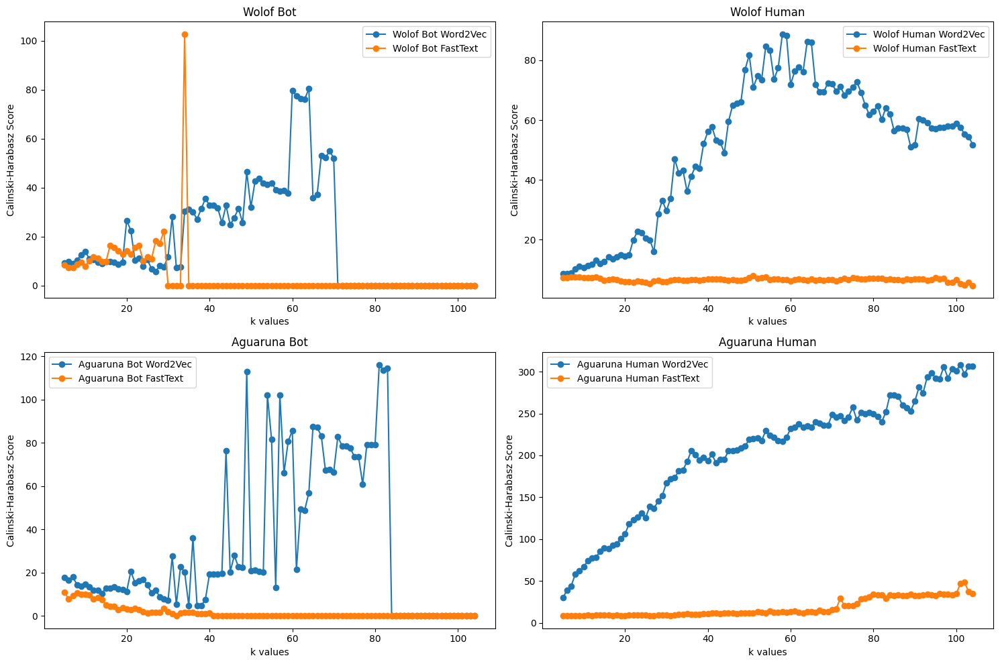

Best k values for each dataset:
Wolof Bot Word2Vec: 64
Wolof Human Word2Vec: 58
Aguaruna Bot Word2Vec: 81
Aguaruna Human Word2Vec: 101
Wolof Bot FastText: 34
Wolof Human FastText: 51
Aguaruna Bot FastText: 5
Aguaruna Human FastText: 102


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import calinski_harabasz_score
from tqdm import tqdm

# Define the datasets and their labels for easier management
languages = ['Wolof', 'Aguaruna']
types = ['Bot', 'Human']
models = ['Word2Vec', 'FastText']
datasets = {
    'Wolof Bot Word2Vec': vectors_wolof_bot,
    'Wolof Human Word2Vec': vectors_wolof_human,
    'Aguaruna Bot Word2Vec': vectors_aguaruna_bot,
    'Aguaruna Human Word2Vec': vectors_aguaruna_human,
    'Wolof Bot FastText': vectors_wolof_bot_ft,
    'Wolof Human FastText': vectors_wolof_human_ft,
    'Aguaruna Bot FastText': vectors_aguaruna_bot_ft,
    'Aguaruna Human FastText': vectors_aguaruna_human_ft
}

# Define k and h values for each dataset
k_h_values = {
    'Wolof Bot Word2Vec': {'k': 10, 'h': 15},
    'Wolof Human Word2Vec': {'k': 58, 'h': 15},
    'Aguaruna Bot Word2Vec': {'k': 22, 'h': 15},
    'Aguaruna Human Word2Vec': {'k': 59, 'h': 15},
    'Wolof Bot FastText': {'k': 59, 'h': 15},
    'Wolof Human FastText': {'k': 6, 'h': 15},
    'Aguaruna Bot FastText': {'k': 58, 'h': 15},
    'Aguaruna Human FastText': {'k': 57, 'h': 15}
}

fig, axs = plt.subplots(2, 2, figsize=(15, 10))  # Adjust subplot grid as necessary
axs = axs.flatten()
best_k_values = []

for idx, (lang_type, vectors) in enumerate(datasets.items()):
    k_values = range(5, 105)
    ch_scores = []
    max_ch_score = 0
    best_k = 0

    for k in tqdm(k_values, desc=f"Processing {lang_type}"):
        wishart = Wishart(wishart_neighbors=k, significance_level=k_h_values[lang_type]['h'])
        labels = wishart.fit(vectors)
        if np.unique(labels).size > 1:
            ch_score = calinski_harabasz_score(vectors, labels)
            ch_scores.append(ch_score)
            if ch_score > max_ch_score:
                max_ch_score = ch_score
                best_k = k
        else:
            ch_scores.append(0)  # Assign a zero score if only one cluster

    best_k_values.append(best_k)  # Append the best k for this dataset

    # Select the appropriate subplot based on language and type
    if 'Wolof' in lang_type:
        plot_index = 0 if 'Bot' in lang_type else 1
    else:  # Aguaruna
        plot_index = 2 if 'Bot' in lang_type else 3

    # Plotting
    axs[plot_index].plot(k_values, ch_scores, marker='o', linestyle='-', label=f'{lang_type}')
    axs[plot_index].set_title(f'{languages[plot_index // 2]} {types[plot_index % 2]}')
    axs[plot_index].set_xlabel('k values')
    axs[plot_index].set_ylabel('Calinski-Harabasz Score')
    axs[plot_index].legend()

plt.tight_layout()
plt.show()

print("Best k values for each dataset:")
for name, k in zip(datasets, best_k_values):
    print(f"{name}: {k}")


# **Cluster metrics**

In [ ]:
import numpy as np
from scipy.spatial.distance import pdist, squareform
import csv

In [ ]:
# Define the compute_cluster_metrics function
def compute_cluster_metrics(X, labels):
    unique_labels = np.unique(labels)
    metrics = {}

    for k in unique_labels:
        cluster_points = X[labels == k]
        centroid = np.mean(cluster_points, axis=0)
        distances = pdist(cluster_points, metric='euclidean')
        dist_matrix = squareform(distances)

        # 1. Root Mean Squared Standard Deviation (RMSSTD)
        rmsstd = np.sqrt(np.sum((cluster_points - centroid) ** 2) / len(cluster_points))

        # 2. Maximum Distance to the Centroid
        max_dist_to_centroid = np.max(np.sqrt(np.sum((cluster_points - centroid) ** 2, axis=1)))

        # 3. Average Distance to the Centroid
        avg_dist_to_centroid = np.mean(np.sqrt(np.sum((cluster_points - centroid) ** 2, axis=1)))

        # 4. Maximum Distance between Points in the Cluster
        max_dist_between_points = np.max(dist_matrix)

        # 5. Average Distance between Points in the Cluster
        avg_dist_between_points = np.mean(dist_matrix[np.triu_indices_from(dist_matrix, k=1)])  # exclude diagonal

        metrics[k] = {
            'RMSSTD': rmsstd,
            'Maximum Distance to Centroid': max_dist_to_centroid,
            'Average Distance to Centroid': avg_dist_to_centroid,
            'Maximum Distance between Points': max_dist_between_points,
            'Average Distance between Points': avg_dist_between_points
        }

    return metrics

In [ ]:
from scipy.spatial.distance import pdist, squareform
import csv

# Define the compute_cluster_metrics function
def compute_cluster_metrics(X, labels):
    unique_labels = np.unique(labels)
    metrics = {}

    for k in unique_labels:
        if k == -1:
            continue  # Skip noise points

        cluster_points = X[labels == k]
        if len(cluster_points) == 0:
            continue  # Skip empty clusters

        centroid = np.mean(cluster_points, axis=0)
        distances = pdist(cluster_points, metric='euclidean')
        dist_matrix = squareform(distances)

        # 1. Root Mean Squared Standard Deviation (RMSSTD)
        rmsstd = np.sqrt(np.sum((cluster_points - centroid) ** 2) / len(cluster_points))

        # 2. Maximum Distance to the Centroid
        max_dist_to_centroid = np.max(np.sqrt(np.sum((cluster_points - centroid) ** 2, axis=1)))

        # 3. Average Distance to the Centroid
        avg_dist_to_centroid = np.mean(np.sqrt(np.sum((cluster_points - centroid) ** 2, axis=1)))

        # 4. Maximum Distance between Points in the Cluster
        max_dist_between_points = np.max(dist_matrix)

        # 5. Average Distance between Points in the Cluster
        avg_dist_between_points = np.mean(dist_matrix[np.triu_indices_from(dist_matrix, k=1)])  # exclude diagonal

        metrics[k] = {
            'RMSSTD': rmsstd,
            'Maximum Distance to Centroid': max_dist_to_centroid,
            'Average Distance to Centroid': avg_dist_to_centroid,
            'Maximum Distance between Points': max_dist_between_points,
            'Average Distance between Points': avg_dist_between_points
        }

    return metrics



# Wolof Bot FastText
wishart_neighbors, significance_level = 82, 15
wishart = Wishart(wishart_neighbors, significance_level)
labels_wb = wishart.fit(vectors_wolof_bot)

# Compute the cluster metrics
cluster_metrics = compute_cluster_metrics(vectors_wolof_bot, labels_wb)

# Save the metrics to a CSV file
output_file_csv = 'wolof_bot_metrics.csv'
with open(output_file_csv, 'w', newline='') as f:
    writer = csv.writer(f)
    header = ['Cluster', 'RMSSTD', 'Maximum Distance to Centroid', 'Average Distance to Centroid', 'Maximum Distance between Points', 'Average Distance between Points']
    writer.writerow(header)
    for cluster, metrics in cluster_metrics.items():
        row = [cluster] + list(metrics.values())
        writer.writerow(row)

print(f"Metrics saved to {output_file_csv}")



# Wolof Human FastText
wishart_neighbors, significance_level = 74, 15
wishart = Wishart(wishart_neighbors, significance_level)
labels_wh = wishart.fit(vectors_wolof_human)

# Compute the cluster metrics
cluster_metrics = compute_cluster_metrics(vectors_wolof_human, labels_wh)

# Save the metrics to a CSV file
output_file_csv = 'wolof_human_metrics.csv'
with open(output_file_csv, 'w', newline='') as f:
    writer = csv.writer(f)
    header = ['Cluster', 'RMSSTD', 'Maximum Distance to Centroid', 'Average Distance to Centroid', 'Maximum Distance between Points', 'Average Distance between Points']
    writer.writerow(header)
    for cluster, metrics in cluster_metrics.items():
        row = [cluster] + list(metrics.values())
        writer.writerow(row)

print(f"Metrics saved to {output_file_csv}")



# Aguaruna Bot FastText
wishart_neighbors, significance_level = 79, 15
wishart = Wishart(wishart_neighbors, significance_level)
labels_ab = wishart.fit(vectors_aguaruna_bot)

# Compute the cluster metrics
cluster_metrics = compute_cluster_metrics(vectors_aguaruna_bot, labels_ab)

# Save the metrics to a CSV file
output_file_csv = 'aguaruna_bot_metrics.csv'
with open(output_file_csv, 'w', newline='') as f:
    writer = csv.writer(f)
    header = ['Cluster', 'RMSSTD', 'Maximum Distance to Centroid', 'Average Distance to Centroid', 'Maximum Distance between Points', 'Average Distance between Points']
    writer.writerow(header)
    for cluster, metrics in cluster_metrics.items():
        row = [cluster] + list(metrics.values())
        writer.writerow(row)

print(f"Metrics saved to {output_file_csv}")



# Aguaruna Human FastText
wishart_neighbors, significance_level = 104, 15
wishart = Wishart(wishart_neighbors, significance_level)
labels_ah = wishart.fit(vectors_aguaruna_human)

# Compute the cluster metrics
cluster_metrics = compute_cluster_metrics(vectors_aguaruna_human, labels_ah)

# Save the metrics to a CSV file
output_file_csv = 'aguaruna_human_metrics.csv'
with open(output_file_csv, 'w', newline='') as f:
    writer = csv.writer(f)
    header = ['Cluster', 'RMSSTD', 'Maximum Distance to Centroid', 'Average Distance to Centroid', 'Maximum Distance between Points', 'Average Distance between Points']
    writer.writerow(header)
    for cluster, metrics in cluster_metrics.items():
        row = [cluster] + list(metrics.values())
        writer.writerow(row)

print(f"Metrics saved to {output_file_csv}")



#
import numpy as np
from scipy.spatial.distance import pdist, squareform

def compute_cluster_metrics(X, labels):
    unique_labels = np.unique(labels)
    metrics = {}

    for k in unique_labels:
        if k == -1:
            continue  # Skip noise points

        cluster_points = X[labels == k]
        if len(cluster_points) == 0:
            continue  # Skip empty clusters

        centroid = np.mean(cluster_points, axis=0)
        distances = pdist(cluster_points, metric='euclidean')
        dist_matrix = squareform(distances)

        # 1. Root Mean Squared Standard Deviation (RMSSTD)
        rmsstd = np.sqrt(np.sum((cluster_points - centroid) ** 2) / len(cluster_points))

        # 2. Maximum Distance to the Centroid
        max_dist_to_centroid = np.max(np.sqrt(np.sum((cluster_points - centroid) ** 2, axis=1)))

        # 3. Average Distance to the Centroid
        avg_dist_to_centroid = np.mean(np.sqrt(np.sum((cluster_points - centroid) ** 2, axis=1)))

        # 4. Maximum Distance between Points in the Cluster
        max_dist_between_points = np.max(dist_matrix)

        # 5. Average Distance between Points in the Cluster
        avg_dist_between_points = np.mean(dist_matrix[np.triu_indices_from(dist_matrix, k=1)])  # exclude diagonal

        metrics[k] = {
            'RMSSTD': rmsstd,
            'Maximum Distance to Centroid': max_dist_to_centroid,
            'Average Distance to Centroid': avg_dist_to_centroid,
            'Maximum Distance between Points': max_dist_between_points,
            'Average Distance between Points': avg_dist_between_points
        }

    return metrics
#



# Wolof Bot FastText (alternate k)
wishart_neighbors, significance_level = 72, 15
wishart = Wishart(wishart_neighbors, significance_level)
labels_fwb = wishart.fit(vectors_wolof_bot_ft)

# Compute the cluster metrics
cluster_metrics = compute_cluster_metrics(vectors_wolof_bot_ft, labels_fwb)

# Save the metrics to a CSV file
output_file_csv = 'wolof_botft_metrics.csv'
with open(output_file_csv, 'w', newline='') as f:
    writer = csv.writer(f)
    header = ['Cluster', 'RMSSTD', 'Maximum Distance to Centroid', 'Average Distance to Centroid', 'Maximum Distance between Points', 'Average Distance between Points']
    writer.writerow(header)
    for cluster, metrics in cluster_metrics.items():
        row = [cluster] + list(metrics.values())
        writer.writerow(row)

print(f"Metrics saved to {output_file_csv}")



# Wolof Human FastText (alternate k)
wishart_neighbors, significance_level = 29, 15
wishart = Wishart(wishart_neighbors, significance_level)
labels_fwh = wishart.fit(vectors_wolof_human_ft)

# Compute the cluster metrics
cluster_metrics = compute_cluster_metrics(vectors_wolof_human_ft, labels_fwh)

# Save the metrics to a CSV file
output_file_csv = 'wolof_humanft_metrics.csv'
with open(output_file_csv, 'w', newline='') as f:
    writer = csv.writer(f)
    header = ['Cluster', 'RMSSTD', 'Maximum Distance to Centroid', 'Average Distance to Centroid', 'Maximum Distance between Points', 'Average Distance between Points']
    writer.writerow(header)
    for cluster, metrics in cluster_metrics.items():
        row = [cluster] + list(metrics.values())
        writer.writerow(row)
print(f"Metrics saved to {output_file_csv}")



# Aguaruna Bot FastText (alternate k)
wishart_neighbors, significance_level = 75, 15
wishart = Wishart(wishart_neighbors, significance_level)
labels_fab = wishart.fit(vectors_aguaruna_bot_ft)

# Compute the cluster metrics
cluster_metrics = compute_cluster_metrics(vectors_aguaruna_bot_ft, labels_fab)

# Save the metrics to a CSV file
output_file_csv = 'aguaruna_botft_metrics.csv'
with open(output_file_csv, 'w', newline='') as f:
    writer = csv.writer(f)
    header = ['Cluster', 'RMSSTD', 'Maximum Distance to Centroid', 'Average Distance to Centroid', 'Maximum Distance between Points', 'Average Distance between Points']
    writer.writerow(header)
    for cluster, metrics in cluster_metrics.items():
        row = [cluster] + list(metrics.values())
        writer.writerow(row)

print(f"Metrics saved to {output_file_csv}")



# Aguaruna Human FastText (alternate k)
wishart_neighbors, significance_level = 62, 15
wishart = Wishart(wishart_neighbors, significance_level)
labels_fah = wishart.fit(vectors_aguaruna_human_ft)

# Compute the cluster metrics
cluster_metrics = compute_cluster_metrics(vectors_aguaruna_human_ft, labels_fah)

# Save the metrics to a CSV file
output_file_csv = 'aguaruna_humanft_metrics.csv'
with open(output_file_csv, 'w', newline='') as f:
    writer = csv.writer(f)
    header = ['Cluster', 'RMSSTD', 'Maximum Distance to Centroid', 'Average Distance to Centroid', 'Maximum Distance between Points', 'Average Distance between Points']
    writer.writerow(header)
    for cluster, metrics in cluster_metrics.items():
        row = [cluster] + list(metrics.values())
        writer.writerow(row)

print(f"Metrics saved to {output_file_csv}")

Start clustering
Metrics saved to wolof_bot_metrics.csv
Start clustering
Metrics saved to wolof_human_metrics.csv
Start clustering
Metrics saved to aguaruna_bot_metrics.csv
Start clustering
Metrics saved to aguaruna_human_metrics.csv
Start clustering
Metrics saved to wolof_botft_metrics.csv
Start clustering
Metrics saved to wolof_humanft_metrics.csv
Start clustering
Metrics saved to aguaruna_botft_metrics.csv
Start clustering
Metrics saved to aguaruna_humanft_metrics.csv


In [ ]:
# Read and print the metrics from the CSV
df = pd.read_csv('wolof_bot_metrics.csv')
print(df.head())

   Cluster    RMSSTD  Maximum Distance to Centroid  \
0        1  1.362854                      3.194356   

   Average Distance to Centroid  Maximum Distance between Points  \
0                      1.302164                         4.778407   

   Average Distance between Points  
0                         1.801023  


In [ ]:
import pandas as pd
from scipy.stats import mannwhitneyu

# Load metrics from CSV files for Wolof and Aguaruna
files = {
    'Wolof Bot Word2Vec': 'wolof_bot_metrics.csv',
    'Wolof Human Word2Vec': 'wolof_human_metrics.csv',
    'Aguaruna Bot Word2Vec': 'aguaruna_bot_metrics.csv',
    'Aguaruna Human Word2Vec': 'aguaruna_human_metrics.csv',
    'Wolof Bot FastText': 'wolof_botft_metrics.csv',
    'Wolof Human FastText': 'wolof_humanft_metrics.csv',
    'Aguaruna Bot FastText': 'aguaruna_botft_metrics.csv',
    'Aguaruna Human FastText': 'aguaruna_humanft_metrics.csv'
}

metrics_to_test = ['RMSSTD', 'Maximum Distance to Centroid', 'Average Distance to Centroid', 'Maximum Distance between Points', 'Average Distance between Points']

def load_metrics(file):
    return pd.read_csv(file)

def perform_mann_whitney_test(metrics1, metrics2, metrics_to_test):
    results_summary = {'accepted': 0, 'rejected': 0}
    test_results = []

    for metric in metrics_to_test:
        data1 = metrics1[metric].dropna()
        data2 = metrics2[metric].dropna()
        stat, p_value = mannwhitneyu(data1, data2, alternative='two-sided')

        if p_value < 0.05:
            result = f"  -> Reject the null hypothesis: Distributions differ."
            results_summary['rejected'] += 1
        else:
            result = f"  -> Fail to reject the null hypothesis: No significant difference."
            results_summary['accepted'] += 1

        test_results.append((metric, stat, p_value, result))

    return results_summary, test_results

# Define pairs for comparison
comparison_pairs = [
    ('Wolof Bot Word2Vec', 'Wolof Human Word2Vec'),
    ('Aguaruna Bot Word2Vec', 'Aguaruna Human Word2Vec'),
    ('Wolof Bot FastText', 'Wolof Human FastText'),
    ('Aguaruna Bot FastText', 'Aguaruna Human FastText')
]

print("\nMann-Whitney U Test Results for Each Metric:")
for dataset1, dataset2 in comparison_pairs:
    print(f"\nComparing {dataset1} vs {dataset2}:")
    metrics1 = load_metrics(files[dataset1])
    metrics2 = load_metrics(files[dataset2])

    results_summary, test_results = perform_mann_whitney_test(metrics1, metrics2, metrics_to_test)

    for metric, stat, p_value, result in test_results:
        print(f"{metric}: U Statistic = {stat}, P-value = {p_value:.4e}")
        print(result)

    # Summarize results
    print("\nSummary:")
    print(f"Total Rejected: {results_summary['rejected']}")
    print(f"Total Accepted: {results_summary['accepted']}")

# Store results for further analysis (multiple testing results)
results = []

for comparison in comparison_pairs:
    name1, name2 = comparison
    metrics1 = load_metrics(files[name1])
    metrics2 = load_metrics(files[name2])

    p_values = []
    comparison_results = {'name1': name1, 'name2': name2, 'metrics': []}

    for metric in metrics_to_test:
        stat, p_value = mannwhitneyu(metrics1[metric], metrics2[metric], alternative='two-sided')
        comparison_results['metrics'].append((metric, stat, p_value))
        p_values.append(p_value)

    # Apply Holm-Bonferroni correction
    p_values = np.array(p_values)
    sorted_indices = np.argsort(p_values)
    m = len(p_values)
    adjusted_p_values = np.zeros(m)

    for i in range(m):
        adjusted_p_values[sorted_indices[i]] = min((0.05 / (m - i)), 1) * (p_values[sorted_indices[i]] * (m - i))

    comparison_results['adjusted_p_values'] = adjusted_p_values
    results.append(comparison_results)

    for i, (metric, stat, p_value) in enumerate(comparison_results['metrics']):
        print(f"{metric}: U Statistic = {stat}, P-value = {p_value:.4e}, Adjusted P-value = {adjusted_p_values[i]:.4e}")
        if adjusted_p_values[i] < 0.05:
            print("  -> Reject the null hypothesis: Distributions differ.")
        else:
            print("  -> Fail to reject the null hypothesis: No significant difference.")

# Save results for further analysis
results_df = pd.DataFrame(results)
results_df.to_csv('multiple_testing_results.csv', index=False)
print("\nResults have been saved to 'multiple_testing_results.csv'")



Mann-Whitney U Test Results for Each Metric:

Comparing Wolof Bot Word2Vec vs Wolof Human Word2Vec:
RMSSTD: U Statistic = 33.0, P-value = 1.1429e-01
  -> Fail to reject the null hypothesis: No significant difference.
Maximum Distance to Centroid: U Statistic = 34.0, P-value = 5.7143e-02
  -> Fail to reject the null hypothesis: No significant difference.
Average Distance to Centroid: U Statistic = 33.0, P-value = 1.1429e-01
  -> Fail to reject the null hypothesis: No significant difference.
Maximum Distance between Points: U Statistic = 33.0, P-value = 1.1429e-01
  -> Fail to reject the null hypothesis: No significant difference.
Average Distance between Points: U Statistic = 33.0, P-value = 1.1429e-01
  -> Fail to reject the null hypothesis: No significant difference.

Summary:
Total Rejected: 0
Total Accepted: 5

Comparing Aguaruna Bot Word2Vec vs Aguaruna Human Word2Vec:
RMSSTD: U Statistic = 150.0, P-value = 3.8912e-01
  -> Fail to reject the null hypothesis: No significant differe

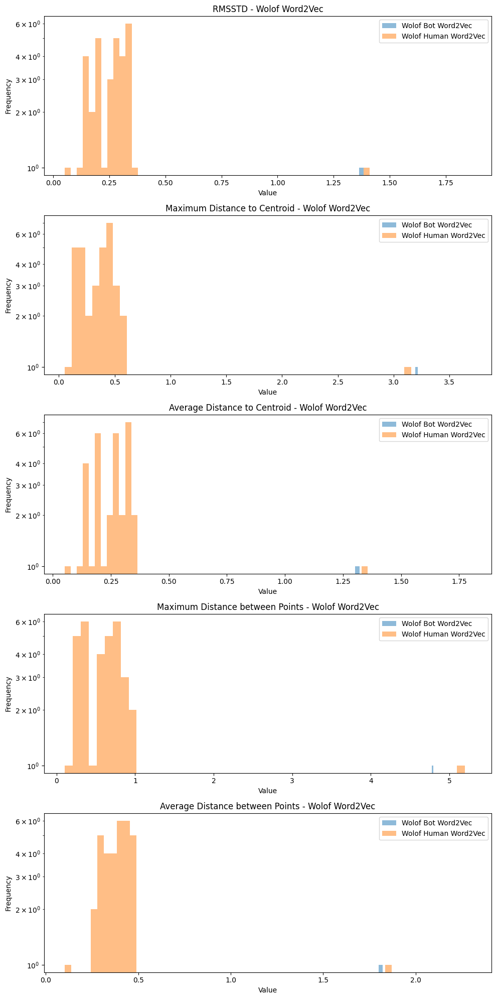

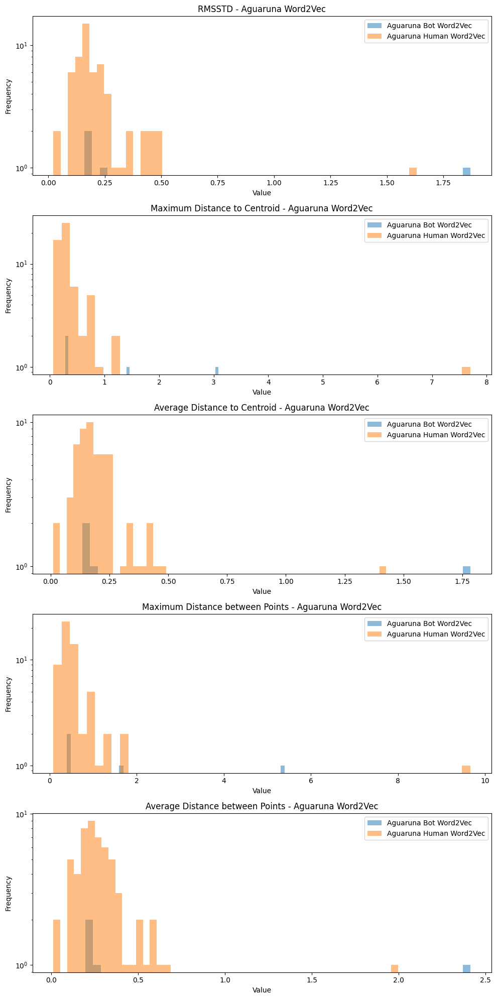

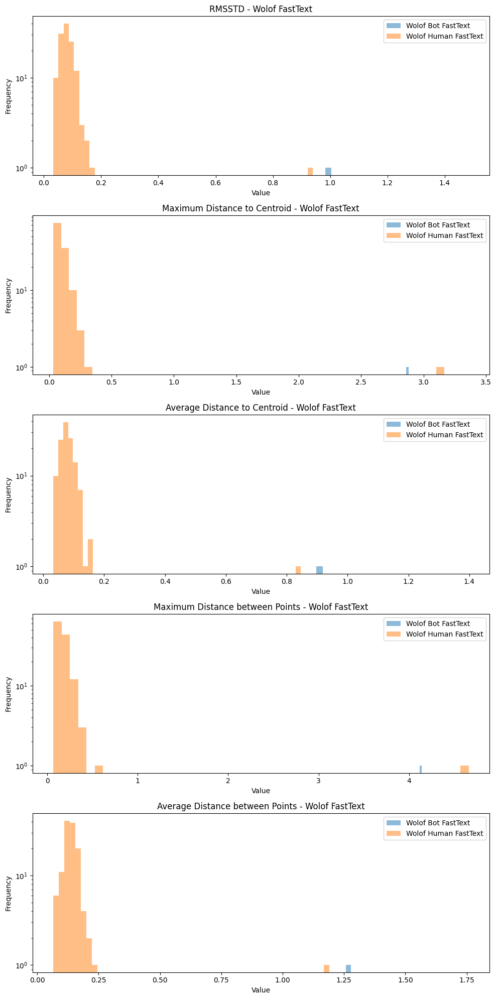

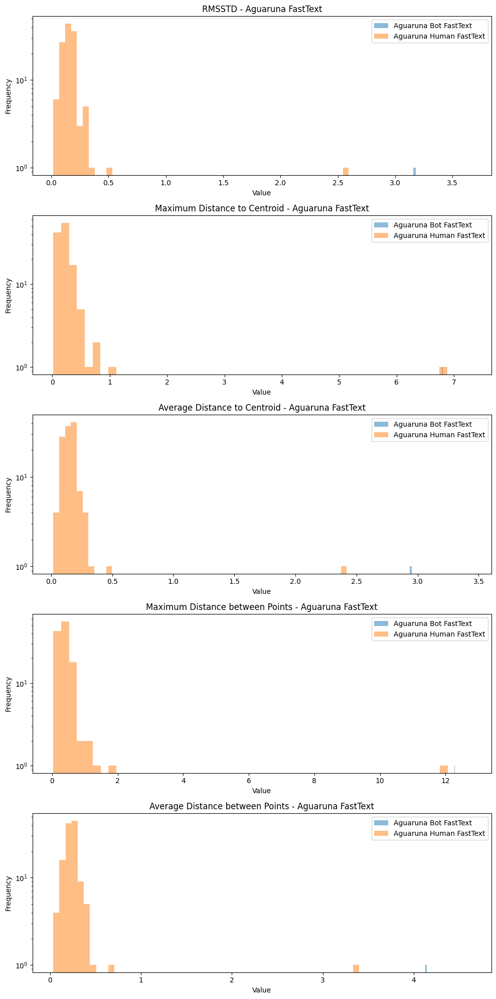

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV files
wolof_bot_w2v_metrics = pd.read_csv('wolof_bot_metrics.csv')
wolof_human_w2v_metrics = pd.read_csv('wolof_human_metrics.csv')
aguaruna_bot_w2v_metrics = pd.read_csv('aguaruna_bot_metrics.csv')
aguaruna_human_w2v_metrics = pd.read_csv('aguaruna_human_metrics.csv')
wolof_bot_ft_metrics = pd.read_csv('wolof_botft_metrics.csv')
wolof_human_ft_metrics = pd.read_csv('wolof_humanft_metrics.csv')
aguaruna_bot_ft_metrics = pd.read_csv('aguaruna_botft_metrics.csv')
aguaruna_human_ft_metrics = pd.read_csv('aguaruna_humanft_metrics.csv')

# List of metrics to plot
metrics_to_plot = ['RMSSTD', 'Maximum Distance to Centroid', 'Average Distance to Centroid',
                   'Maximum Distance between Points', 'Average Distance between Points']

# Function to plot histograms for each metric
def plot_histograms(data1, data2, label1, label2, title):
    fig, axs = plt.subplots(len(metrics_to_plot), 1, figsize=(10, 20))
    for i, metric in enumerate(metrics_to_plot):
        axs[i].hist(data1[metric], bins=50, alpha=0.5, label=label1, log=True)
        axs[i].hist(data2[metric], bins=50, alpha=0.5, label=label2, log=True)
        axs[i].set_title(f'{metric} - {title}')
        axs[i].set_xlabel('Value')
        axs[i].set_ylabel('Frequency')
        axs[i].legend()
    plt.tight_layout()
    plt.show()

# Plot histograms for each comparison
plot_histograms(wolof_bot_w2v_metrics, wolof_human_w2v_metrics, 'Wolof Bot Word2Vec', 'Wolof Human Word2Vec', 'Wolof Word2Vec')
plot_histograms(aguaruna_bot_w2v_metrics, aguaruna_human_w2v_metrics, 'Aguaruna Bot Word2Vec', 'Aguaruna Human Word2Vec', 'Aguaruna Word2Vec')
plot_histograms(wolof_bot_ft_metrics, wolof_human_ft_metrics, 'Wolof Bot FastText', 'Wolof Human FastText', 'Wolof FastText')
plot_histograms(aguaruna_bot_ft_metrics, aguaruna_human_ft_metrics, 'Aguaruna Bot FastText', 'Aguaruna Human FastText', 'Aguaruna FastText')


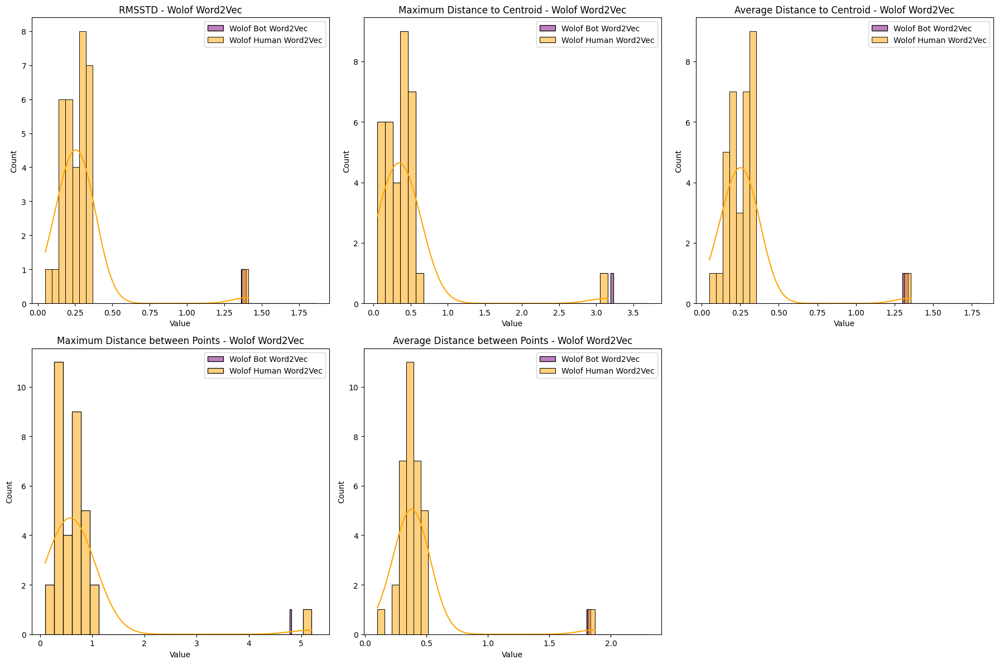

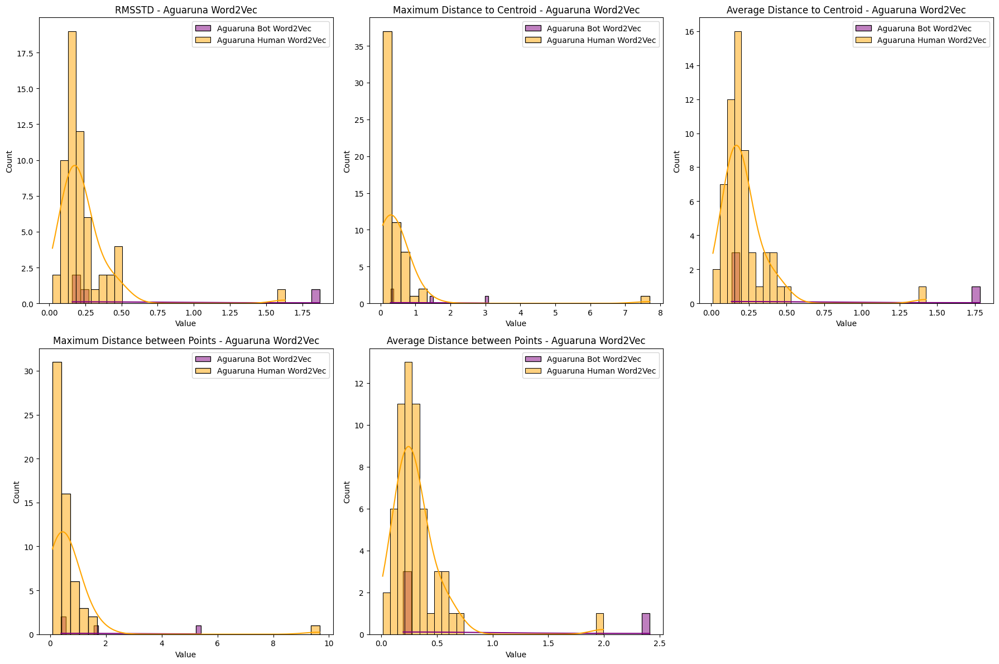

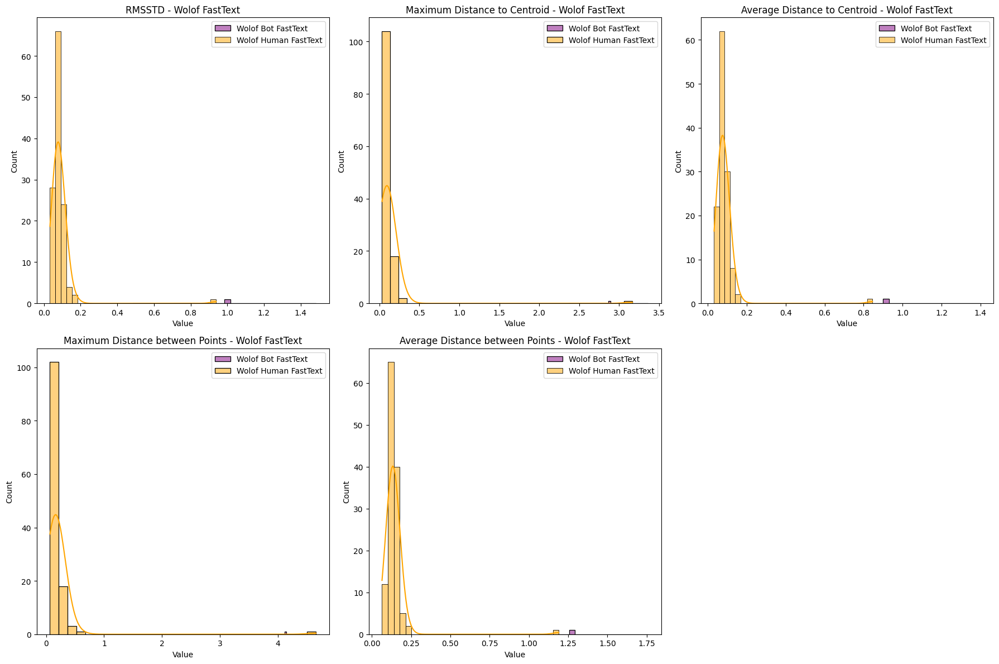

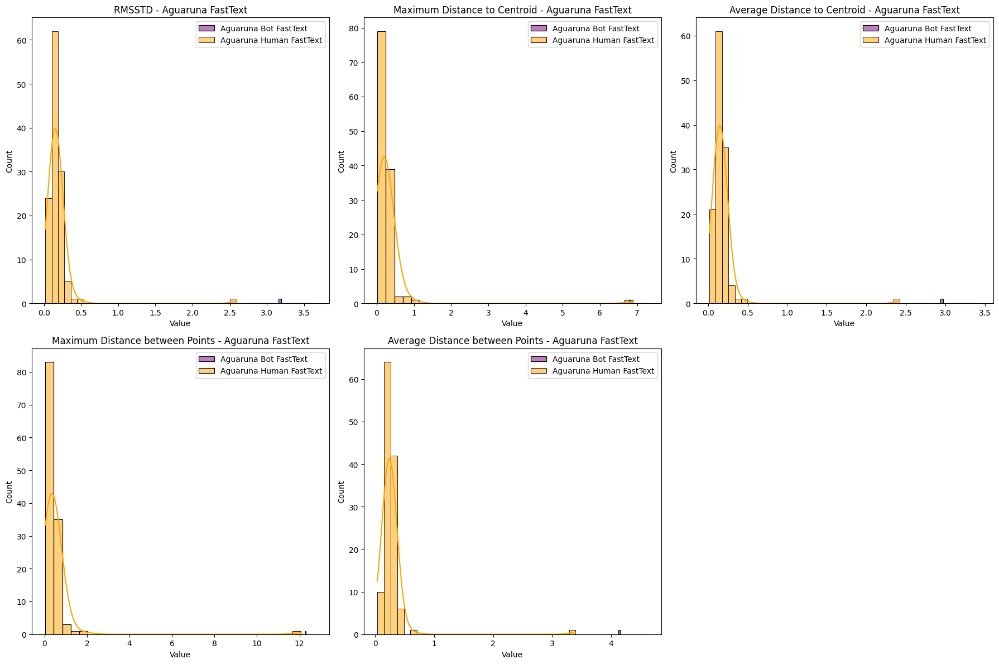

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the CSV files
wolof_bot_w2v_metrics = pd.read_csv('wolof_bot_metrics.csv')
wolof_human_w2v_metrics = pd.read_csv('wolof_human_metrics.csv')
aguaruna_bot_w2v_metrics = pd.read_csv('aguaruna_bot_metrics.csv')
aguaruna_human_w2v_metrics = pd.read_csv('aguaruna_human_metrics.csv')
wolof_bot_ft_metrics = pd.read_csv('wolof_botft_metrics.csv')
wolof_human_ft_metrics = pd.read_csv('wolof_humanft_metrics.csv')
aguaruna_bot_ft_metrics = pd.read_csv('aguaruna_botft_metrics.csv')
aguaruna_human_ft_metrics = pd.read_csv('aguaruna_humanft_metrics.csv')

# List of metrics to plot
metrics_to_plot = ['RMSSTD', 'Maximum Distance to Centroid', 'Average Distance to Centroid',
                   'Maximum Distance between Points', 'Average Distance between Points']

# Function to plot histograms with KDE for each metric
def plot_histograms(data1, data2, label1, label2, title):
    num_metrics = len(metrics_to_plot)
    cols = 3
    rows = (num_metrics + cols - 1) // cols

    fig, axs = plt.subplots(rows, cols, figsize=(18, 12))
    axs = axs.flatten()

    for i, metric in enumerate(metrics_to_plot):
        sns.histplot(data1[metric], bins=30, kde=True, color='purple', alpha=0.5, ax=axs[i], label=label1)
        sns.histplot(data2[metric], bins=30, kde=True, color='orange', alpha=0.5, ax=axs[i], label=label2)
        axs[i].set_title(f'{metric} - {title}')
        axs[i].set_xlabel('Value')
        axs[i].set_ylabel('Count')
        axs[i].legend()

    # Remove any unused subplots
    for j in range(i+1, len(axs)):
        fig.delaxes(axs[j])

    plt.tight_layout()
    plt.show()

# Plot histograms for each comparison
plot_histograms(wolof_bot_w2v_metrics, wolof_human_w2v_metrics, 'Wolof Bot Word2Vec', 'Wolof Human Word2Vec', 'Wolof Word2Vec')
plot_histograms(aguaruna_bot_w2v_metrics, aguaruna_human_w2v_metrics, 'Aguaruna Bot Word2Vec', 'Aguaruna Human Word2Vec', 'Aguaruna Word2Vec')
plot_histograms(wolof_bot_ft_metrics, wolof_human_ft_metrics, 'Wolof Bot FastText', 'Wolof Human FastText', 'Wolof FastText')
plot_histograms(aguaruna_bot_ft_metrics, aguaruna_human_ft_metrics, 'Aguaruna Bot FastText', 'Aguaruna Human FastText', 'Aguaruna FastText')


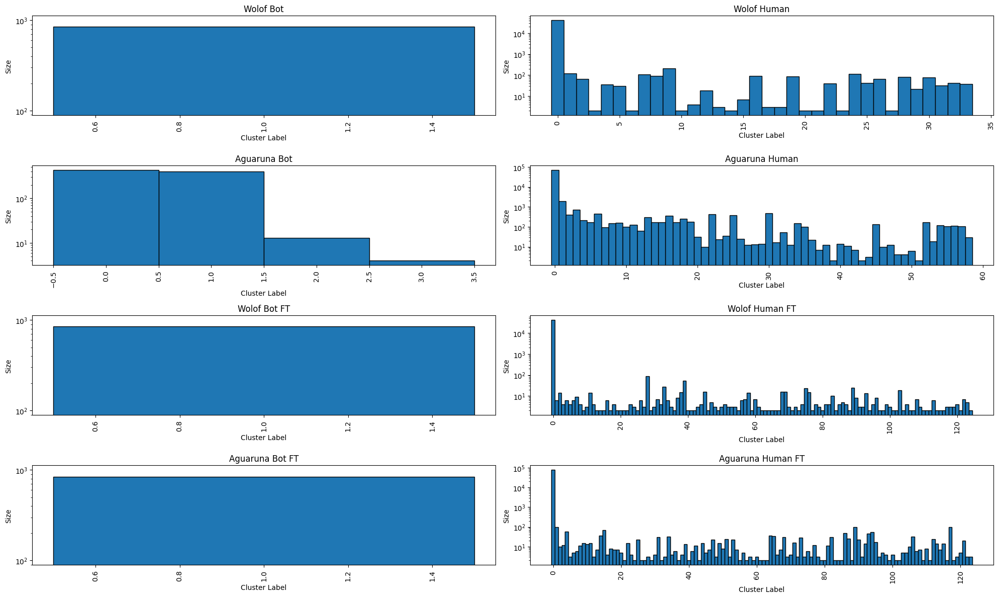

In [ ]:
import matplotlib.pyplot as plt
from collections import Counter

# Create a list of all labels for easy iteration
label_sets = [labels_wb, labels_wh, labels_ab, labels_ah, labels_fwb, labels_fwh, labels_fab, labels_fah]
titles = ["Wolof Bot", "Wolof Human", "Aguaruna Bot", "Aguaruna Human",
          "Wolof Bot FT", "Wolof Human FT", "Aguaruna Bot FT", "Aguaruna Human FT"]

# Plotting
plt.figure(figsize=(20, 12))
for i, labels in enumerate(label_sets, 1):
    plt.subplot(4, 2, i)
    cluster_sizes = Counter(labels)
    sorted_cluster_sizes = sorted(cluster_sizes.items())
    sorted_labels, sorted_sizes = zip(*sorted_cluster_sizes)

    plt.bar(sorted_labels, sorted_sizes, width=1.0, edgecolor="black")
    plt.title(titles[i-1])
    plt.xlabel('Cluster Label')
    plt.ylabel('Size')
    plt.yscale('log')  # Logarithmic scale
    plt.xticks(rotation=90)

plt.tight_layout()
plt.show()


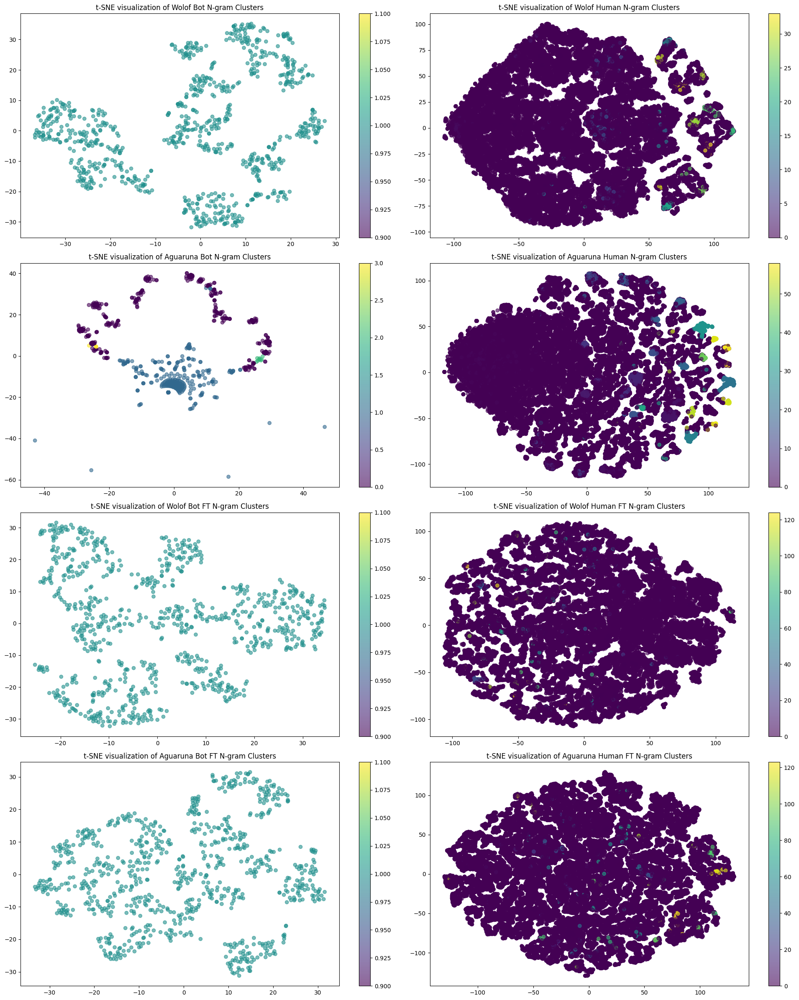

In [ ]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.metrics.pairwise import euclidean_distances
import numpy as np

# Function to find representative n-grams for each cluster
def find_representative_ngrams(ngrams, vectors, labels):
    # Check for out of bounds label indices
    if np.any(labels >= len(vectors)):
        raise ValueError("Label index exceeds vector bounds")

    unique_labels = np.unique(labels)
    representative_ngrams = {}

    for label in unique_labels:
        cluster_indices = np.where(labels == label)[0]
        if cluster_indices.size == 0:
            continue
        cluster_vectors = vectors[cluster_indices]
        cluster_center = np.mean(cluster_vectors, axis=0)
        distances = euclidean_distances(cluster_vectors, [cluster_center])
        min_index = np.argmin(distances)
        representative_ngram = ngrams[cluster_indices[min_index]]
        representative_ngrams[label] = representative_ngram

    return representative_ngrams

#
ngrams_lists = [ngrams_wolof_bot, ngrams_wolof_human, ngrams_aguaruna_bot, ngrams_aguaruna_human,
                ngrams_wolof_bot_ft, ngrams_wolof_human_ft, ngrams_aguaruna_bot_ft, ngrams_aguaruna_human_ft]

#
vectors_lists = [vectors_wolof_bot, vectors_wolof_human, vectors_aguaruna_bot, vectors_aguaruna_human,
                 vectors_wolof_bot_ft, vectors_wolof_human_ft, vectors_aguaruna_bot_ft, vectors_aguaruna_human_ft]


plt.figure(figsize=(20, 24))
for i, (labels, vectors, ngrams) in enumerate(zip(label_sets, vectors_lists, ngrams_lists), 1):
    plt.subplot(4, 2, i)

    # Ensure labels do not exceed vector bounds
    if max(labels) >= len(vectors):
        print(f"Skipping dataset {i} due to label index exceeding vector bounds.")
        continue

    # Calculate representative n-grams
    rep_ngrams = find_representative_ngrams(ngrams, vectors, labels)

    # Perform t-SNE
    tsne = TSNE(n_components=2, perplexity=30, max_iter=1000)
    tsne_results = tsne.fit_transform(vectors)

    scatter = plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=labels, cmap='viridis', alpha=0.6)
    plt.colorbar(scatter)

    # Annotate representative n-grams
    """for label, ngram in rep_ngrams.items():
        indices = np.where(labels == label)[0]
        mean_x = np.mean(tsne_results[indices, 0])
        mean_y = np.mean(tsne_results[indices, 1])
        plt.annotate(ngram, (mean_x, mean_y), textcoords="offset points", xytext=(0,10), ha='center')"""

    plt.title(f't-SNE visualization of {titles[i-1]} N-gram Clusters')

plt.tight_layout()
plt.show()


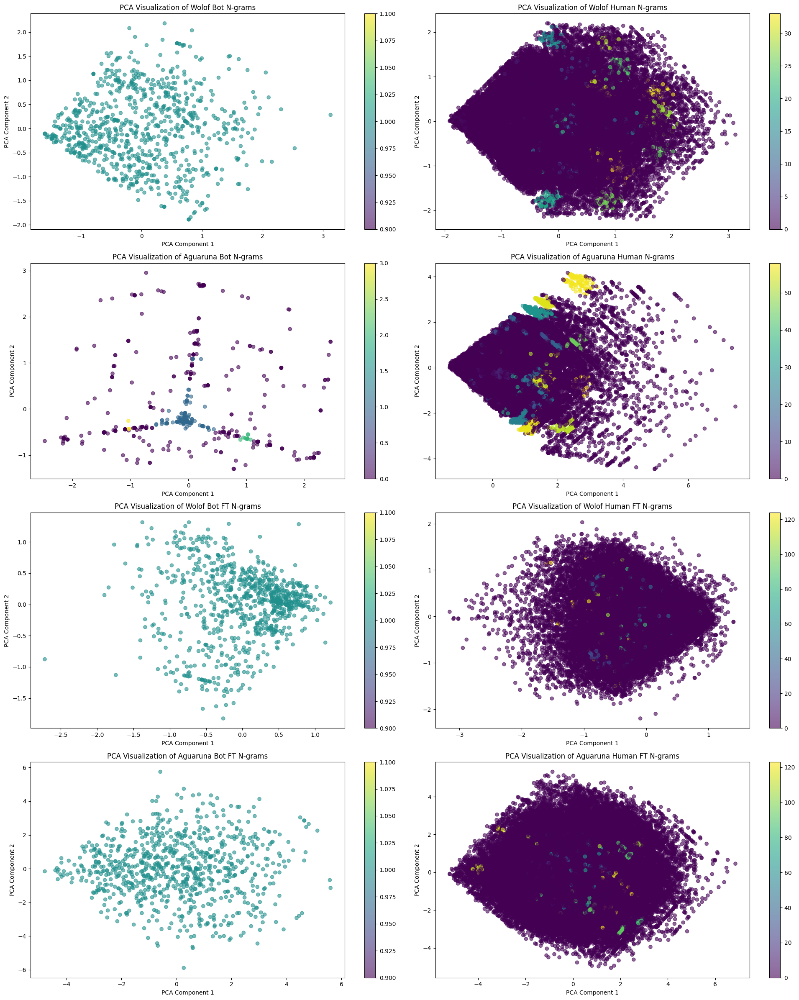

In [ ]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

plt.figure(figsize=(20, 24))
for i, (vectors, labels) in enumerate(zip(vectors_lists, label_sets), 1):
    plt.subplot(4, 2, i)
    pca = PCA(n_components=2)
    reduced_vectors = pca.fit_transform(vectors)

    scatter = plt.scatter(reduced_vectors[:, 0], reduced_vectors[:, 1], c=labels, cmap='viridis', alpha=0.6)
    plt.colorbar(scatter)
    plt.title(f'PCA Visualization of {titles[i-1]} N-grams')
    plt.xlabel('PCA Component 1')
    plt.ylabel('PCA Component 2')

plt.tight_layout()
plt.show()
